In [1]:
# importing relevant libraries for machine learning
from sklearn.metrics import mean_squared_error, mean_absolute_percentage_error
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn import gaussian_process
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from scipy import stats
from sklearn.preprocessing import PowerTransformer, QuantileTransformer, MinMaxScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import RandomizedSearchCV, TimeSeriesSplit
from sklearn.model_selection import GridSearchCV
from scipy.stats import uniform

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, Matern, DotProduct, WhiteKernel
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import expon, uniform
from optuna.integration import LightGBMPruningCallback
import lightgbm as lgb
import xgboost as xgb
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
import optuna
import warnings
warnings.filterwarnings('ignore')


import matplotlib.dates as mdates

In [2]:
df_ERA5L = pd.read_csv('ERA5_Land.csv')
df_gen = pd.read_csv('SHL_003.csv')

In [3]:
# setting Timestamp columns as the index
df_gen['Timestamp'] = pd.to_datetime(df_gen['Timestamp'])
df_gen = df_gen.set_index('Timestamp')
# aggregating the df_gen into hourly dataset
df_gen = df_gen['Sandford Hydro (KW)']
df_gen = pd.DataFrame(df_gen)
# Daily aggregation to be used for subsequent modelling 
df_gen = df_gen.resample('d').mean()
df_gen = df_gen.interpolate(method='linear', limit_direction='both', axis=0)
df_gen.rename(columns={'Sandford Hydro (KW)': 'KW'}, inplace=True)

In [4]:
df_ERA5L['time'] = pd.to_datetime(df_ERA5L['time'])
df_ERA5L.set_index('time', inplace=True)

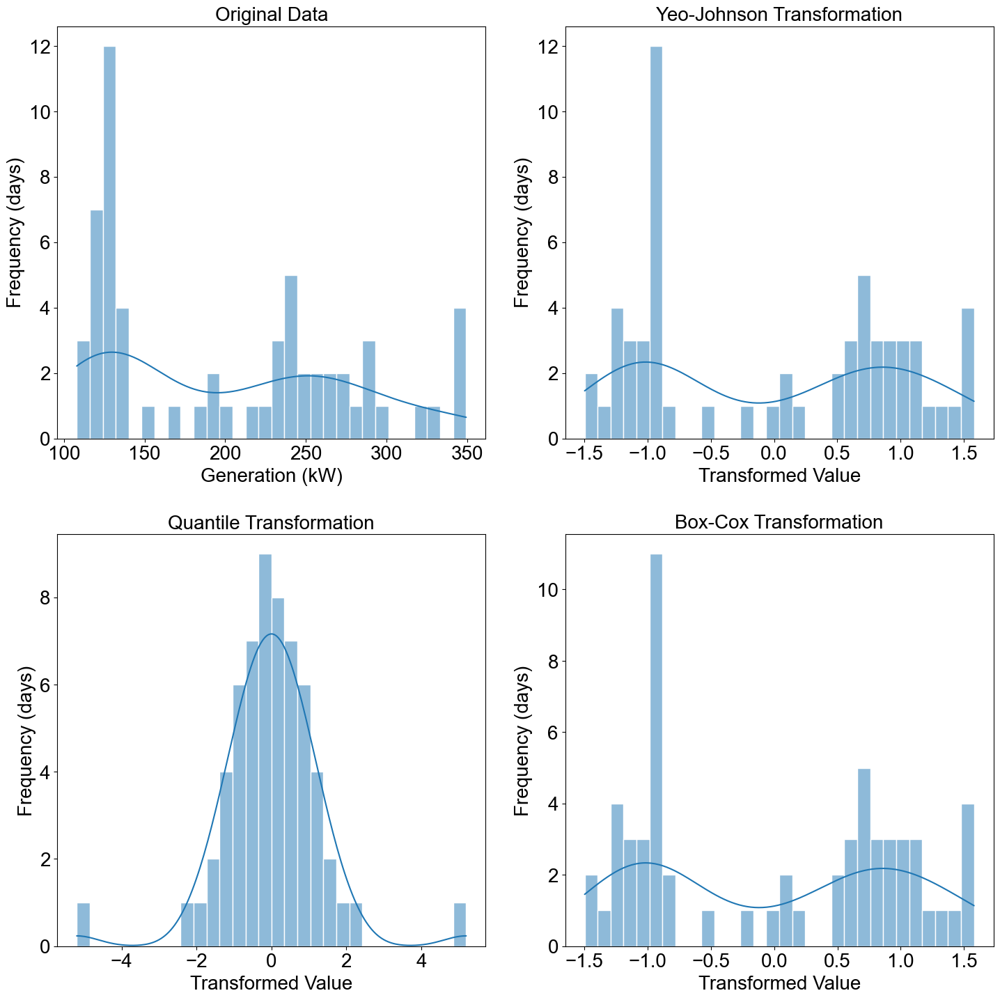

In [5]:
# Prepare subplots
fig, axs = plt.subplots(2, 2, figsize=(15, 15))

# Style configurations
sns.set_style("whitegrid")
title_fontsize = 20
axis_fontsize = 20

# Original data histogram
sns.histplot(df_gen['KW'], bins=30, kde=True, ax=axs[0, 0], legend=False)
axs[0, 0].set_title('Original Data', fontsize=title_fontsize)
axs[0, 0].set_xlabel('Generation (kW)',  fontsize=axis_fontsize)
axs[0, 0].set_ylabel('Frequency (days)', fontsize=axis_fontsize)

# Yeo-Johnson Transformation
yeo_johnson_transformer = PowerTransformer(method='yeo-johnson')
df_gen_yj = yeo_johnson_transformer.fit_transform(df_gen['KW'].values.reshape(-1, 1))
sns.histplot(df_gen_yj, bins=30, kde=True, ax=axs[0, 1], legend=False)
axs[0, 1].set_title('Yeo-Johnson Transformation', fontsize=title_fontsize)
axs[0, 1].set_xlabel('Transformed Value',  fontsize=axis_fontsize)
axs[0, 1].set_ylabel('Frequency (days)',  fontsize=axis_fontsize)

# Quantile Transformation
quantile_transformer = QuantileTransformer(output_distribution='normal')
df_gen_qt = quantile_transformer.fit_transform(df_gen['KW'].values.reshape(-1, 1))
sns.histplot(df_gen_qt, bins=30, kde=True, ax=axs[1, 0], legend=False)
axs[1, 0].set_title('Quantile Transformation', fontsize=title_fontsize)
axs[1, 0].set_xlabel('Transformed Value', fontsize=axis_fontsize)
axs[1, 0].set_ylabel('Frequency (days)', fontsize=axis_fontsize)

# Box-Cox Transformation
box_cox_transformer = PowerTransformer(method='box-cox')
df_gen_bc = box_cox_transformer.fit_transform(df_gen['KW'].values.reshape(-1, 1))
sns.histplot(df_gen_bc, bins=30, kde=True, ax=axs[1, 1], legend=False)
axs[1, 1].set_title('Box-Cox Transformation', fontsize=title_fontsize)
axs[1, 1].set_xlabel('Transformed Value', fontsize=axis_fontsize)
axs[1, 1].set_ylabel('Frequency (days)' , fontsize=axis_fontsize)

# Incease axis label font size
axs[0, 0].tick_params(axis='both', labelsize=20)
axs[0, 1].tick_params(axis='both', labelsize=20)
axs[1, 0].tick_params(axis='both', labelsize=20)
axs[1, 1].tick_params(axis='both', labelsize=20)


# Improve spacing and layout
plt.tight_layout(pad=3.0)
plt.show()

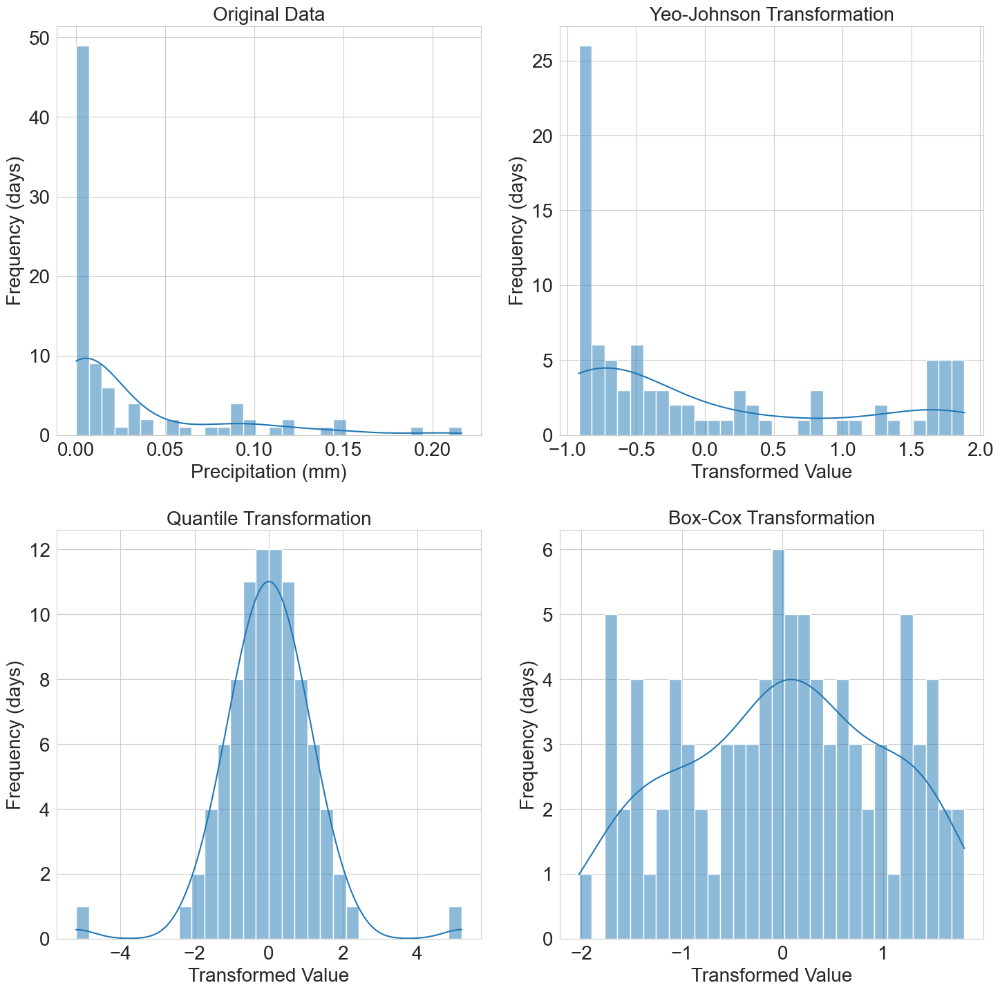

In [6]:
# Prepare subplots
fig, axs = plt.subplots(2, 2, figsize=(15, 15))

# Style configurations
sns.set_style("whitegrid")
title_fontsize = 20
axis_fontsize = 20

# Original data histogram
sns.histplot(df_ERA5L['tp'], bins=30, kde=True, ax=axs[0, 0], legend=False)
axs[0, 0].set_title('Original Data', fontsize=title_fontsize)
axs[0, 0].set_xlabel('Precipitation (mm)', fontsize=axis_fontsize)
axs[0, 0].set_ylabel('Frequency (days)', fontsize=axis_fontsize)

# Yeo-Johnson Transformation
yeo_johnson_transformer = PowerTransformer(method='yeo-johnson')
df_ERA5L_yj = yeo_johnson_transformer.fit_transform(df_ERA5L['tp'].values.reshape(-1, 1))
sns.histplot(df_ERA5L_yj, bins=30, kde=True, ax=axs[0, 1], legend=False)
axs[0, 1].set_title('Yeo-Johnson Transformation', fontsize=title_fontsize)
axs[0, 1].set_xlabel('Transformed Value', fontsize=axis_fontsize)
axs[0, 1].set_ylabel('Frequency (days)', fontsize=axis_fontsize)

# Quantile Transformation
quantile_transformer = QuantileTransformer(output_distribution='normal')
df_ERA5L_qt = quantile_transformer.fit_transform(df_ERA5L['tp'].values.reshape(-1, 1))
sns.histplot(df_ERA5L_qt, bins=30, kde=True, ax=axs[1, 0], legend=False)
axs[1, 0].set_title('Quantile Transformation', fontsize=title_fontsize)
axs[1, 0].set_xlabel('Transformed Value', fontsize=axis_fontsize)
axs[1, 0].set_ylabel('Frequency (days)', fontsize=axis_fontsize)

# Box-Cox Transformation
box_cox_transformer = PowerTransformer(method='box-cox')
df_ERA5L_bc = box_cox_transformer.fit_transform(df_ERA5L['tp'].values.reshape(-1, 1))
sns.histplot(df_ERA5L_bc, bins=30, kde=True, ax=axs[1, 1], legend=False)
axs[1, 1].set_title('Box-Cox Transformation', fontsize=title_fontsize)
axs[1, 1].set_xlabel('Transformed Value', fontsize=axis_fontsize)
axs[1, 1].set_ylabel('Frequency (days)', fontsize=axis_fontsize)

# Incease axis label font size
axs[0, 0].tick_params(axis='both', labelsize=20)
axs[0, 1].tick_params(axis='both', labelsize=20)
axs[1, 0].tick_params(axis='both', labelsize=20)
axs[1, 1].tick_params(axis='both', labelsize=20)


# Improve spacing and layout
plt.tight_layout(pad=3.0)
plt.show()

Power transform and scale the data to minimise the skewness and bring them to similar scale

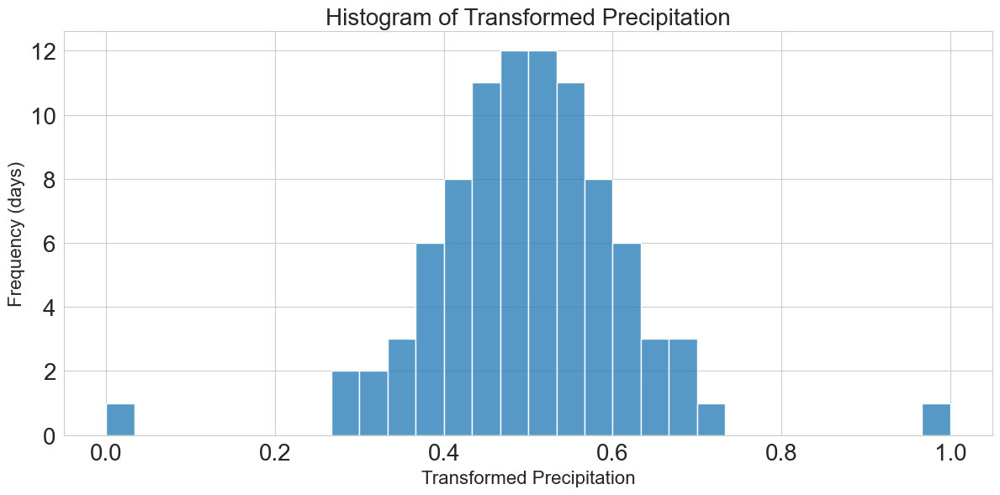

In [7]:
# Create a QuantileTransformer object with output_distribution set to 'normal'
qt_tp = QuantileTransformer(output_distribution='normal', n_quantiles=61)

# Perform the transformation
# Note that QuantileTransformer expects a 2D array, so we use tp.values.reshape(-1, 1)
df_ERA5L['tp'] = qt_tp.fit_transform(df_ERA5L['tp'].values.reshape(-1, 1))

# Create a MinMaxScaler object
scaler_tp = MinMaxScaler()

# Perform the scaling on the transformed data
df_ERA5L['tp'] = scaler_tp.fit_transform(df_ERA5L['tp'].values.reshape(-1, 1))

# Style configurations
sns.set_style("whitegrid")
title_fontsize = 20
axis_fontsize = 16
color = 'tab:blue'

# Prepare the plot
plt.figure(figsize=(12, 6))
sns.histplot(df_ERA5L['tp'], bins=30, color=color, kde=False)

# Setting titles and labels
plt.title('Histogram of Transformed Precipitation', fontsize=title_fontsize)
plt.xlabel('Transformed Precipitation', fontsize=axis_fontsize)
plt.ylabel('Frequency (days)', fontsize=axis_fontsize)
plt.tick_params(axis='both', labelsize=20)  


# Layout adjustments
plt.tight_layout()
plt.show()


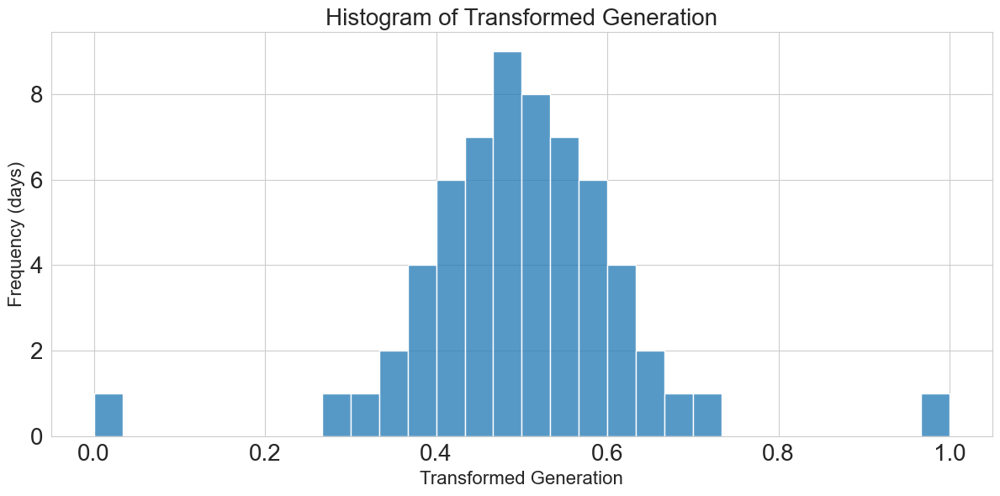

In [8]:
from sklearn.preprocessing import QuantileTransformer, MinMaxScaler
import matplotlib.pyplot as plt

# Create a QuantileTransformer object with output_distribution set to 'normal'
qt_kw = QuantileTransformer(output_distribution='normal', n_quantiles=61)

# Perform the transformation
# Note that QuantileTransformer expects a 2D array, so we use KW.values.reshape(-1, 1)
df_gen['KW'] = qt_kw.fit_transform(df_gen['KW'].values.reshape(-1, 1))

# Create a MinMaxScaler object
scaler_kw = MinMaxScaler()

# Perform the scaling on the transformed data
df_gen['KW'] = scaler_kw.fit_transform(df_gen['KW'].values.reshape(-1, 1))

# Style configurations
sns.set_style("whitegrid")
title_fontsize = 20
axis_fontsize = 16
color = 'tab:blue'

# Prepare the plot
plt.figure(figsize=(12, 6))
sns.histplot(df_gen['KW'], bins=30, color=color, kde=False)

# Setting titles and labels
plt.title('Histogram of Transformed Generation', fontsize=title_fontsize)
plt.xlabel('Transformed Generation', fontsize=axis_fontsize)
plt.ylabel('Frequency (days)', fontsize=axis_fontsize)
plt.tick_params(axis='both', labelsize=20)

# Layout adjustments
plt.tight_layout()
plt.show()

In [9]:
df_lag_ERA5L = df_ERA5L.copy()
df_lag_ERA5L['tp_lag_5'] = df_lag_ERA5L['tp'].shift(periods=4)

df_lag_rs_ERA5L = df_lag_ERA5L.copy()
df_lag_rs_ERA5L['tp_rs_12'] = df_lag_rs_ERA5L['tp'].rolling(12).sum()

df_lag_rs_rslag_ERA5L = df_lag_rs_ERA5L.copy()
df_lag_rs_rslag_ERA5L['tp_rs_12_lag_5'] = df_lag_rs_rslag_ERA5L['tp_rs_12'].shift(periods=4)

In [10]:
# current dataframe
df = pd.merge(df_gen, df_ERA5L, left_index=True, right_index=True)

# current and lagged dataframe
df_lag = pd.merge(df_gen, df_lag_ERA5L, left_index=True, right_index=True)

# lagged only dataframe
df_lag_o = df_lag.drop(['tp'], axis=1)

# current, lagged and rolling sum dataframe
df_lag_rs = pd.merge(df_gen, df_lag_rs_ERA5L, left_index=True, right_index=True)

# rolling sum only dataframe
df_rs_o = df_lag_rs.drop(['tp', 'tp_lag_5'], axis=1)

# current, lagged, rolling sum, and lag of rolling sum dataframe
df_lag_rs_rslag = pd.merge(df_gen, df_lag_rs_rslag_ERA5L, left_index=True, right_index=True)

# lag of rolling sum only dataframe
df_rslag_o = df_lag_rs_rslag.drop(['tp', 'tp_lag_5', 'tp_rs_12'], axis=1)

In [11]:
df_lag_rs_rslag.dropna(inplace=True)
df_rslag_o.dropna(inplace=True)

In [12]:
def create_features(df):

    df['day'] = df.index.day
    df['month'] = df.index.month
    df['dayofweek'] = df.index.dayofweek
    df['dayofyear'] = df.index.dayofyear
    df['weekofyear'] = df.index.isocalendar().week

    # Extract original time features
    time_features = ['day', 'month', 'dayofweek', 'dayofyear', 'weekofyear']
    original_df = df[time_features].copy()
    
    # Perform cyclical encoding
    original_df['day_sin'] = np.sin(2 * np.pi * original_df['day']/31)
    original_df['day_cos'] = np.cos(2 * np.pi * original_df['day']/31)

    original_df['month_sin'] = np.sin(2 * np.pi * original_df['month']/12)
    original_df['month_cos'] = np.cos(2 * np.pi * original_df['month']/12)

    original_df['dayofweek_sin'] = np.sin(2 * np.pi * original_df['dayofweek']/7)
    original_df['dayofweek_cos'] = np.cos(2 * np.pi * original_df['dayofweek']/7)

    original_df['dayofyear_sin'] = np.sin(2 * np.pi * original_df['dayofyear']/365)
    original_df['dayofyear_cos'] = np.cos(2 * np.pi * original_df['dayofyear']/365)

    original_df['weekofyear_sin'] = np.sin(2 * np.pi * original_df['weekofyear']/52)
    original_df['weekofyear_cos'] = np.cos(2 * np.pi * original_df['weekofyear']/52)
    
    # Drop the original time features
    encoded_features = original_df.drop(columns=time_features)
    
    # Apply MinMaxScaler only to the encoded time features
    scaler = MinMaxScaler()
    encoded_scaled = pd.DataFrame(scaler.fit_transform(encoded_features), columns=encoded_features.columns, index=encoded_features.index)
    
    # Drop original time features from the original dataframe
    df = df.drop(columns=time_features)
    
    # Concatenate the scaled encoded features with the rest of the original dataframe
    df = pd.concat([df, encoded_scaled], axis=1)
    
    return df

df = create_features(df)
df_lag_o = create_features(df_lag_o)
df_lag = create_features(df_lag)
df_lag_rs = create_features(df_lag_rs)
df_rs_o = create_features(df_rs_o)
df_lag_rs_rslag = create_features(df_lag_rs_rslag)
df_rslag_o = create_features(df_rslag_o)



In [13]:
y = df['KW']
x = df.drop(['KW'], axis=1)

In [14]:
y_lag = df_lag['KW']
x_lag = df_lag.drop(['KW'], axis=1)

In [15]:
y_lag_rs = df_lag_rs['KW']
x_lag_rs = df_lag_rs.drop(['KW'], axis=1)

In [16]:
y_lag_o = df_lag_o['KW']
x_lag_o = df_lag_o.drop(['KW'], axis=1)

In [17]:
y_rs_o = df_rs_o['KW']
x_rs_o = df_rs_o.drop(['KW'], axis=1)

In [18]:
y_lag_rs_rslag  = df_lag_rs_rslag['KW']
x_lag_rs_rslag = df_lag_rs_rslag.drop(['KW'], axis=1)

In [19]:
y_rslag_o = df_rslag_o['KW']
x_rslag_o = df_rslag_o.drop(['KW'], axis=1)

In [20]:
def reverse_transform(data, scaler, quantile_transformer):
    # Reverse MinMax scaling
    data_minmax = scaler.inverse_transform(data)
    # Reverse quantile transformation
    data_inversed = quantile_transformer.inverse_transform(data_minmax)
    return data_inversed


In [21]:
def plotting(forecast_train, actual_train, train_indices, forecast_test, actual_test, test_indices, model):
    plt.figure(figsize=(14, 8))
    lw = 2

    # Plot training data
    plt.scatter(train_indices, forecast_train, color='orange', s=30, label='Forecast Train')
    plt.plot(train_indices, actual_train, color='blue', linewidth=lw, label='Actual Train')

    # Plot testing data
    plt.scatter(test_indices, forecast_test, color='red', s=30, label='Forecast Test')
    plt.plot(test_indices, actual_test, color='green', linewidth=lw, label='Actual Test')

    plt.legend(loc='best')
    plt.title('Forecast vs Actuals using {}'.format(model))
    plt.grid(True)
    plt.show()


# Current

MLR

In [22]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_score = []
test_mape_score = []

for train_index, test_index in tsp.split(x):
    x_train, x_test = x.iloc[train_index], x.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    mlr_reg = LinearRegression().fit(x_train, y_train)

    y_pred_train_transformed = mlr_reg.predict(x_train)
    y_pred_test_transformed = mlr_reg.predict(x_test)

    # Inverse transforming the predicted values
    y_pred_train = reverse_transform(y_pred_train_transformed.reshape(-1, 1), scaler_kw, qt_kw)
    y_pred_test = reverse_transform(y_pred_test_transformed.reshape(-1, 1), scaler_kw, qt_kw)

    # Inverse transforming the true y values
    y_train_original = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_original = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    # Calculating RMSE and MAPE
    RMSE_train = mean_squared_error(y_train_original, y_pred_train, squared=False)
    RMSE_test = mean_squared_error(y_test_original, y_pred_test, squared=False)
    MAPE_train = mean_absolute_percentage_error(y_train_original, y_pred_train)
    MAPE_test = mean_absolute_percentage_error(y_test_original, y_pred_test)

    train_rmse_scores.append(RMSE_train)
    test_rmse_scores.append(RMSE_test)

    train_mape_score.append(MAPE_train)
    test_mape_score.append(MAPE_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_score), np.mean(test_mape_score)))
print(test_rmse_scores)

Train RMSE: 32.333240891975976
Test RMSE: 56.857970309147525
Train MAPE: 0.10218242161363889
Test MAPE: 0.16295976778281737
[28.289496545038837, 79.10678817311518, 63.177626209288555]


RFR

In [23]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x):
    x_train, x_test = x.iloc[train_index], x.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    rfr = RandomForestRegressor(random_state=42)
    rfr.fit(x_train, y_train.values.reshape(-1, 1).ravel())

    p_train = rfr.predict(x_train).reshape(-1, 1)
    p_test = rfr.predict(x_test).reshape(-1, 1)

    p_train_orig = reverse_transform(p_train, scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test, scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

Train RMSE: 12.361548929971939
Test RMSE: 36.91966685228254
Train MAPE: 0.03376678646833101
Test MAPE: 0.10876264624595995
[32.07694448953594, 76.85717011122372, 1.8248859560879573]


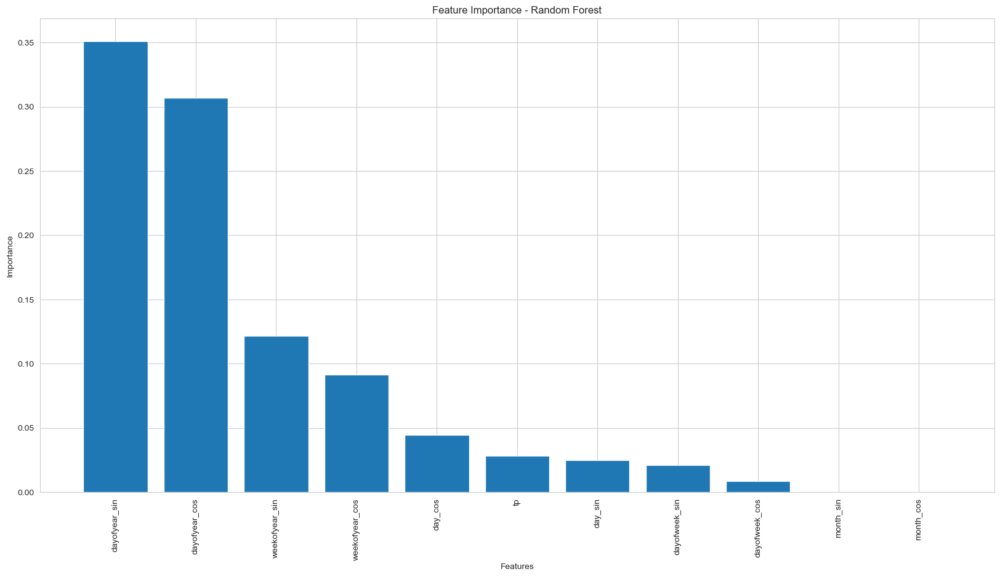

In [24]:
# Get feature importances
importances = rfr.feature_importances_
feature_names = x_train.columns

# Sort indices based on feature importance
indices = np.argsort(importances)[::-1]

# Plotting feature importances
plt.figure(figsize=(20, 10))
plt.bar(range(x_train.shape[1]), importances[indices])
plt.xticks(range(x_train.shape[1]), feature_names[indices], rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance - Random Forest')
plt.show()

SVR

In [25]:
# Initialize SVR model
svr = SVR()

tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x):
    x_train, x_test = x.iloc[train_index], x.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    svr.fit(x_train, y_train.values.reshape(-1, 1).ravel())

    # Fit the best estimator on the entire training data and predict on training data
    p_train = svr.predict(x_train).reshape(-1, 1)
    p_test = svr.predict(x_test).reshape(-1, 1)

    p_train_orig = reverse_transform(p_train, scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test, scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)
    
print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

Train RMSE: 51.473960587896734
Test RMSE: 91.95594656166547
Train MAPE: 0.15541242578236056
Test MAPE: 0.2947561632657673
[101.35451437239139, 164.15813269537088, 10.35519261723413]


K-NNR

In [26]:
# Instantiate the grid
knn = KNeighborsRegressor()

tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x):
    x_train, x_test = x.iloc[train_index], x.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    knn.fit(x_train, y_train.values.reshape(-1, 1).ravel())

    # Fit the best estimator on the entire training data and predict on training data
    p_train = knn.predict(x_train)
    p_test = knn.predict(x_test)

    p_train_orig = reverse_transform(p_train.reshape(-1, 1), scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)


print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

Train RMSE: 30.103348040102464
Test RMSE: 40.74592990303628
Train MAPE: 0.09546337498864954
Test MAPE: 0.11442049070114785
[20.718054825736875, 80.09526649044471, 21.42446839292724]


GPR

In [27]:

# Initialize GaussianProcessRegressor
gpr = GaussianProcessRegressor()

tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x):
    x_train, x_test = x.iloc[train_index], x.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    gpr.fit(x_train, y_train.values.flatten())

    # Fit the best estimator on the entire training data and predict on training data
    p_train = gpr.predict(x_train)
    p_test = gpr.predict(x_test)

    p_train_orig = reverse_transform(p_train.reshape(-1, 1), scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)


print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

Train RMSE: 1.1152694402979744e-06
Test RMSE: 51.85685936195574
Train MAPE: 2.4641897644266816e-09
Test MAPE: 0.12333730122039188
[16.99490954314894, 136.75037483338872, 1.8252937093295751]


LightGbm

In [28]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x):
    x_train, x_test = x.iloc[train_index], x.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    lgb_model = LGBMRegressor()
    lgb_model.fit(x_train, y_train)


    p_train = lgb_model.predict(x_train).reshape(-1, 1)
    p_test = lgb_model.predict(x_test).reshape(-1, 1)

    p_train_orig = reverse_transform(p_train.reshape(-1, 1), scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)


print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000194 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 123
[LightGBM] [Info] Number of data points in the train set: 52, number of used features: 11
[LightGBM] [Info] Start training from score 0.471050
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

<Axes: title={'center': 'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

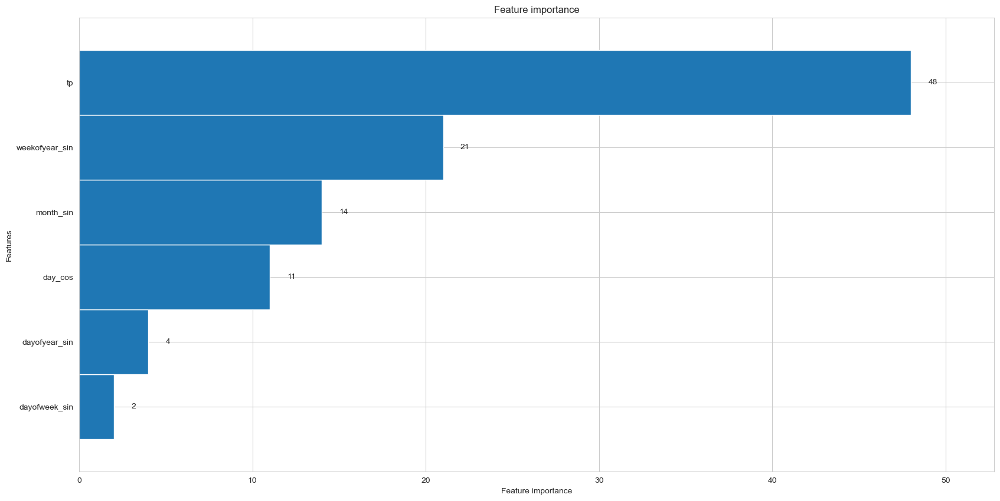

In [29]:
lgb.plot_importance(lgb_model, height = 1, figsize=(20,10))

XGBoost

In [30]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x):
    x_train, x_test = x.iloc[train_index], x.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    xgb_model = XGBRegressor()
    xgb_model.fit(x_train, y_train)

    p_train = xgb_model.predict(x_train).reshape(-1, 1)
    p_test = xgb_model.predict(x_test).reshape(-1, 1)

    p_train_orig = reverse_transform(p_train.reshape(-1, 1), scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)


Train RMSE: 1.1213359224011263
Test RMSE: 34.13051232586493
Train MAPE: 0.002197894457664366
Test MAPE: 0.09272713570730223
[22.804801365759655, 77.76136905702067, 1.825366554814447]


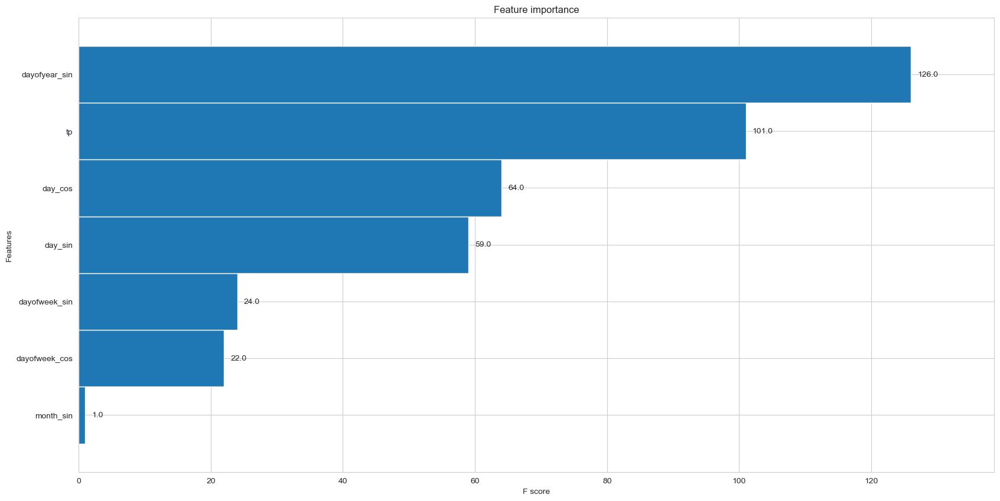

In [31]:
fig, ax = plt.subplots(figsize=(20, 10))
xgb.plot_importance(xgb_model, height=1, ax=ax)
plt.show()

Ensemble

In [32]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x):
    x_train, x_test = x.iloc[train_index], x.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # MLR
    y_pred_mlr_train = mlr_reg.predict(x_train).reshape(-1, 1)
    y_pred_mlr_test = mlr_reg.predict(x_test).reshape(-1, 1)

    # RFR
    rfr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_rfr_train = rfr.predict(x_train).reshape(-1, 1)
    y_pred_rfr_test = rfr.predict(x_test).reshape(-1, 1)

    # SVR
    svr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_svr_train = svr.predict(x_train).reshape(-1, 1)
    y_pred_svr_test = svr.predict(x_test).reshape(-1, 1)

    # K-NNR
    knn.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_knn_train = knn.predict(x_train).reshape(-1, 1)
    y_pred_knn_test = knn.predict(x_test).reshape(-1, 1)

    # GPR
    gpr.fit(x_train, y_train.values.flatten())
    y_pred_gpr_train = gpr.predict(x_train).reshape(-1, 1)
    y_pred_gpr_test = gpr.predict(x_test).reshape(-1, 1)

    # Lightgbm
    lgb_model.fit(x_train, y_train)
    y_pred_lgb_train = lgb_model.predict(x_train).reshape(-1, 1)
    y_pred_lgb_test = lgb_model.predict(x_test).reshape(-1, 1)

    # XGBoost
    xgb_model.fit(x_train, y_train)
    y_pred_xgb_train = xgb_model.predict(x_train).reshape(-1, 1)
    y_pred_xgb_test = xgb_model.predict(x_test).reshape(-1, 1)

    # ensemble
    y_pred_train_ensemble = (y_pred_mlr_train + y_pred_rfr_train + y_pred_svr_train + y_pred_knn_train + 
                             y_pred_gpr_train + y_pred_lgb_train + y_pred_xgb_train)/7
    
    y_pred_test_ensemble = (y_pred_mlr_test + y_pred_rfr_test + y_pred_svr_test + y_pred_knn_test +
                            y_pred_gpr_test + y_pred_lgb_test + y_pred_xgb_test)/7
    
    
    pred_train_orig = reverse_transform(y_pred_train_ensemble.reshape(-1, 1), scaler_kw, qt_kw)
    pred_test_orig = reverse_transform(y_pred_test_ensemble.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, pred_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, pred_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, pred_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, pred_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000140 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 123
[LightGBM] [Info] Number of data points in the train set: 52, number of used features: 11
[LightGBM] [Info] Start training from score 0.471050
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Plotting

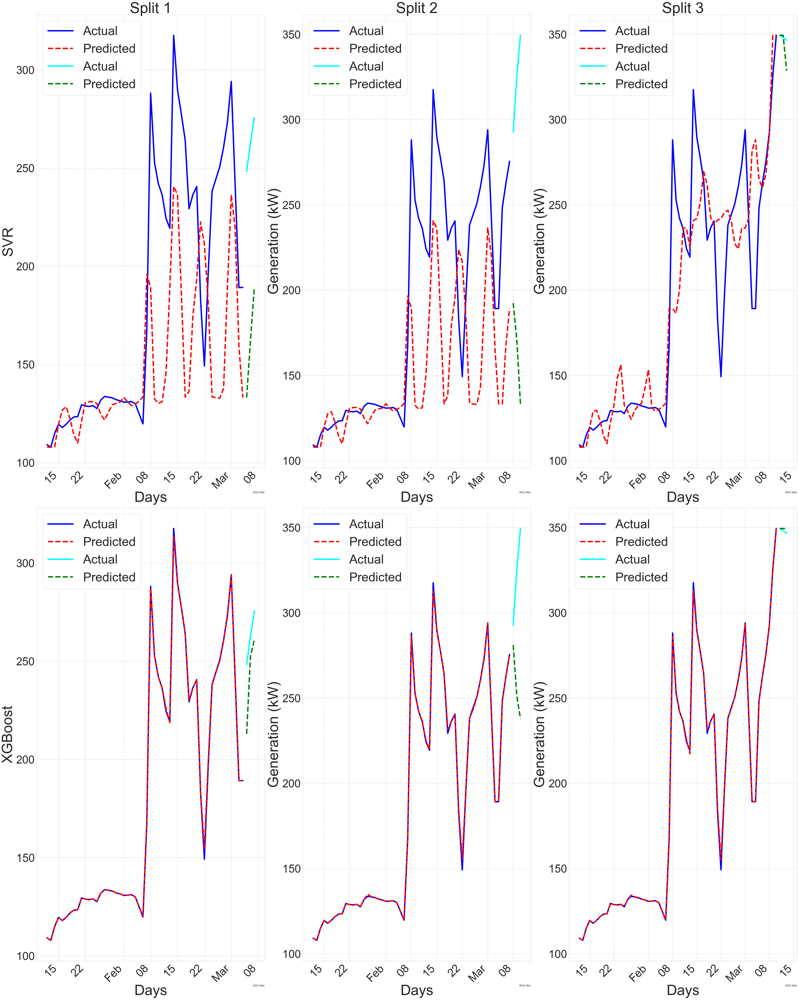

In [33]:
# Initialize the 9x5 grid of subplots
fig, axs = plt.subplots(2, 3, figsize=(40, 50))
models = ['SVR', 'XGBoost']

# Improve x-axis date formatting
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

tsp = TimeSeriesSplit(n_splits=3, test_size=3)

for fold_idx, (train_index, test_index) in enumerate(tsp.split(x)):

    x_train, x_test = x.iloc[train_index], x.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # MLR
    #y_pred_mlr_train = mlr_reg.predict(x_train).reshape(-1, 1)
    #y_pred_mlr_test = mlr_reg.predict(x_test).reshape(-1, 1)

    # RFR
    #rfr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    #y_pred_rfr_train = rfr.predict(x_train).reshape(-1, 1)
    #y_pred_rfr_test = rfr.predict(x_test).reshape(-1, 1)

    # SVR
    svr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_svr_train = svr.predict(x_train).reshape(-1, 1)
    y_pred_svr_test = svr.predict(x_test).reshape(-1, 1)

    # K-NNR
    #knn.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    #y_pred_knn_train = knn.predict(x_train).reshape(-1, 1)
    #y_pred_knn_test = knn.predict(x_test).reshape(-1, 1)

    # GPR
    #gpr.fit(x_train, y_train.values.flatten())
    #y_pred_gpr_train = gpr.predict(x_train).reshape(-1, 1)
    #y_pred_gpr_test = gpr.predict(x_test).reshape(-1, 1)

    # Lightgbm
    #lgb_model.fit(x_train, y_train)
    #y_pred_lgb_train = lgb_model.predict(x_train).reshape(-1, 1)
    #y_pred_lgb_test = lgb_model.predict(x_test).reshape(-1, 1)

    # XGBoost
    xgb_model.fit(x_train, y_train)
    y_pred_xgb_train = xgb_model.predict(x_train).reshape(-1, 1)
    y_pred_xgb_test = xgb_model.predict(x_test).reshape(-1, 1)

    # ensemble
    #y_pred_train_ensemble = (y_pred_mlr_train + y_pred_rfr_train + y_pred_svr_train + y_pred_knn_train + 
    #                         y_pred_gpr_train + y_pred_lgb_train + y_pred_xgb_train + y_pred_lstm_train)/8
            
    #y_pred_test_ensemble = (y_pred_mlr_test + y_pred_rfr_test + y_pred_svr_test + y_pred_knn_test +
    #                        y_pred_gpr_test + y_pred_lgb_test + y_pred_xgb_test + y_pred_lstm_test)/8

    # Collect all model predictions for the current fold into a list
    all_preds_train = [y_pred_svr_train, y_pred_xgb_train]

    all_preds_test = [y_pred_svr_test, y_pred_xgb_test]

    # Loop over each model's prediction and plot on the respective row
    for model_idx, (pred_train, pred_test) in enumerate(zip(all_preds_train, all_preds_test)):
        pred_train_orig = reverse_transform(pred_train.reshape(-1, 1), scaler_kw, qt_kw)
        pred_test_orig = reverse_transform(pred_test.reshape(-1, 1), scaler_kw, qt_kw)

        y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
        y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

        # Plotting
        ax = axs[model_idx, fold_idx]
        ax.plot(x_train.index, y_train_orig, linewidth='5',color='blue', label='Actual')
        ax.plot(x_train.index, pred_train_orig, color='red',linewidth='5', linestyle='--', label='Predicted')
        ax.plot(x_test.index, y_test_orig, linewidth='5', color='cyan', label='Actual')
        ax.plot(x_test.index, pred_test_orig, color='green',linewidth='5', linestyle='--', label='Predicted')

        # Setting the date formatter and locator
        ax.xaxis.set_major_locator(locator)
        ax.xaxis.set_major_formatter(formatter)

        # Add xlabel and ylabel
        ax.set_xlabel('Days', fontsize=52)
        ax.set_ylabel('Generation (kW)', fontsize=52)
        

        # Only set the title for the top row and legend for the last row
        if fold_idx == 0:
            ax.set_ylabel(models[model_idx])
        if model_idx == 0:
            ax.set_title(f'Split {fold_idx + 1}')

        ax.legend()

# Adjustments for aesthetics
for ax in axs.ravel():
    # Adjust font sizes
    ax.tick_params(axis='both', which='major', labelsize=40)  # Adjust as needed
    ax.set_xlabel(ax.get_xlabel(), fontsize=52)
    ax.set_ylabel(ax.get_ylabel(), fontsize=52)
    ax.set_title(ax.get_title(), fontsize=54)
    
    # Rotate x-axis labels for clarity
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right")

    # Adjust legend fontsize
    ax.legend(fontsize=45)
    
    # Display grid
    ax.grid(True, which='both', linestyle='--', linewidth=1, alpha=1)

# Layout adjustments
plt.tight_layout()
plt.show()

# Lag Feature only

MLR with lag 

In [34]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_score = []
test_mape_score = []

for train_index, test_index in tsp.split(x_lag_o):
    x_train, x_test = x_lag_o.iloc[train_index], x_lag_o.iloc[test_index]
    y_train, y_test = y_lag_o.iloc[train_index], y_lag_o.iloc[test_index]

    mlr_reg = LinearRegression().fit(x_train, y_train)

    y_pred_train_transformed = mlr_reg.predict(x_train)
    y_pred_test_transformed = mlr_reg.predict(x_test)

    # Inverse transforming the predicted values
    y_pred_train = reverse_transform(y_pred_train_transformed.reshape(-1, 1), scaler_kw, qt_kw)
    y_pred_test = reverse_transform(y_pred_test_transformed.reshape(-1, 1), scaler_kw, qt_kw)

    # Inverse transforming the true y values
    y_train_original = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_original = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    # Calculating RMSE and MAPE
    RMSE_train = mean_squared_error(y_train_original, y_pred_train, squared=False)
    RMSE_test = mean_squared_error(y_test_original, y_pred_test, squared=False)
    MAPE_train = mean_absolute_percentage_error(y_train_original, y_pred_train)
    MAPE_test = mean_absolute_percentage_error(y_test_original, y_pred_test)

    train_rmse_scores.append(RMSE_train)
    test_rmse_scores.append(RMSE_test)

    train_mape_score.append(MAPE_train)
    test_mape_score.append(MAPE_test)


print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_score), np.mean(test_mape_score)))
print(test_rmse_scores)

Train RMSE: 34.069120762232444
Test RMSE: 56.47515870672917
Train MAPE: 0.1055502846519059
Test MAPE: 0.16644165246523468
[29.600593596402817, 90.26495049446474, 49.55993202931995]


RFR with lag 

In [35]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_lag_o):
    x_train, x_test = x_lag_o.iloc[train_index], x_lag_o.iloc[test_index]
    y_train, y_test = y_lag_o.iloc[train_index], y_lag_o.iloc[test_index]

    rfr = RandomForestRegressor(random_state=42)
    rfr.fit(x_train, y_train.values.reshape(-1, 1).ravel())

    p_train = rfr.predict(x_train).reshape(-1, 1)
    p_test = rfr.predict(x_test).reshape(-1, 1)

    p_train_orig = reverse_transform(p_train, scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test, scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

Train RMSE: 12.504347402942008
Test RMSE: 35.791762633232715
Train MAPE: 0.03319750482500689
Test MAPE: 0.10314399129198822
[29.16303873424677, 76.38734967881912, 1.8248994866322668]


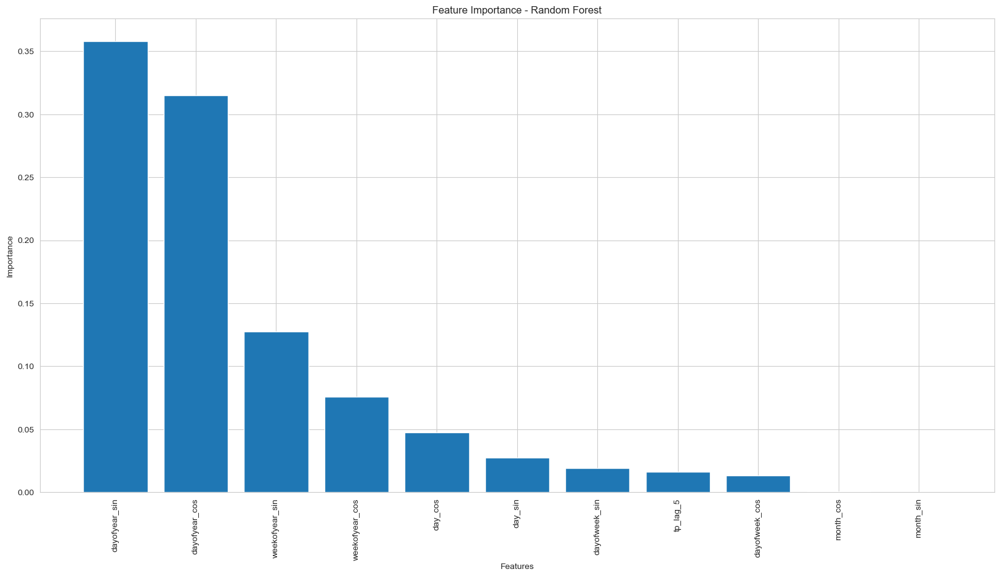

In [36]:
# Get feature importances
importances = rfr.feature_importances_
feature_names = x_train.columns

# Sort indices based on feature importance
indices = np.argsort(importances)[::-1]

# Plotting feature importances
plt.figure(figsize=(20, 10))
plt.bar(range(x_train.shape[1]), importances[indices])
plt.xticks(range(x_train.shape[1]), feature_names[indices], rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance - Random Forest')
plt.show()

SVR with lag 

In [37]:
# Initialize SVR model
svr = SVR()

tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_lag_o):
    x_train, x_test = x_lag_o.iloc[train_index], x_lag_o.iloc[test_index]
    y_train, y_test = y_lag_o.iloc[train_index], y_lag_o.iloc[test_index]

    svr.fit(x_train, y_train.values.reshape(-1, 1).ravel())

    # Fit the best estimator on the entire training data and predict on training data
    p_train = svr.predict(x_train).reshape(-1, 1)
    p_test = svr.predict(x_test).reshape(-1, 1)

    p_train_orig = reverse_transform(p_train, scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test, scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)


print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

Train RMSE: 51.51080862729116
Test RMSE: 93.24991144561767
Train MAPE: 0.15456486484601537
Test MAPE: 0.2968721332835467
[101.62732097922422, 164.11388564703475, 14.008527710594015]


K-NNR with lag 

In [38]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_lag_o):
    x_train, x_test = x_lag_o.iloc[train_index], x_lag_o.iloc[test_index]
    y_train, y_test = y_lag_o.iloc[train_index], y_lag_o.iloc[test_index]

    # define a knn regressor
    knn = KNeighborsRegressor()
    knn.fit(x_train, y_train.values.reshape(-1, 1).ravel())

    # Fit the best estimator on the entire training data and predict on training data
    p_train = knn.predict(x_train)
    p_test = knn.predict(x_test)

    p_train_orig = reverse_transform(p_train.reshape(-1, 1), scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

Train RMSE: 30.758324677878516
Test RMSE: 40.20577857062023
Train MAPE: 0.09725813876677807
Test MAPE: 0.1118923128982252
[19.09760082848875, 80.09526649044471, 21.42446839292724]


GPR with lag 

In [39]:
# Initialize GaussianProcessRegressor
gpr = GaussianProcessRegressor()

tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_lag_o):
    x_train, x_test = x_lag_o.iloc[train_index], x_lag_o.iloc[test_index]
    y_train, y_test = y_lag_o.iloc[train_index], y_lag_o.iloc[test_index]

    gpr.fit(x_train, y_train.values.flatten())

    # Fit the best estimator on the entire training data and predict on training data
    p_train = gpr.predict(x_train)
    p_test = gpr.predict(x_test)

    p_train_orig = reverse_transform(p_train.reshape(-1, 1), scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

Train RMSE: 1.0671758112375355e-06
Test RMSE: 62.052856065847756
Train MAPE: 2.000454152961168e-09
Test MAPE: 0.16936015220234793
[32.64943972919961, 151.68383361829288, 1.8252948500508024]


LightGBM with lag 

In [40]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_lag_o):
    x_train, x_test = x_lag_o.iloc[train_index], x_lag_o.iloc[test_index]
    y_train, y_test = y_lag_o.iloc[train_index], y_lag_o.iloc[test_index]

    lgb_model = LGBMRegressor()
    # fit the model on training data and make predictions for testing set
    lgb_model.fit(x_train, y_train, eval_set=[(x_train, y_train), (x_test, y_test)])

    p_train = lgb_model.predict(x_train).reshape(-1, 1)
    p_test = lgb_model.predict(x_test).reshape(-1, 1)

    p_train_orig = reverse_transform(p_train.reshape(-1, 1), scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000138 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 123
[LightGBM] [Info] Number of data points in the train set: 52, number of used features: 11
[LightGBM] [Info] Start training from score 0.471050
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

<Axes: title={'center': 'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

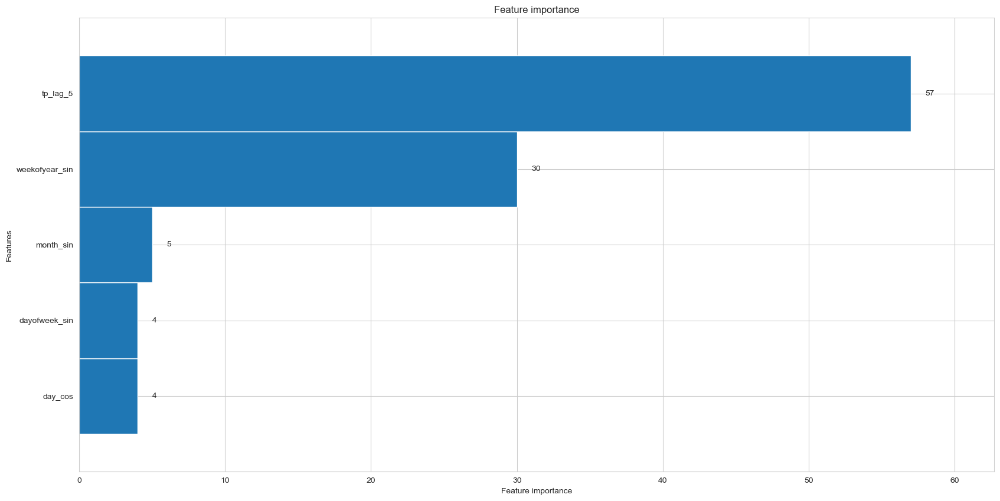

In [41]:
lgb.plot_importance(lgb_model, height = 1, figsize=(20,10))

XGBoost with lag 

In [42]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_lag_o):
    x_train, x_test = x_lag_o.iloc[train_index], x_lag_o.iloc[test_index]
    y_train, y_test = y_lag_o.iloc[train_index], y_lag_o.iloc[test_index]

    xgb_model = xgb.XGBRegressor()  # Pass the best_params as **kwargs
    xgb_model.fit(
        x_train, y_train,
        eval_set=[(x_train, y_train), (x_test, y_test)],
        early_stopping_rounds=30,
        verbose=False
    )

    p_train = xgb_model.predict(x_train).reshape(-1, 1)
    p_test = xgb_model.predict(x_test).reshape(-1, 1)

    p_train_orig = reverse_transform(p_train.reshape(-1, 1), scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)
    
print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

Train RMSE: 7.5238486923196914
Test RMSE: 40.68414196369013
Train MAPE: 0.022539551426492114
Test MAPE: 0.12093827790883886
[41.138323421991075, 79.65779268550081, 1.2563097835785215]


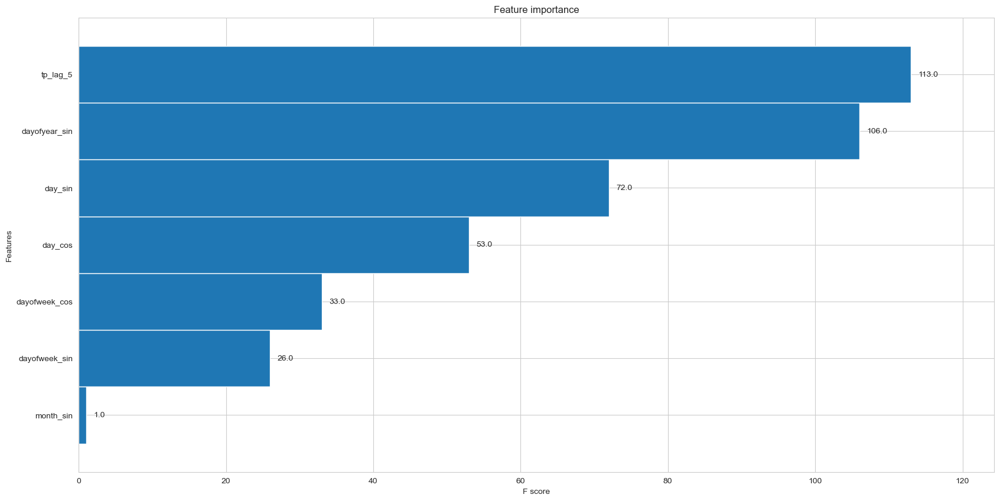

In [43]:
fig, ax = plt.subplots(figsize=(20, 10))
xgb.plot_importance(xgb_model, height=1, ax=ax)
plt.show()

Ensemble with lag

In [44]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []


for train_index, test_index in tsp.split(x_lag_o):
    x_train, x_test = x_lag_o.iloc[train_index], x_lag_o.iloc[test_index]
    y_train, y_test = y_lag_o.iloc[train_index], y_lag_o.iloc[test_index]

    # MLR
    y_pred_mlr_train = mlr_reg.predict(x_train).reshape(-1, 1)
    y_pred_mlr_test = mlr_reg.predict(x_test).reshape(-1, 1)

    # RFR
    rfr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_rfr_train = rfr.predict(x_train).reshape(-1, 1)
    y_pred_rfr_test = rfr.predict(x_test).reshape(-1, 1)

    # SVR
    svr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_svr_train = svr.predict(x_train).reshape(-1, 1)
    y_pred_svr_test = svr.predict(x_test).reshape(-1, 1)

    # K-NNR
    knn.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_knn_train = knn.predict(x_train).reshape(-1, 1)
    y_pred_knn_test = knn.predict(x_test).reshape(-1, 1)

    # GPR
    gpr.fit(x_train, y_train.values.flatten())
    y_pred_gpr_train = gpr.predict(x_train).reshape(-1, 1)
    y_pred_gpr_test = gpr.predict(x_test).reshape(-1, 1)

    # Lightgbm
    lgb_model.fit(x_train, y_train)
    y_pred_lgb_train = lgb_model.predict(x_train).reshape(-1, 1)
    y_pred_lgb_test = lgb_model.predict(x_test).reshape(-1, 1)

    # XGBoost
    xgb_model.fit(x_train, y_train)
    y_pred_xgb_train = xgb_model.predict(x_train).reshape(-1, 1)
    y_pred_xgb_test = xgb_model.predict(x_test).reshape(-1, 1)

    # ensemble
    y_pred_train_ensemble = (y_pred_mlr_train + y_pred_rfr_train + y_pred_svr_train + y_pred_knn_train + 
                             y_pred_gpr_train + y_pred_lgb_train + y_pred_xgb_train)/7
    
    y_pred_test_ensemble = (y_pred_mlr_test + y_pred_rfr_test + y_pred_svr_test + y_pred_knn_test +
                            y_pred_gpr_test + y_pred_lgb_test + y_pred_xgb_test)/7
    
    
    pred_train_orig = reverse_transform(y_pred_train_ensemble.reshape(-1, 1), scaler_kw, qt_kw)
    pred_test_orig = reverse_transform(y_pred_test_ensemble.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, pred_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, pred_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, pred_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, pred_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000135 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 123
[LightGBM] [Info] Number of data points in the train set: 52, number of used features: 11
[LightGBM] [Info] Start training from score 0.471050
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Plotting

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 123
[LightGBM] [Info] Number of data points in the train set: 52, number of used features: 11
[LightGBM] [Info] Start training from score 0.471050
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

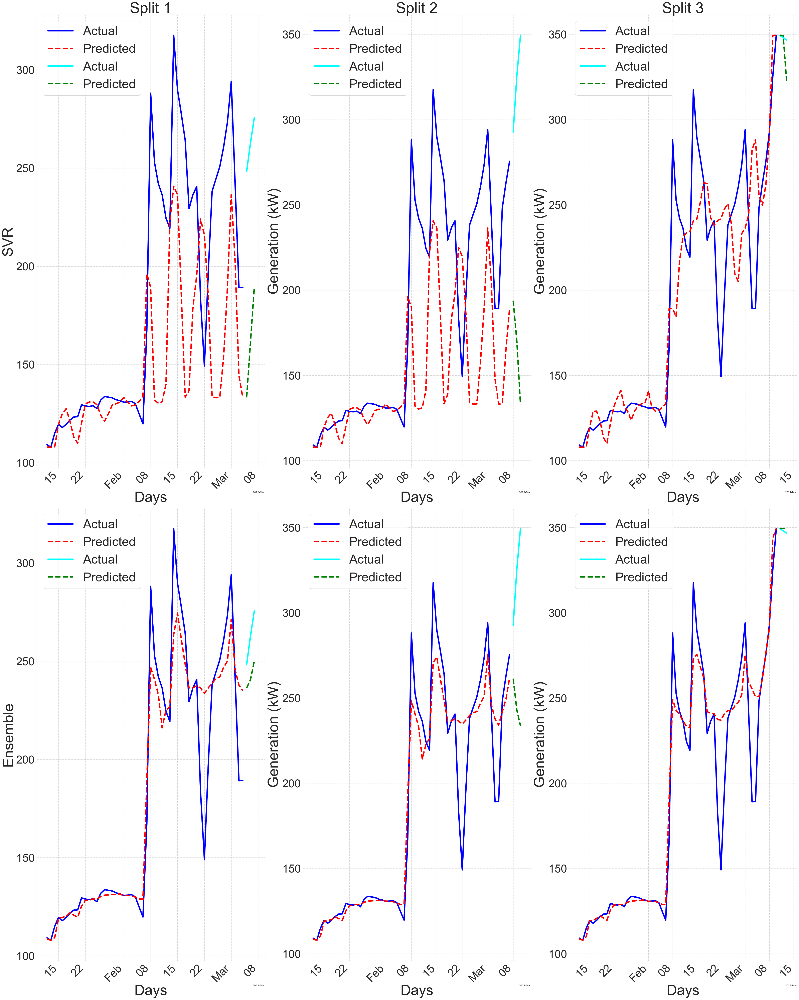

In [45]:
# Initialize the 9x5 grid of subplots
fig, axs = plt.subplots(2, 3, figsize=(40, 50))
models = ['SVR', 'Ensemble']

# Improve x-axis date formatting
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

tsp = TimeSeriesSplit(n_splits=3, test_size=3)

for fold_idx, (train_index, test_index) in enumerate(tsp.split(x_lag_o)):

    x_train, x_test = x_lag_o.iloc[train_index], x_lag_o.iloc[test_index]
    y_train, y_test = y_lag_o.iloc[train_index], y_lag_o.iloc[test_index]

    # MLR
    y_pred_mlr_train = mlr_reg.predict(x_train).reshape(-1, 1)
    y_pred_mlr_test = mlr_reg.predict(x_test).reshape(-1, 1)

    # RFR
    rfr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_rfr_train = rfr.predict(x_train).reshape(-1, 1)
    y_pred_rfr_test = rfr.predict(x_test).reshape(-1, 1)

    # SVR
    svr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_svr_train = svr.predict(x_train).reshape(-1, 1)
    y_pred_svr_test = svr.predict(x_test).reshape(-1, 1)

    # K-NNR
    knn.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_knn_train = knn.predict(x_train).reshape(-1, 1)
    y_pred_knn_test = knn.predict(x_test).reshape(-1, 1)

    # GPR
    gpr.fit(x_train, y_train.values.flatten())
    y_pred_gpr_train = gpr.predict(x_train).reshape(-1, 1)
    y_pred_gpr_test = gpr.predict(x_test).reshape(-1, 1)

    # Lightgbm
    lgb_model.fit(x_train, y_train)
    y_pred_lgb_train = lgb_model.predict(x_train).reshape(-1, 1)
    y_pred_lgb_test = lgb_model.predict(x_test).reshape(-1, 1)

    # XGBoost
    xgb_model.fit(x_train, y_train)
    y_pred_xgb_train = xgb_model.predict(x_train).reshape(-1, 1)
    y_pred_xgb_test = xgb_model.predict(x_test).reshape(-1, 1)

    # ensemble
    y_pred_train_ensemble = (y_pred_mlr_train + y_pred_rfr_train + y_pred_svr_train + y_pred_knn_train + 
                             y_pred_gpr_train + y_pred_lgb_train + y_pred_xgb_train)/7
            
    y_pred_test_ensemble = (y_pred_mlr_test + y_pred_rfr_test + y_pred_svr_test + y_pred_knn_test +
                            y_pred_gpr_test + y_pred_lgb_test + y_pred_xgb_test)/7

    # Collect all model predictions for the current fold into a list
    all_preds_train = [y_pred_svr_train, y_pred_train_ensemble]

    all_preds_test = [y_pred_svr_test, y_pred_test_ensemble]

    # Loop over each model's prediction and plot on the respective row
    for model_idx, (pred_train, pred_test) in enumerate(zip(all_preds_train, all_preds_test)):
        pred_train_orig = reverse_transform(pred_train.reshape(-1, 1), scaler_kw, qt_kw)
        pred_test_orig = reverse_transform(pred_test.reshape(-1, 1), scaler_kw, qt_kw)

        y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
        y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

        # Plotting
        ax = axs[model_idx, fold_idx]
        ax.plot(x_train.index, y_train_orig, linewidth='5',color='blue', label='Actual')
        ax.plot(x_train.index, pred_train_orig, color='red',linewidth='5', linestyle='--', label='Predicted')
        ax.plot(x_test.index, y_test_orig, linewidth='5', color='cyan', label='Actual')
        ax.plot(x_test.index, pred_test_orig, color='green',linewidth='5', linestyle='--', label='Predicted')

        # Setting the date formatter and locator
        ax.xaxis.set_major_locator(locator)
        ax.xaxis.set_major_formatter(formatter)

        # Add xlabel and ylabel
        ax.set_xlabel('Days', fontsize=52)
        ax.set_ylabel('Generation (kW)', fontsize=52)

        # Only set the title for the top row and legend for the last row
        if fold_idx == 0:
            ax.set_ylabel(models[model_idx])
        if model_idx == 0:
            ax.set_title(f'Split {fold_idx + 1}')

        ax.legend()

# Adjustments for aesthetics
for ax in axs.ravel():
    # Adjust font sizes
    ax.tick_params(axis='both', which='major', labelsize=40)  # Adjust as needed
    ax.set_xlabel(ax.get_xlabel(), fontsize=52)
    ax.set_ylabel(ax.get_ylabel(), fontsize=52)
    ax.set_title(ax.get_title(), fontsize=54)
    
    # Rotate x-axis labels for clarity
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right")

    # Adjust legend fontsize
    ax.legend(fontsize=45)

    # Display grid
    ax.grid(True, which='both', linestyle='--', linewidth=1, alpha=1)

# Layout adjustments
plt.tight_layout()
plt.show()

# Rolling sum feature only

MLR with rolling sum

In [46]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_score = []
test_mape_score = []

for train_index, test_index in tsp.split(x_rs_o):
    x_train, x_test = x_rs_o.iloc[train_index], x_rs_o.iloc[test_index]
    y_train, y_test = y_rs_o.iloc[train_index], y_rs_o.iloc[test_index]

    mlr_reg = LinearRegression().fit(x_train, y_train)

    y_pred_train_transformed = mlr_reg.predict(x_train)
    y_pred_test_transformed = mlr_reg.predict(x_test)

    # Inverse transforming the predicted values
    y_pred_train = reverse_transform(y_pred_train_transformed.reshape(-1, 1), scaler_kw, qt_kw)
    y_pred_test = reverse_transform(y_pred_test_transformed.reshape(-1, 1), scaler_kw, qt_kw)

    # Inverse transforming the true y values
    y_train_original = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_original = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    # Calculating RMSE and MAPE
    RMSE_train = mean_squared_error(y_train_original, y_pred_train, squared=False)
    RMSE_test = mean_squared_error(y_test_original, y_pred_test, squared=False)
    MAPE_train = mean_absolute_percentage_error(y_train_original, y_pred_train)
    MAPE_test = mean_absolute_percentage_error(y_test_original, y_pred_test)

    train_rmse_scores.append(RMSE_train)
    test_rmse_scores.append(RMSE_test)

    train_mape_score.append(MAPE_train)
    test_mape_score.append(MAPE_test)


print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_score), np.mean(test_mape_score)))
print(test_rmse_scores)

Train RMSE: 28.3296127713821
Test RMSE: 18.16788032168288
Train MAPE: 0.0848250980326099
Test MAPE: 0.058666210332331374
[18.98464739034849, 34.10314237750975, 1.415851197190397]


RFR with rolling sum

In [47]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_rs_o):
    x_train, x_test = x_rs_o.iloc[train_index], x_rs_o.iloc[test_index]
    y_train, y_test = y_rs_o.iloc[train_index], y_rs_o.iloc[test_index]

    rfr = RandomForestRegressor(random_state=42)
    rfr.fit(x_train, y_train.values.reshape(-1, 1).ravel())

    p_train = rfr.predict(x_train).reshape(-1, 1)
    p_test = rfr.predict(x_test).reshape(-1, 1)

    p_train_orig = reverse_transform(p_train, scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test, scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

Train RMSE: 12.001624533602048
Test RMSE: 39.12268989214309
Train MAPE: 0.03239707735520277
Test MAPE: 0.1167545639700302
[36.37130849599849, 79.17184551303536, 1.8249156673954137]


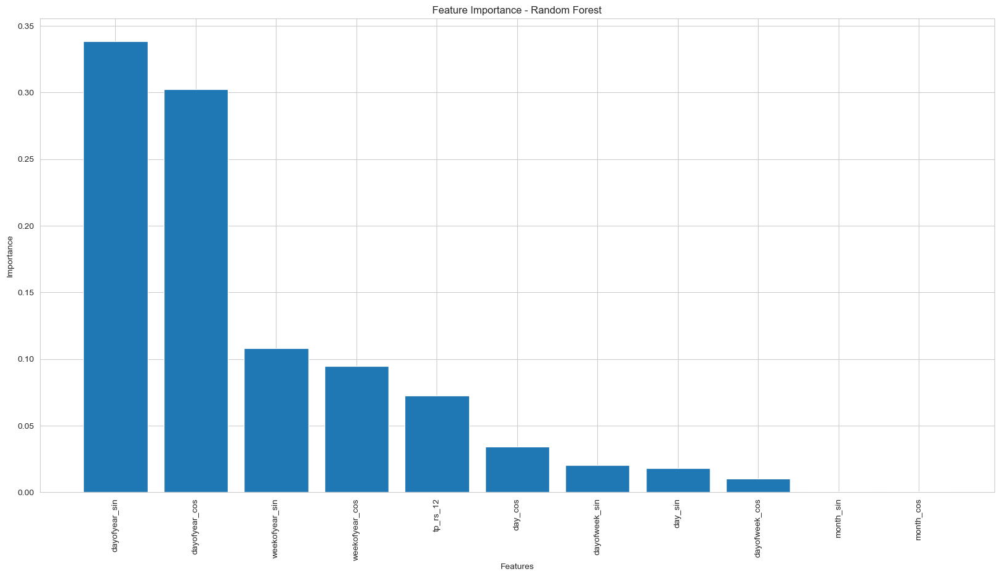

In [48]:
# Get feature importances
importances = rfr.feature_importances_
feature_names = x_train.columns

# Sort indices based on feature importance
indices = np.argsort(importances)[::-1]

# Plotting feature importances
plt.figure(figsize=(20, 10))
plt.bar(range(x_train.shape[1]), importances[indices])
plt.xticks(range(x_train.shape[1]), feature_names[indices], rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance - Random Forest')
plt.show()

SVR with rolling sum 

In [49]:
# Initialize SVR model
svr = SVR()

tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_rs_o):
    x_train, x_test = x_rs_o.iloc[train_index], x_rs_o.iloc[test_index]
    y_train, y_test = y_rs_o.iloc[train_index], y_rs_o.iloc[test_index]

    svr.fit(x_train, y_train.values.reshape(-1, 1).ravel())

    # Fit the best estimator on the entire training data and predict on training data
    p_train = svr.predict(x_train).reshape(-1, 1)
    p_test = svr.predict(x_test).reshape(-1, 1)

    p_train_orig = reverse_transform(p_train, scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test, scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)


print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

Train RMSE: 44.919317084851365
Test RMSE: 35.534508217234766
Train MAPE: 0.13668525859756378
Test MAPE: 0.09579120597760186
[4.188358997058962, 76.21315645190342, 26.202009202741934]


K-NNR with rolling sum

In [50]:
# Instantiate the grid
knn = KNeighborsRegressor()

tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_rs_o):
    x_train, x_test = x_rs_o.iloc[train_index], x_rs_o.iloc[test_index]
    y_train, y_test = y_rs_o.iloc[train_index], y_rs_o.iloc[test_index]

    # define a knn regressor
    knn = KNeighborsRegressor()
    knn.fit(x_train, y_train.values.reshape(-1, 1).ravel())

    # Fit the best estimator on the entire training data and predict on training data
    p_train = knn.predict(x_train)
    p_test = knn.predict(x_test)

    p_train_orig = reverse_transform(p_train.reshape(-1, 1), scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

Train RMSE: 28.153892758602854
Test RMSE: 40.745929903036284
Train MAPE: 0.07675196179484822
Test MAPE: 0.11442049070114786
[20.718054825736875, 80.09526649044471, 21.424468392927263]


GPR with rolling sum

In [51]:
# Initialize GaussianProcessRegressor
gpr = GaussianProcessRegressor()

tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_rs_o):
    x_train, x_test = x_rs_o.iloc[train_index], x_rs_o.iloc[test_index]
    y_train, y_test = y_rs_o.iloc[train_index], y_rs_o.iloc[test_index]

    gpr.fit(x_train, y_train.values.flatten())

    # Fit the best estimator on the entire training data and predict on training data
    p_train = gpr.predict(x_train)
    p_test = gpr.predict(x_test)

    p_train_orig = reverse_transform(p_train.reshape(-1, 1), scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

Train RMSE: 1.0932741196058304e-06
Test RMSE: 48.936696542559986
Train MAPE: 2.1605414853726903e-09
Test MAPE: 0.13480571149094536
[14.495784852809733, 130.4891268981838, 1.8251778766864455]


LightGBM with rolling sum 

In [52]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_rs_o):
    x_train, x_test = x_rs_o.iloc[train_index], x_rs_o.iloc[test_index]
    y_train, y_test = y_rs_o.iloc[train_index], y_rs_o.iloc[test_index]

    lgb_model = LGBMRegressor()
    # fit the model on training data and make predictions for testing set
    lgb_model.fit(x_train, y_train, eval_set=[(x_train, y_train), (x_test, y_test)])

    p_train = lgb_model.predict(x_train).reshape(-1, 1)
    p_test = lgb_model.predict(x_test).reshape(-1, 1)

    p_train_orig = reverse_transform(p_train.reshape(-1, 1), scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000150 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 123
[LightGBM] [Info] Number of data points in the train set: 52, number of used features: 11
[LightGBM] [Info] Start training from score 0.471050
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

<Axes: title={'center': 'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

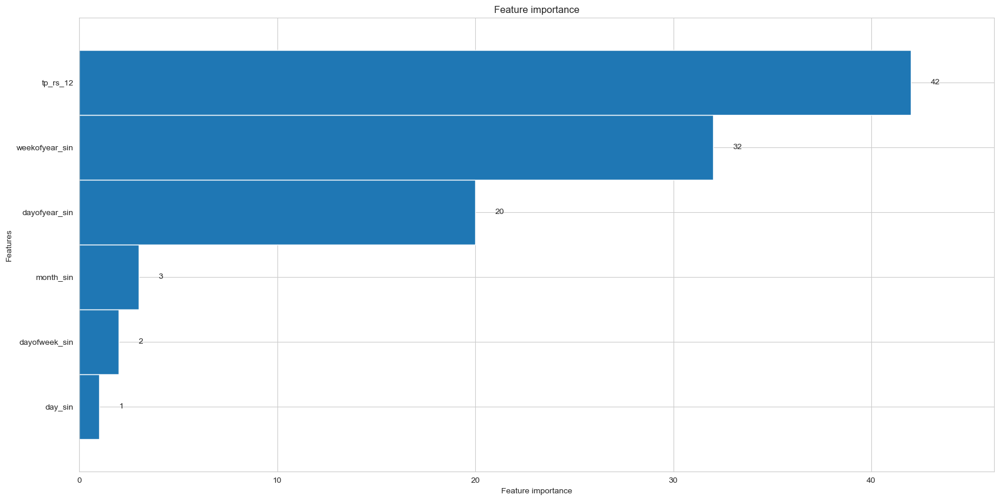

In [53]:
lgb.plot_importance(lgb_model, height = 1, figsize=(20,10))

XGBoost with rolling sum 

In [54]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_rs_o):
    x_train, x_test = x_rs_o.iloc[train_index], x_rs_o.iloc[test_index]
    y_train, y_test = y_rs_o.iloc[train_index], y_rs_o.iloc[test_index]

    xgb_model = xgb.XGBRegressor()  # Pass the best_params as **kwargs
    xgb_model.fit(
        x_train, y_train,
        eval_set=[(x_train, y_train), (x_test, y_test)],
        early_stopping_rounds=30,
        verbose=False
    )

    p_train = xgb_model.predict(x_train).reshape(-1, 1)
    p_test = xgb_model.predict(x_test).reshape(-1, 1)

    p_train_orig = reverse_transform(p_train.reshape(-1, 1), scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

Train RMSE: 7.3894853658284765
Test RMSE: 39.30145788044372
Train MAPE: 0.024414640864886206
Test MAPE: 0.1222627503430768
[23.934427067881987, 92.71363678987066, 1.2563097835785215]


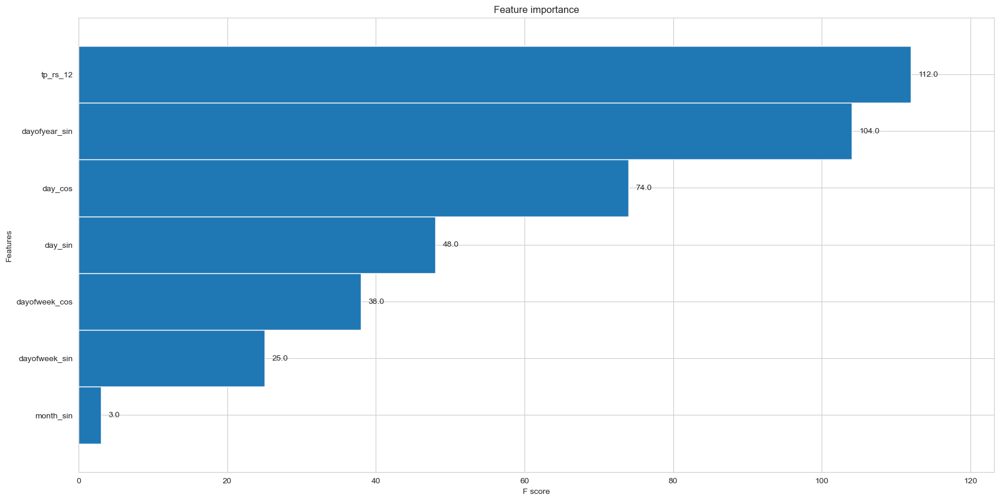

In [55]:
fig, ax = plt.subplots(figsize=(20, 10))
xgb.plot_importance(xgb_model, height=1, ax=ax)
plt.show()

Ensemble with rolling sum

In [56]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []


for train_index, test_index in tsp.split(x_rs_o):
    x_train, x_test = x_rs_o.iloc[train_index], x_rs_o.iloc[test_index]
    y_train, y_test = y_rs_o.iloc[train_index], y_rs_o.iloc[test_index]

    # MLR
    y_pred_mlr_train = mlr_reg.predict(x_train).reshape(-1, 1)
    y_pred_mlr_test = mlr_reg.predict(x_test).reshape(-1, 1)

    # RFR
    rfr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_rfr_train = rfr.predict(x_train).reshape(-1, 1)
    y_pred_rfr_test = rfr.predict(x_test).reshape(-1, 1)

    # SVR
    svr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_svr_train = svr.predict(x_train).reshape(-1, 1)
    y_pred_svr_test = svr.predict(x_test).reshape(-1, 1)

    # K-NNR
    knn.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_knn_train = knn.predict(x_train).reshape(-1, 1)
    y_pred_knn_test = knn.predict(x_test).reshape(-1, 1)

    # GPR
    gpr.fit(x_train, y_train.values.flatten())
    y_pred_gpr_train = gpr.predict(x_train).reshape(-1, 1)
    y_pred_gpr_test = gpr.predict(x_test).reshape(-1, 1)

    # Lightgbm
    lgb_model.fit(x_train, y_train)
    y_pred_lgb_train = lgb_model.predict(x_train).reshape(-1, 1)
    y_pred_lgb_test = lgb_model.predict(x_test).reshape(-1, 1)

    # XGBoost
    xgb_model.fit(x_train, y_train)
    y_pred_xgb_train = xgb_model.predict(x_train).reshape(-1, 1)
    y_pred_xgb_test = xgb_model.predict(x_test).reshape(-1, 1)

    # ensemble
    y_pred_train_ensemble = (y_pred_mlr_train + y_pred_rfr_train + y_pred_svr_train + y_pred_knn_train + 
                             y_pred_gpr_train + y_pred_lgb_train + y_pred_xgb_train)/7
    
    y_pred_test_ensemble = (y_pred_mlr_test + y_pred_rfr_test + y_pred_svr_test + y_pred_knn_test +
                            y_pred_gpr_test + y_pred_lgb_test + y_pred_xgb_test)/7
    
    
    pred_train_orig = reverse_transform(y_pred_train_ensemble.reshape(-1, 1), scaler_kw, qt_kw)
    pred_test_orig = reverse_transform(y_pred_test_ensemble.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, pred_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, pred_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, pred_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, pred_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000145 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 123
[LightGBM] [Info] Number of data points in the train set: 52, number of used features: 11
[LightGBM] [Info] Start training from score 0.471050
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Plotting

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000140 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 123
[LightGBM] [Info] Number of data points in the train set: 52, number of used features: 11
[LightGBM] [Info] Start training from score 0.471050
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

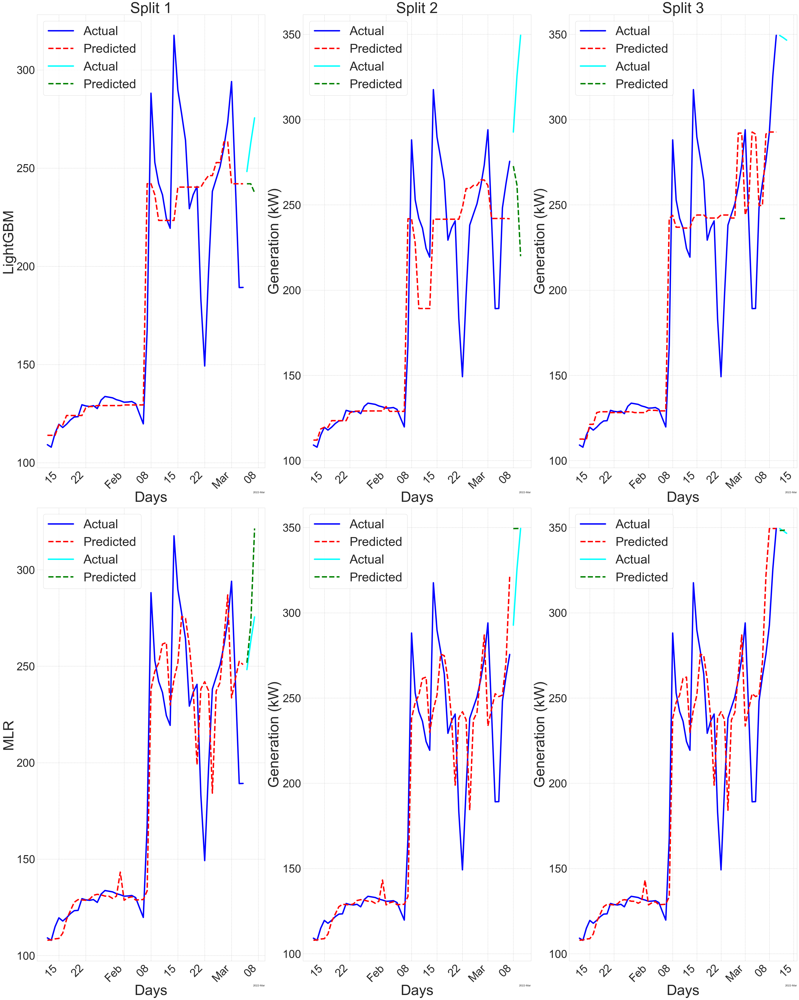

In [57]:
# Initialize the 9x5 grid of subplots
fig, axs = plt.subplots(2, 3, figsize=(40, 50))
models = ['LightGBM', 'MLR']

# Improve x-axis date formatting
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

tsp = TimeSeriesSplit(n_splits=3, test_size=3)

for fold_idx, (train_index, test_index) in enumerate(tsp.split(x_rs_o)):


    x_train, x_test = x_rs_o.iloc[train_index], x_rs_o.iloc[test_index]
    y_train, y_test = y_rs_o.iloc[train_index], y_rs_o.iloc[test_index]

    # MLR
    y_pred_mlr_train = mlr_reg.predict(x_train).reshape(-1, 1)
    y_pred_mlr_test = mlr_reg.predict(x_test).reshape(-1, 1)

    # RFR
    rfr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_rfr_train = rfr.predict(x_train).reshape(-1, 1)
    y_pred_rfr_test = rfr.predict(x_test).reshape(-1, 1)

    # SVR
    svr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_svr_train = svr.predict(x_train).reshape(-1, 1)
    y_pred_svr_test = svr.predict(x_test).reshape(-1, 1)

    # K-NNR
    knn.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_knn_train = knn.predict(x_train).reshape(-1, 1)
    y_pred_knn_test = knn.predict(x_test).reshape(-1, 1)

    # GPR
    gpr.fit(x_train, y_train.values.flatten())
    y_pred_gpr_train = gpr.predict(x_train).reshape(-1, 1)
    y_pred_gpr_test = gpr.predict(x_test).reshape(-1, 1)

    # Lightgbm
    lgb_model.fit(x_train, y_train)
    y_pred_lgb_train = lgb_model.predict(x_train).reshape(-1, 1)
    y_pred_lgb_test = lgb_model.predict(x_test).reshape(-1, 1)

    # XGBoost
    xgb_model.fit(x_train, y_train)
    y_pred_xgb_train = xgb_model.predict(x_train).reshape(-1, 1)
    y_pred_xgb_test = xgb_model.predict(x_test).reshape(-1, 1)

    # ensemble
    y_pred_train_ensemble = (y_pred_mlr_train + y_pred_rfr_train + y_pred_svr_train + y_pred_knn_train + 
                             y_pred_gpr_train + y_pred_lgb_train + y_pred_xgb_train)/7
            
    y_pred_test_ensemble = (y_pred_mlr_test + y_pred_rfr_test + y_pred_svr_test + y_pred_knn_test +
                            y_pred_gpr_test + y_pred_lgb_test + y_pred_xgb_test)/7

    # Collect all model predictions for the current fold into a list
    all_preds_train = [y_pred_lgb_train, y_pred_mlr_train]

    all_preds_test = [y_pred_lgb_test, y_pred_mlr_test]

    # Loop over each model's prediction and plot on the respective row
    for model_idx, (pred_train, pred_test) in enumerate(zip(all_preds_train, all_preds_test)):
        pred_train_orig = reverse_transform(pred_train.reshape(-1, 1), scaler_kw, qt_kw)
        pred_test_orig = reverse_transform(pred_test.reshape(-1, 1), scaler_kw, qt_kw)

        y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
        y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

        # Plotting
        ax = axs[model_idx, fold_idx]
        ax.plot(x_train.index, y_train_orig, linewidth='5',color='blue', label='Actual')
        ax.plot(x_train.index, pred_train_orig, color='red',linewidth='5', linestyle='--', label='Predicted')
        ax.plot(x_test.index, y_test_orig, linewidth='5', color='cyan', label='Actual')
        ax.plot(x_test.index, pred_test_orig, color='green',linewidth='5', linestyle='--', label='Predicted')

        # Setting the date formatter and locator
        ax.xaxis.set_major_locator(locator)
        ax.xaxis.set_major_formatter(formatter)

        # Add xlabel and ylabel
        ax.set_xlabel('Days', fontsize=52)
        ax.set_ylabel('Generation (kW)', fontsize=52)

        # Only set the title for the top row and legend for the last row
        if fold_idx == 0:
            ax.set_ylabel(models[model_idx])
        if model_idx == 0:
            ax.set_title(f'Split {fold_idx + 1}')

        ax.legend()

# Adjustments for aesthetics
for ax in axs.ravel():
    # Adjust font sizes
    ax.tick_params(axis='both', which='major', labelsize=40)  # Adjust as needed
    ax.set_xlabel(ax.get_xlabel(), fontsize=52)
    ax.set_ylabel(ax.get_ylabel(), fontsize=52)
    ax.set_title(ax.get_title(), fontsize=54)
    
    # Rotate x-axis labels for clarity
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right")

    # Adjust legend fontsize
    ax.legend(fontsize=45)
    
    # Display grid
    ax.grid(True, which='both', linestyle='--', linewidth=1, alpha=1)

# Layout adjustments
plt.tight_layout()
plt.show()

# Current and Lag Feature Integration

MLR with current and Lag

In [58]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_score = []
test_mape_score = []

for train_index, test_index in tsp.split(x_lag):
    x_train, x_test = x_lag.iloc[train_index], x_lag.iloc[test_index]
    y_train, y_test = y_lag.iloc[train_index], y_lag.iloc[test_index]

    mlr_reg = LinearRegression().fit(x_train, y_train)

    y_pred_train_transformed = mlr_reg.predict(x_train)
    y_pred_test_transformed = mlr_reg.predict(x_test)

    # Inverse transforming the predicted values
    y_pred_train = reverse_transform(y_pred_train_transformed.reshape(-1, 1), scaler_kw, qt_kw)
    y_pred_test = reverse_transform(y_pred_test_transformed.reshape(-1, 1), scaler_kw, qt_kw)

    # Inverse transforming the true y values
    y_train_original = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_original = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    # Calculating RMSE and MAPE
    RMSE_train = mean_squared_error(y_train_original, y_pred_train, squared=False)
    RMSE_test = mean_squared_error(y_test_original, y_pred_test, squared=False)
    MAPE_train = mean_absolute_percentage_error(y_train_original, y_pred_train)
    MAPE_test = mean_absolute_percentage_error(y_test_original, y_pred_test)

    train_rmse_scores.append(RMSE_train)
    test_rmse_scores.append(RMSE_test)

    train_mape_score.append(MAPE_train)
    test_mape_score.append(MAPE_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_score), np.mean(test_mape_score)))
print(test_rmse_scores)

Train RMSE: 33.171758970968405
Test RMSE: 54.02468162847486
Train MAPE: 0.10435977717823659
Test MAPE: 0.15144589699721892
[17.242051268531725, 85.16477222952382, 59.667221387369025]


RFR with current and lag

In [59]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_lag):
    x_train, x_test = x_lag.iloc[train_index], x_lag.iloc[test_index]
    y_train, y_test = y_lag.iloc[train_index], y_lag.iloc[test_index]

    rfr = RandomForestRegressor(random_state=42)
    rfr.fit(x_train, y_train.values.reshape(-1, 1).ravel())

    p_train = rfr.predict(x_train).reshape(-1, 1)
    p_test = rfr.predict(x_test).reshape(-1, 1)

    p_train_orig = reverse_transform(p_train, scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test, scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)


print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

Train RMSE: 13.120644655646851
Test RMSE: 34.966946583878126
Train MAPE: 0.03506797867466719
Test MAPE: 0.10022943582946804
[26.30936827096263, 76.76661853764561, 1.824852943026143]


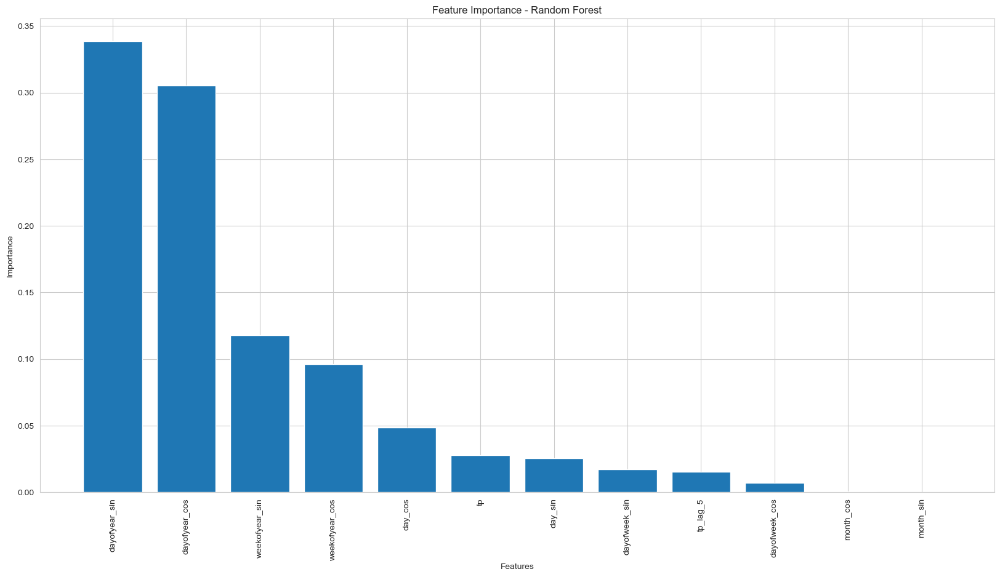

In [60]:
# Get feature importances
importances = rfr.feature_importances_
feature_names = x_train.columns

# Sort indices based on feature importance
indices = np.argsort(importances)[::-1]

# Plotting feature importances
plt.figure(figsize=(20, 10))
plt.bar(range(x_train.shape[1]), importances[indices])
plt.xticks(range(x_train.shape[1]), feature_names[indices], rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance - Random Forest')
plt.show()

SVR with current and lag

In [61]:
# Initialize SVR model
svr = SVR()

tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_lag):
    x_train, x_test = x_lag.iloc[train_index], x_lag.iloc[test_index]
    y_train, y_test = y_lag.iloc[train_index], y_lag.iloc[test_index]

    svr.fit(x_train, y_train.values.reshape(-1, 1).ravel())

    # Fit the best estimator on the entire training data and predict on training data
    p_train = svr.predict(x_train).reshape(-1, 1)
    p_test = svr.predict(x_test).reshape(-1, 1)

    p_train_orig = reverse_transform(p_train, scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test, scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

Train RMSE: 51.78071082888189
Test RMSE: 93.60137012019568
Train MAPE: 0.15558586231985744
Test MAPE: 0.2983060918225899
[101.98344688361081, 164.66058753806777, 14.160075938908465]


K-NNR with current and lag

In [62]:
# Instantiate the grid
knn = KNeighborsRegressor()

tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_lag):
    x_train, x_test = x_lag.iloc[train_index], x_lag.iloc[test_index]
    y_train, y_test = y_lag.iloc[train_index], y_lag.iloc[test_index]

    knn.fit(x_train, y_train.values.reshape(-1, 1).ravel())

    # Fit the best estimator on the entire training data and predict on training data
    p_train = knn.predict(x_train)
    p_test = knn.predict(x_test)

    p_train_orig = reverse_transform(p_train.reshape(-1, 1), scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

Train RMSE: 30.325749887426557
Test RMSE: 40.20577857062023
Train MAPE: 0.09630609309885452
Test MAPE: 0.1118923128982252
[19.09760082848875, 80.09526649044471, 21.42446839292724]


GPR with current and lag

In [63]:
# Initialize GaussianProcessRegressor
gpr = GaussianProcessRegressor()

tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_lag):
    x_train, x_test = x_lag.iloc[train_index], x_lag.iloc[test_index]
    y_train, y_test = y_lag.iloc[train_index], y_lag.iloc[test_index]

    gpr.fit(x_train, y_train.values.flatten())

    # Fit the best estimator on the entire training data and predict on training data
    p_train = gpr.predict(x_train)
    p_test = gpr.predict(x_test)

    p_train_orig = reverse_transform(p_train.reshape(-1, 1), scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

Train RMSE: 1.0428902625302221e-06
Test RMSE: 61.85170724307696
Train MAPE: 1.6947321550109124e-09
Test MAPE: 0.16542915218673787
[37.39243076941269, 146.3378893027769, 1.8248016570412948]


Lightgbm with current and lag

In [64]:


tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_lag):
    x_train, x_test = x_lag.iloc[train_index], x_lag.iloc[test_index]
    y_train, y_test = y_lag.iloc[train_index], y_lag.iloc[test_index]

    lgb_model = LGBMRegressor()
    # fit the model on training data and make predictions for testing set
    lgb_model.fit(x_train, y_train, eval_set=[(x_train, y_train), (x_test, y_test)])

    p_train = lgb_model.predict(x_train).reshape(-1, 1)
    p_test = lgb_model.predict(x_test).reshape(-1, 1)

    p_train_orig = reverse_transform(p_train.reshape(-1, 1), scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000170 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 142
[LightGBM] [Info] Number of data points in the train set: 52, number of used features: 12
[LightGBM] [Info] Start training from score 0.471050
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

<Axes: title={'center': 'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

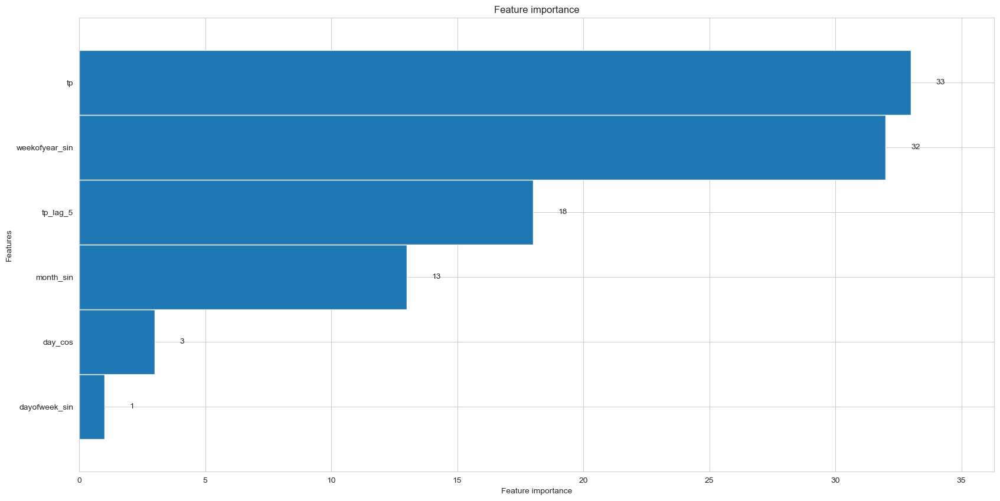

In [65]:
lgb.plot_importance(lgb_model, height = 1, figsize=(20,10))

XGBoost with current and lag

In [66]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_lag):
    x_train, x_test = x_lag.iloc[train_index], x_lag.iloc[test_index]
    y_train, y_test = y_lag.iloc[train_index], y_lag.iloc[test_index]

    xgb_model = xgb.XGBRegressor()  # Pass the best_params as **kwargs
    xgb_model.fit(
        x_train, y_train,
        eval_set=[(x_train, y_train), (x_test, y_test)],
        early_stopping_rounds=30,
        verbose=False
    )

    p_train = xgb_model.predict(x_train).reshape(-1, 1)
    p_test = xgb_model.predict(x_test).reshape(-1, 1)

    p_train_orig = reverse_transform(p_train.reshape(-1, 1), scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

Train RMSE: 8.604823265354852
Test RMSE: 33.92972509110103
Train MAPE: 0.025734422326281297
Test MAPE: 0.09737755771406176
[25.790584833141917, 74.74228065658264, 1.2563097835785215]


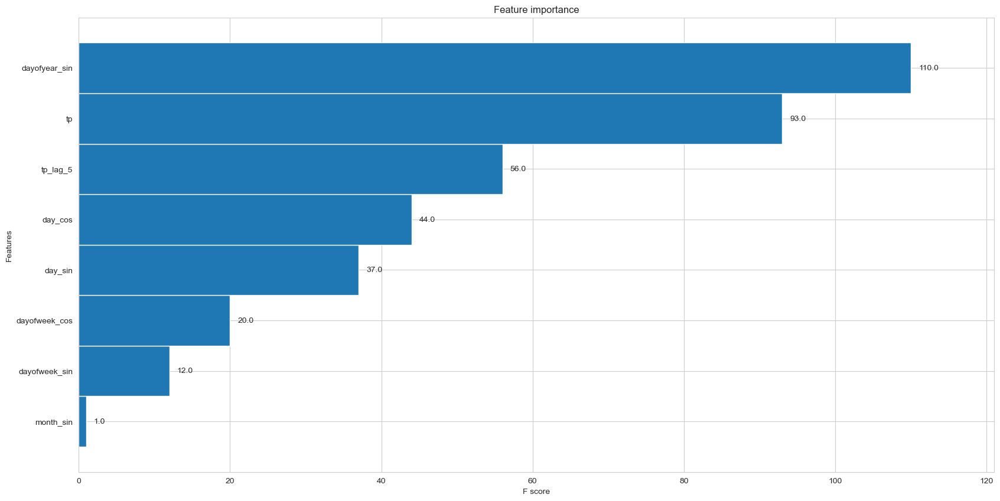

In [67]:
fig, ax = plt.subplots(figsize=(20, 10))
xgb.plot_importance(xgb_model, height=1, ax=ax)
plt.show()

Ensemble with current and lag

In [68]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_lag):
    x_train, x_test = x_lag.iloc[train_index], x_lag.iloc[test_index]
    y_train, y_test = y_lag.iloc[train_index], y_lag.iloc[test_index]

    # MLR
    y_pred_mlr_train = mlr_reg.predict(x_train).reshape(-1, 1)
    y_pred_mlr_test = mlr_reg.predict(x_test).reshape(-1, 1)

    # RFR
    rfr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_rfr_train = rfr.predict(x_train).reshape(-1, 1)
    y_pred_rfr_test = rfr.predict(x_test).reshape(-1, 1)

    # SVR
    svr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_svr_train = svr.predict(x_train).reshape(-1, 1)
    y_pred_svr_test = svr.predict(x_test).reshape(-1, 1)

    # K-NNR
    knn.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_knn_train = knn.predict(x_train).reshape(-1, 1)
    y_pred_knn_test = knn.predict(x_test).reshape(-1, 1)

    # GPR
    gpr.fit(x_train, y_train.values.flatten())
    y_pred_gpr_train = gpr.predict(x_train).reshape(-1, 1)
    y_pred_gpr_test = gpr.predict(x_test).reshape(-1, 1)

    # Lightgbm
    lgb_model.fit(x_train, y_train)
    y_pred_lgb_train = lgb_model.predict(x_train).reshape(-1, 1)
    y_pred_lgb_test = lgb_model.predict(x_test).reshape(-1, 1)

    # XGBoost
    xgb_model.fit(x_train, y_train)
    y_pred_xgb_train = xgb_model.predict(x_train).reshape(-1, 1)
    y_pred_xgb_test = xgb_model.predict(x_test).reshape(-1, 1)

    # ensemble
    y_pred_train_ensemble = (y_pred_mlr_train + y_pred_rfr_train + y_pred_svr_train + y_pred_knn_train + 
                             y_pred_gpr_train + y_pred_lgb_train + y_pred_xgb_train)/7
    
    y_pred_test_ensemble = (y_pred_mlr_test + y_pred_rfr_test + y_pred_svr_test + y_pred_knn_test +
                            y_pred_gpr_test + y_pred_lgb_test + y_pred_xgb_test)/7
    
    
    pred_train_orig = reverse_transform(y_pred_train_ensemble.reshape(-1, 1), scaler_kw, qt_kw)
    pred_test_orig = reverse_transform(y_pred_test_ensemble.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, pred_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, pred_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, pred_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, pred_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000141 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 142
[LightGBM] [Info] Number of data points in the train set: 52, number of used features: 12
[LightGBM] [Info] Start training from score 0.471050
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Plotting

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000155 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 142
[LightGBM] [Info] Number of data points in the train set: 52, number of used features: 12
[LightGBM] [Info] Start training from score 0.471050
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

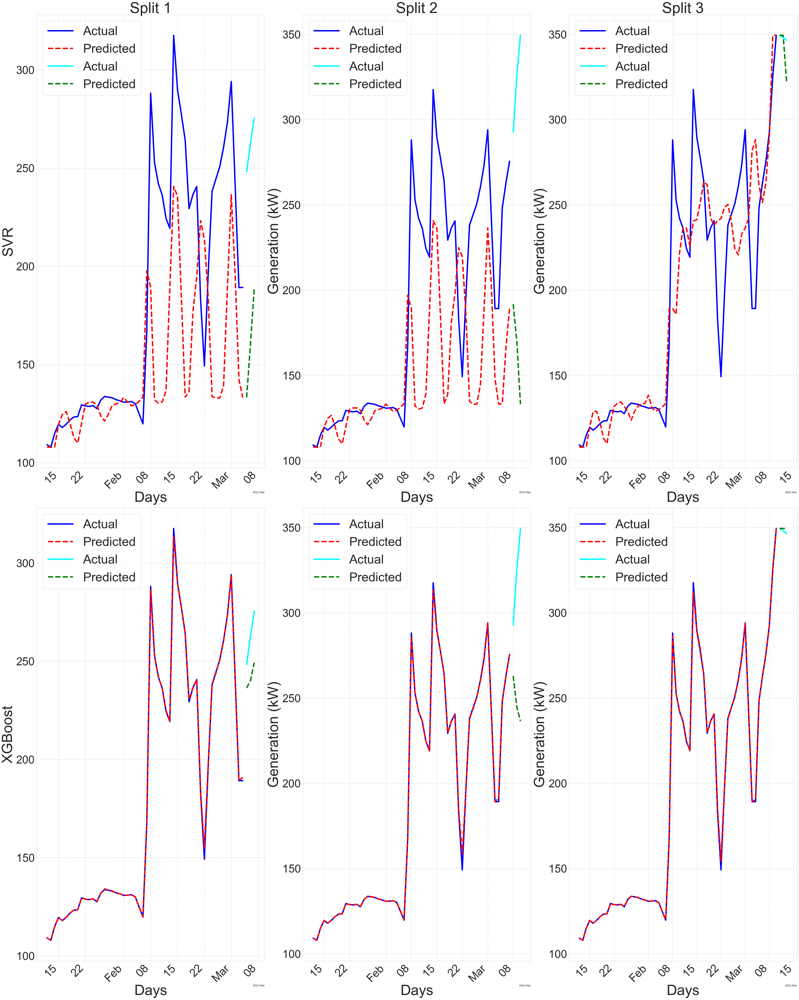

In [69]:
# Initialize the 9x5 grid of subplots
fig, axs = plt.subplots(2, 3, figsize=(40, 50))
models = ['SVR', 'XGBoost']

# Improve x-axis date formatting
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

tsp = TimeSeriesSplit(n_splits=3, test_size=3)

for fold_idx, (train_index, test_index) in enumerate(tsp.split(x_lag)):

    x_train, x_test = x_lag.iloc[train_index], x_lag.iloc[test_index]
    y_train, y_test = y_lag.iloc[train_index], y_lag.iloc[test_index]

    # MLR
    y_pred_mlr_train = mlr_reg.predict(x_train).reshape(-1, 1)
    y_pred_mlr_test = mlr_reg.predict(x_test).reshape(-1, 1)

    # RFR
    rfr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_rfr_train = rfr.predict(x_train).reshape(-1, 1)
    y_pred_rfr_test = rfr.predict(x_test).reshape(-1, 1)

    # SVR
    svr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_svr_train = svr.predict(x_train).reshape(-1, 1)
    y_pred_svr_test = svr.predict(x_test).reshape(-1, 1)

    # K-NNR
    knn.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_knn_train = knn.predict(x_train).reshape(-1, 1)
    y_pred_knn_test = knn.predict(x_test).reshape(-1, 1)

    # GPR
    gpr.fit(x_train, y_train.values.flatten())
    y_pred_gpr_train = gpr.predict(x_train).reshape(-1, 1)
    y_pred_gpr_test = gpr.predict(x_test).reshape(-1, 1)

    # Lightgbm
    lgb_model.fit(x_train, y_train)
    y_pred_lgb_train = lgb_model.predict(x_train).reshape(-1, 1)
    y_pred_lgb_test = lgb_model.predict(x_test).reshape(-1, 1)

    # XGBoost
    xgb_model.fit(x_train, y_train)
    y_pred_xgb_train = xgb_model.predict(x_train).reshape(-1, 1)
    y_pred_xgb_test = xgb_model.predict(x_test).reshape(-1, 1)

    # ensemble
    y_pred_train_ensemble = (y_pred_mlr_train + y_pred_rfr_train + y_pred_svr_train + y_pred_knn_train + 
                             y_pred_gpr_train + y_pred_lgb_train + y_pred_xgb_train)/7
            
    y_pred_test_ensemble = (y_pred_mlr_test + y_pred_rfr_test + y_pred_svr_test + y_pred_knn_test +
                            y_pred_gpr_test + y_pred_lgb_test + y_pred_xgb_test)/7

    # Collect all model predictions for the current fold into a list
    all_preds_train = [y_pred_svr_train, y_pred_xgb_train]

    all_preds_test = [y_pred_svr_test, y_pred_test_ensemble]

    # Loop over each model's prediction and plot on the respective row
    for model_idx, (pred_train, pred_test) in enumerate(zip(all_preds_train, all_preds_test)):
        pred_train_orig = reverse_transform(pred_train.reshape(-1, 1), scaler_kw, qt_kw)
        pred_test_orig = reverse_transform(pred_test.reshape(-1, 1), scaler_kw, qt_kw)

        y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
        y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

        # Plotting
        ax = axs[model_idx, fold_idx]
        ax.plot(x_train.index, y_train_orig, linewidth='5',color='blue', label='Actual')
        ax.plot(x_train.index, pred_train_orig, color='red',linewidth='5', linestyle='--', label='Predicted')
        ax.plot(x_test.index, y_test_orig, linewidth='5', color='cyan', label='Actual')
        ax.plot(x_test.index, pred_test_orig, color='green',linewidth='5', linestyle='--', label='Predicted')

        # Setting the date formatter and locator
        ax.xaxis.set_major_locator(locator)
        ax.xaxis.set_major_formatter(formatter)

        # Add xlabel and ylabel
        ax.set_xlabel('Days', fontsize=52)
        ax.set_ylabel('Generation (kW)', fontsize=52)

        # Only set the title for the top row and legend for the last row
        if fold_idx == 0:
            ax.set_ylabel(models[model_idx])
        if model_idx == 0:
            ax.set_title(f'Split {fold_idx + 1}')

        ax.legend()

# Adjustments for aesthetics
for ax in axs.ravel():
    # Adjust font sizes
    ax.tick_params(axis='both', which='major', labelsize=40)  # Adjust as needed
    ax.set_xlabel(ax.get_xlabel(), fontsize=52)
    ax.set_ylabel(ax.get_ylabel(), fontsize=52)
    ax.set_title(ax.get_title(), fontsize=54)
    
    # Rotate x-axis labels for clarity
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right")

    # Adjust legend fontsize
    ax.legend(fontsize=45)
    
    # Display grid
    ax.grid(True, which='both', linestyle='--', linewidth=1, alpha=1)

# Layout adjustments
plt.tight_layout()
plt.show()

# Current, lag and rolling sum feature integration

MLR with current, lag and rolling sum 

In [70]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_score = []
test_mape_score = []

for train_index, test_index in tsp.split(x_lag_rs):
    x_train, x_test = x_lag_rs.iloc[train_index], x_lag_rs.iloc[test_index]
    y_train, y_test = y_lag_rs.iloc[train_index], y_lag_rs.iloc[test_index]

    mlr_reg = LinearRegression().fit(x_train, y_train)

    y_pred_train_transformed = mlr_reg.predict(x_train)
    y_pred_test_transformed = mlr_reg.predict(x_test)

    # Inverse transforming the predicted values
    y_pred_train = reverse_transform(y_pred_train_transformed.reshape(-1, 1), scaler_kw, qt_kw)
    y_pred_test = reverse_transform(y_pred_test_transformed.reshape(-1, 1), scaler_kw, qt_kw)

    # Inverse transforming the true y values
    y_train_original = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_original = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    # Calculating RMSE and MAPE
    RMSE_train = mean_squared_error(y_train_original, y_pred_train, squared=False)
    RMSE_test = mean_squared_error(y_test_original, y_pred_test, squared=False)
    MAPE_train = mean_absolute_percentage_error(y_train_original, y_pred_train)
    MAPE_test = mean_absolute_percentage_error(y_test_original, y_pred_test)

    train_rmse_scores.append(RMSE_train)
    test_rmse_scores.append(RMSE_test)

    train_mape_score.append(MAPE_train)
    test_mape_score.append(MAPE_test)

print(test_rmse_scores)
print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_score), np.mean(test_mape_score)))

[26.47052897300588, 42.597599979326105, 1.4521641409980999]
Train RMSE: 29.546462751642412
Test RMSE: 23.50676436444336
Train MAPE: 0.08861947080847882
Test MAPE: 0.060552800971299746


RFR with current, lag and rolling sum 

In [71]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_lag_rs):
    x_train, x_test = x_lag_rs.iloc[train_index], x_lag_rs.iloc[test_index]
    y_train, y_test = y_lag_rs.iloc[train_index], y_lag_rs.iloc[test_index]

    rfr = RandomForestRegressor(random_state=42)
    rfr.fit(x_train, y_train.values.reshape(-1, 1).ravel())

    p_train = rfr.predict(x_train).reshape(-1, 1)
    p_test = rfr.predict(x_test).reshape(-1, 1)

    p_train_orig = reverse_transform(p_train, scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test, scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)


print(test_rmse_scores)
print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))

[27.68999829387602, 77.30698812524483, 1.8248173208524179]
Train RMSE: 13.048006227140435
Test RMSE: 35.60726791332442
Train MAPE: 0.03504554735808085
Test MAPE: 0.10512160607639931


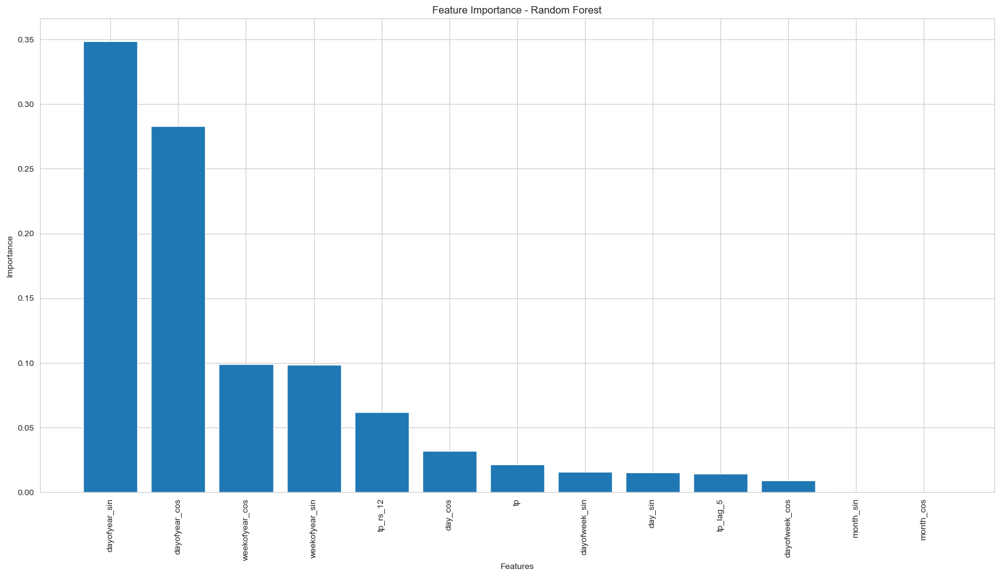

In [72]:
# Get feature importances
importances = rfr.feature_importances_
feature_names = x_train.columns

# Sort indices based on feature importance
indices = np.argsort(importances)[::-1]

# Plotting feature importances
plt.figure(figsize=(20, 10))
plt.bar(range(x_train.shape[1]), importances[indices])
plt.xticks(range(x_train.shape[1]), feature_names[indices], rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance - Random Forest')
plt.show()

SVR with current, lag and rolling sum 

In [73]:
# Initialize SVR model
svr = SVR()

tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_lag_rs):
    x_train, x_test = x_lag_rs.iloc[train_index], x_lag_rs.iloc[test_index]
    y_train, y_test = y_lag_rs.iloc[train_index], y_lag_rs.iloc[test_index]

    svr.fit(x_train, y_train.values.reshape(-1, 1).ravel())

    # Fit the best estimator on the entire training data and predict on training data
    p_train = svr.predict(x_train).reshape(-1, 1)
    p_test = svr.predict(x_test).reshape(-1, 1)

    p_train_orig = reverse_transform(p_train, scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test, scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)


print(test_rmse_scores)
print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))

[4.788330547385948, 76.76389127974726, 25.77724538737357]
Train RMSE: 44.41263810010188
Test RMSE: 35.77648907150226
Train MAPE: 0.13533959218539746
Test MAPE: 0.09796801841113807


K-NNR with current, lag and rolling sum 

In [74]:
# Instantiate the grid
knn = KNeighborsRegressor()

tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_lag_rs):
    x_train, x_test = x_lag_rs.iloc[train_index], x_lag_rs.iloc[test_index]
    y_train, y_test = y_lag_rs.iloc[train_index], y_lag_rs.iloc[test_index]

    # define a knn regressor
    knn = KNeighborsRegressor()
    knn.fit(x_train, y_train.values.reshape(-1, 1).ravel())

    # Fit the best estimator on the entire training data and predict on training data
    p_train = knn.predict(x_train)
    p_test = knn.predict(x_test)

    p_train_orig = reverse_transform(p_train.reshape(-1, 1), scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print(test_rmse_scores)
print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))

[19.09760082848875, 80.09526649044471, 21.424468392927263]
Train RMSE: 30.30678571578724
Test RMSE: 40.20577857062025
Train MAPE: 0.08103439819715799
Test MAPE: 0.11189231289822521


GPR with current, lag and rolling sum 

In [75]:
# Initialize GaussianProcessRegressor
gpr = GaussianProcessRegressor()

tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_lag_rs):
    x_train, x_test = x_lag_rs.iloc[train_index], x_lag_rs.iloc[test_index]
    y_train, y_test = y_lag_rs.iloc[train_index], y_lag_rs.iloc[test_index]

    gpr.fit(x_train, y_train.values.flatten())

    # Fit the best estimator on the entire training data and predict on training data
    p_train = gpr.predict(x_train)
    p_test = gpr.predict(x_test)

    p_train_orig = reverse_transform(p_train.reshape(-1, 1), scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print(test_rmse_scores)
print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))

[61.94249903433584, 156.938933410935, 1.8235899825393438]
Train RMSE: 1.0303841533175147e-06
Test RMSE: 73.56834080927005
Train MAPE: 1.540096599230969e-09
Test MAPE: 0.21417104766180128


LightGBM with current, lag and rolling sum 

In [76]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_lag_rs):
    x_train, x_test = x_lag_rs.iloc[train_index], x_lag_rs.iloc[test_index]
    y_train, y_test = y_lag_rs.iloc[train_index], y_lag_rs.iloc[test_index]

    lgb_model = LGBMRegressor()
    # fit the model on training data and make predictions for testing set
    lgb_model.fit(x_train, y_train, eval_set=[(x_train, y_train), (x_test, y_test)])

    p_train = lgb_model.predict(x_train).reshape(-1, 1)
    p_test = lgb_model.predict(x_test).reshape(-1, 1)

    p_train_orig = reverse_transform(p_train.reshape(-1, 1), scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print(test_rmse_scores)
print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 161
[LightGBM] [Info] Number of data points in the train set: 52, number of used features: 13
[LightGBM] [Info] Start training from score 0.471050
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

<Axes: title={'center': 'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

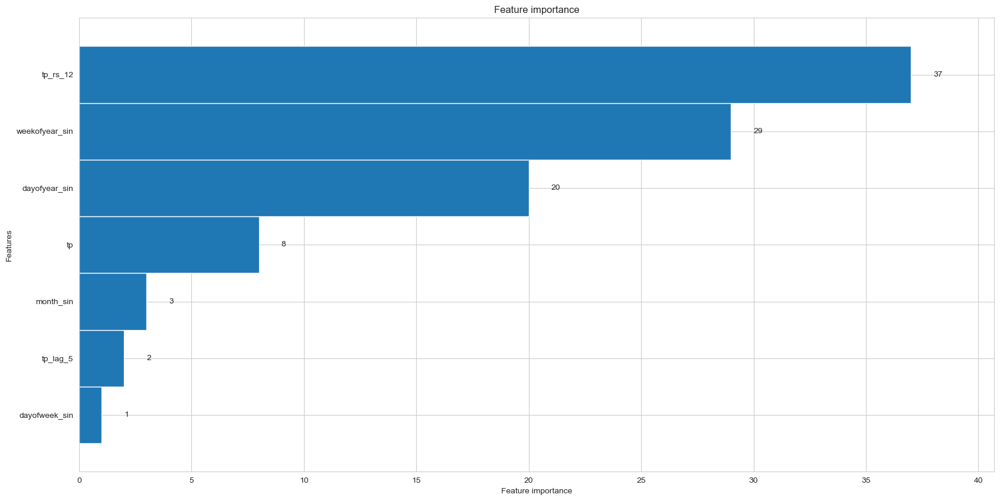

In [77]:
lgb.plot_importance(lgb_model, height = 1, figsize=(20,10))

XGBoost with current, lag and rolling sum 

In [78]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_lag_rs):
    x_train, x_test = x_lag_rs.iloc[train_index], x_lag_rs.iloc[test_index]
    y_train, y_test = y_lag_rs.iloc[train_index], y_lag_rs.iloc[test_index]

    xgb_model = xgb.XGBRegressor()  # Pass the best_params as **kwargs
    xgb_model.fit(
        x_train, y_train,
        eval_set=[(x_train, y_train), (x_test, y_test)],
        early_stopping_rounds=30,
        verbose=False
    )

    p_train = xgb_model.predict(x_train).reshape(-1, 1)
    p_test = xgb_model.predict(x_test).reshape(-1, 1)

    p_train_orig = reverse_transform(p_train.reshape(-1, 1), scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

Train RMSE: 8.231829479186226
Test RMSE: 44.21819626351199
Train MAPE: 0.024723770437752802
Test MAPE: 0.13537718018873138
[24.904547755365535, 106.4937312515919, 1.2563097835785215]


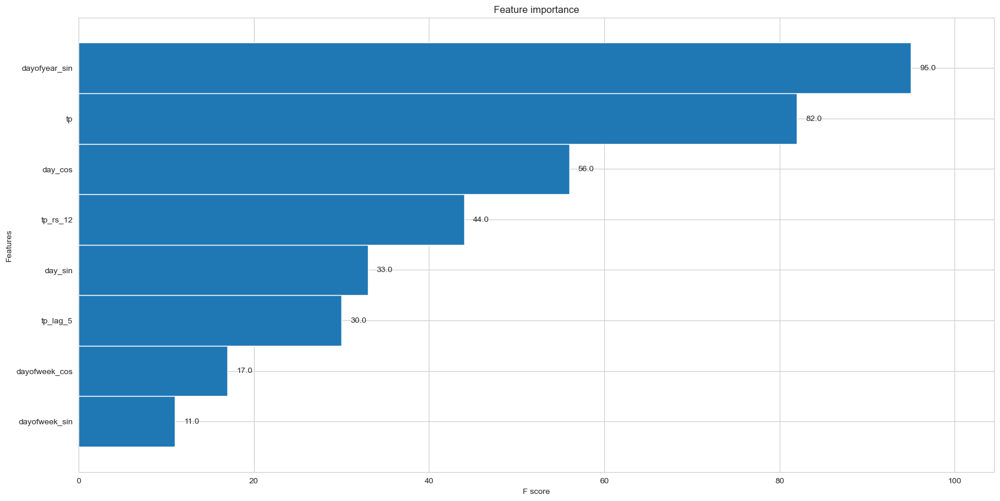

In [79]:
fig, ax = plt.subplots(figsize=(20, 10))
xgb.plot_importance(xgb_model, height=1, ax=ax)
plt.show()

Ensemble with current, lag and rolling sum

In [80]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_lag_rs):
    x_train, x_test = x_lag_rs.iloc[train_index], x_lag_rs.iloc[test_index]
    y_train, y_test = y_lag_rs.iloc[train_index], y_lag_rs.iloc[test_index]

    # MLR
    y_pred_mlr_train = mlr_reg.predict(x_train).reshape(-1, 1)
    y_pred_mlr_test = mlr_reg.predict(x_test).reshape(-1, 1)

    # RFR
    rfr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_rfr_train = rfr.predict(x_train).reshape(-1, 1)
    y_pred_rfr_test = rfr.predict(x_test).reshape(-1, 1)

    # SVR
    svr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_svr_train = svr.predict(x_train).reshape(-1, 1)
    y_pred_svr_test = svr.predict(x_test).reshape(-1, 1)

    # K-NNR
    knn.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_knn_train = knn.predict(x_train).reshape(-1, 1)
    y_pred_knn_test = knn.predict(x_test).reshape(-1, 1)

    # GPR
    gpr.fit(x_train, y_train.values.flatten())
    y_pred_gpr_train = gpr.predict(x_train).reshape(-1, 1)
    y_pred_gpr_test = gpr.predict(x_test).reshape(-1, 1)

    # Lightgbm
    lgb_model.fit(x_train, y_train)
    y_pred_lgb_train = lgb_model.predict(x_train).reshape(-1, 1)
    y_pred_lgb_test = lgb_model.predict(x_test).reshape(-1, 1)

    # XGBoost
    xgb_model.fit(x_train, y_train)
    y_pred_xgb_train = xgb_model.predict(x_train).reshape(-1, 1)
    y_pred_xgb_test = xgb_model.predict(x_test).reshape(-1, 1)

    # ensemble
    y_pred_train_ensemble = (y_pred_mlr_train + y_pred_rfr_train + y_pred_svr_train + y_pred_knn_train + 
                             y_pred_gpr_train + y_pred_lgb_train + y_pred_xgb_train)/7
    
    y_pred_test_ensemble = (y_pred_mlr_test + y_pred_rfr_test + y_pred_svr_test + y_pred_knn_test +
                            y_pred_gpr_test + y_pred_lgb_test + y_pred_xgb_test)/7
    
    
    pred_train_orig = reverse_transform(y_pred_train_ensemble.reshape(-1, 1), scaler_kw, qt_kw)
    pred_test_orig = reverse_transform(y_pred_test_ensemble.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, pred_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, pred_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, pred_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, pred_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 161
[LightGBM] [Info] Number of data points in the train set: 52, number of used features: 13
[LightGBM] [Info] Start training from score 0.471050
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Plotting

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000191 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 161
[LightGBM] [Info] Number of data points in the train set: 52, number of used features: 13
[LightGBM] [Info] Start training from score 0.471050
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

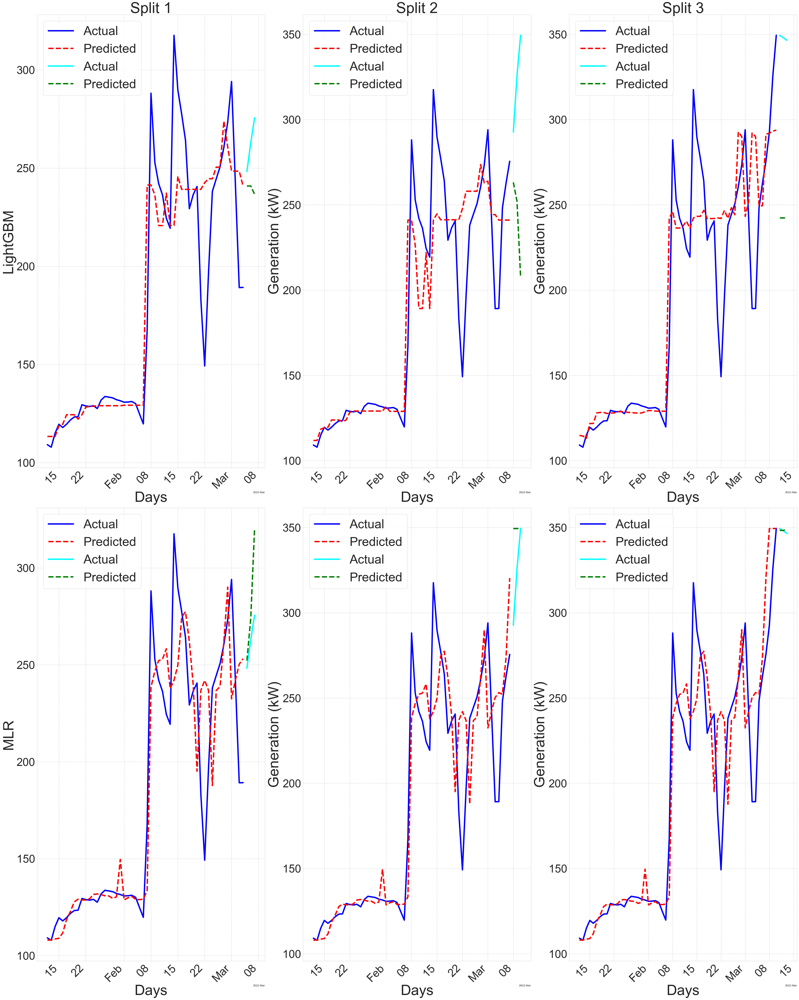

In [81]:
# Initialize the 9x5 grid of subplots
fig, axs = plt.subplots(2, 3, figsize=(40, 50))
models = ['LightGBM', 'MLR']

# Improve x-axis date formatting
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

tsp = TimeSeriesSplit(n_splits=3, test_size=3)

for fold_idx, (train_index, test_index) in enumerate(tsp.split(x_lag_rs)):

    x_train, x_test = x_lag_rs.iloc[train_index], x_lag_rs.iloc[test_index]
    y_train, y_test = y_lag_rs.iloc[train_index], y_lag_rs.iloc[test_index]

    # MLR
    y_pred_mlr_train = mlr_reg.predict(x_train).reshape(-1, 1)
    y_pred_mlr_test = mlr_reg.predict(x_test).reshape(-1, 1)

    # RFR
    rfr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_rfr_train = rfr.predict(x_train).reshape(-1, 1)
    y_pred_rfr_test = rfr.predict(x_test).reshape(-1, 1)

    # SVR
    svr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_svr_train = svr.predict(x_train).reshape(-1, 1)
    y_pred_svr_test = svr.predict(x_test).reshape(-1, 1)

    # K-NNR
    knn.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_knn_train = knn.predict(x_train).reshape(-1, 1)
    y_pred_knn_test = knn.predict(x_test).reshape(-1, 1)

    # GPR
    gpr.fit(x_train, y_train.values.flatten())
    y_pred_gpr_train = gpr.predict(x_train).reshape(-1, 1)
    y_pred_gpr_test = gpr.predict(x_test).reshape(-1, 1)

    # Lightgbm
    lgb_model.fit(x_train, y_train)
    y_pred_lgb_train = lgb_model.predict(x_train).reshape(-1, 1)
    y_pred_lgb_test = lgb_model.predict(x_test).reshape(-1, 1)

    # XGBoost
    xgb_model.fit(x_train, y_train)
    y_pred_xgb_train = xgb_model.predict(x_train).reshape(-1, 1)
    y_pred_xgb_test = xgb_model.predict(x_test).reshape(-1, 1)

    # ensemble
    y_pred_train_ensemble = (y_pred_mlr_train + y_pred_rfr_train + y_pred_svr_train + y_pred_knn_train + 
                             y_pred_gpr_train + y_pred_lgb_train + y_pred_xgb_train)/7
            
    y_pred_test_ensemble = (y_pred_mlr_test + y_pred_rfr_test + y_pred_svr_test + y_pred_knn_test +
                            y_pred_gpr_test + y_pred_lgb_test + y_pred_xgb_test)/7

    # Collect all model predictions for the current fold into a list
    all_preds_train = [y_pred_lgb_train, y_pred_mlr_train]

    all_preds_test = [y_pred_lgb_test, y_pred_mlr_test]

    # Loop over each model's prediction and plot on the respective row
    for model_idx, (pred_train, pred_test) in enumerate(zip(all_preds_train, all_preds_test)):
        pred_train_orig = reverse_transform(pred_train.reshape(-1, 1), scaler_kw, qt_kw)
        pred_test_orig = reverse_transform(pred_test.reshape(-1, 1), scaler_kw, qt_kw)

        y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
        y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

        # Plotting
        ax = axs[model_idx, fold_idx]
        ax.plot(x_train.index, y_train_orig, linewidth='5',color='blue', label='Actual')
        ax.plot(x_train.index, pred_train_orig, color='red',linewidth='5', linestyle='--', label='Predicted')
        ax.plot(x_test.index, y_test_orig, linewidth='5', color='cyan', label='Actual')
        ax.plot(x_test.index, pred_test_orig, color='green',linewidth='5', linestyle='--', label='Predicted')

        # Setting the date formatter and locator
        ax.xaxis.set_major_locator(locator)
        ax.xaxis.set_major_formatter(formatter)

        # Add xlabel and ylabel
        ax.set_xlabel('Days', fontsize=52)
        ax.set_ylabel('Generation (kW)', fontsize=52)

        # Only set the title for the top row and legend for the last row
        if fold_idx == 0:
            ax.set_ylabel(models[model_idx])
        if model_idx == 0:
            ax.set_title(f'Split {fold_idx + 1}')

        ax.legend()

# Adjustments for aesthetics
for ax in axs.ravel():
    # Adjust font sizes
    ax.tick_params(axis='both', which='major', labelsize=40)  # Adjust as needed
    ax.set_xlabel(ax.get_xlabel(), fontsize=52)
    ax.set_ylabel(ax.get_ylabel(), fontsize=52)
    ax.set_title(ax.get_title(), fontsize=54)
    
    # Rotate x-axis labels for clarity
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right")

    # Adjust legend fontsize
    ax.legend(fontsize=45)
    
    # Display grid
    ax.grid(True, which='both', linestyle='--', linewidth=1, alpha=1)

# Layout adjustments
plt.tight_layout()
plt.show()

# lag of Rolling Sum only

MLR with lag of rolling sum 

In [82]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_score = []
test_mape_score = []

for train_index, test_index in tsp.split(x_rslag_o):
    x_train, x_test = x_rslag_o.iloc[train_index], x_rslag_o.iloc[test_index]
    y_train, y_test = y_rslag_o.iloc[train_index], y_rslag_o.iloc[test_index]

    mlr_reg = LinearRegression().fit(x_train, y_train)

    y_pred_train_transformed = mlr_reg.predict(x_train)
    y_pred_test_transformed = mlr_reg.predict(x_test)

    # Inverse transforming the predicted values
    y_pred_train = reverse_transform(y_pred_train_transformed.reshape(-1, 1), scaler_kw, qt_kw)
    y_pred_test = reverse_transform(y_pred_test_transformed.reshape(-1, 1), scaler_kw, qt_kw)

    # Inverse transforming the true y values
    y_train_original = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_original = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    # Calculating RMSE and MAPE
    RMSE_train = mean_squared_error(y_train_original, y_pred_train, squared=False)
    RMSE_test = mean_squared_error(y_test_original, y_pred_test, squared=False)
    MAPE_train = mean_absolute_percentage_error(y_train_original, y_pred_train)
    MAPE_test = mean_absolute_percentage_error(y_test_original, y_pred_test)

    train_rmse_scores.append(RMSE_train)
    test_rmse_scores.append(RMSE_test)

    train_mape_score.append(MAPE_train)
    test_mape_score.append(MAPE_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_score), np.mean(test_mape_score)))
print(test_rmse_scores)

Train RMSE: 33.08013777448227
Test RMSE: 44.0210371987832
Train MAPE: 0.09572756481128858
Test MAPE: 0.13863052741192078
[78.30797576456239, 51.95344087769331, 1.8016949540938807]


RFR with lag of rolling sum 

In [83]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_rslag_o):
    x_train, x_test = x_rslag_o.iloc[train_index], x_rslag_o.iloc[test_index]
    y_train, y_test = y_rslag_o.iloc[train_index], y_rslag_o.iloc[test_index]

    rfr = RandomForestRegressor(random_state=42)
    rfr.fit(x_train, y_train.values.reshape(-1, 1).ravel())

    p_train = rfr.predict(x_train).reshape(-1, 1)
    p_test = rfr.predict(x_test).reshape(-1, 1)

    p_train_orig = reverse_transform(p_train, scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test, scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

Train RMSE: 13.983287728778144
Test RMSE: 35.99878963750688
Train MAPE: 0.036911064224385476
Test MAPE: 0.10508136505811351
[30.360152798999383, 75.81214169852618, 1.8240744149950965]


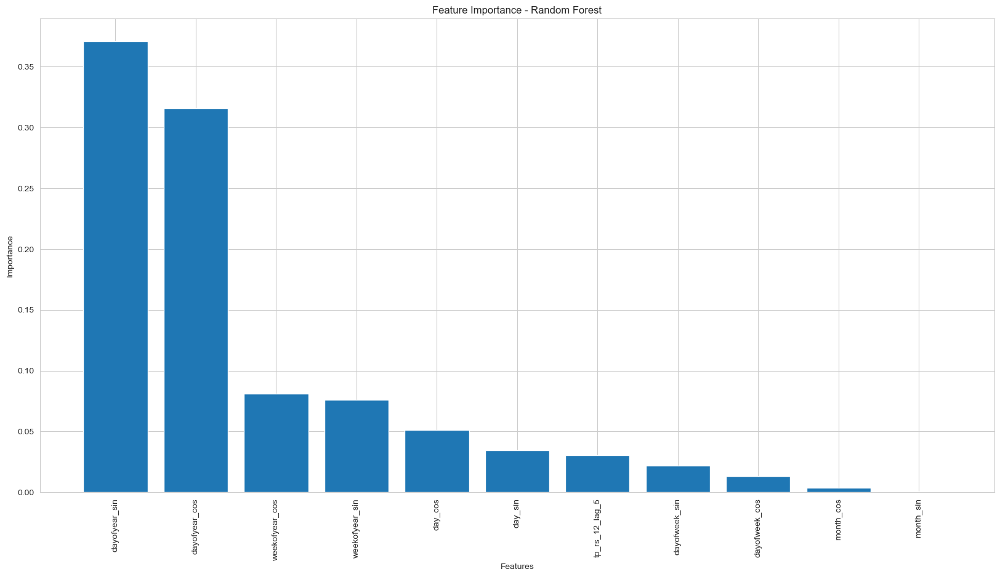

In [84]:
# Get feature importances
importances = rfr.feature_importances_
feature_names = x_train.columns

# Sort indices based on feature importance
indices = np.argsort(importances)[::-1]

# Plotting feature importances
plt.figure(figsize=(20, 10))
plt.bar(range(x_train.shape[1]), importances[indices])
plt.xticks(range(x_train.shape[1]), feature_names[indices], rotation='vertical')
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance - Random Forest')
plt.show()

SVR with lag of rolling sum

In [85]:
# Initialize SVR model
svr = SVR()

tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_rslag_o):
    x_train, x_test = x_rslag_o.iloc[train_index], x_rslag_o.iloc[test_index]
    y_train, y_test = y_rslag_o.iloc[train_index], y_rslag_o.iloc[test_index]

    svr.fit(x_train, y_train.values.reshape(-1, 1).ravel())

    # Fit the best estimator on the entire training data and predict on training data
    p_train = svr.predict(x_train).reshape(-1, 1)
    p_test = svr.predict(x_test).reshape(-1, 1)

    p_train_orig = reverse_transform(p_train, scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test, scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)


print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

Train RMSE: 32.010493694349435
Test RMSE: 46.66554677460841
Train MAPE: 0.10703791464201505
Test MAPE: 0.13548209778844197
[15.689476154656544, 67.50410043109272, 56.803063738075956]


K-NNR with lag of rolling sum 

In [86]:
# Instantiate the grid
knn = KNeighborsRegressor()

tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_rslag_o):
    x_train, x_test = x_rslag_o.iloc[train_index], x_rslag_o.iloc[test_index]
    y_train, y_test = y_rslag_o.iloc[train_index], y_rslag_o.iloc[test_index]

    knn.fit(x_train, y_train.values.reshape(-1, 1).ravel())

    # Fit the best estimator on the entire training data and predict on training data
    p_train = knn.predict(x_train)
    p_test = knn.predict(x_test)

    p_train_orig = reverse_transform(p_train.reshape(-1, 1), scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

Train RMSE: 27.414532941605597
Test RMSE: 40.22582612811978
Train MAPE: 0.07884848512398014
Test MAPE: 0.11391939566752662
[19.15774350098738, 80.09526649044471, 21.42446839292724]


GPR with lag of rolling sum 

In [87]:
# Initialize GaussianProcessRegressor
gpr = GaussianProcessRegressor()

tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_rslag_o):
    x_train, x_test = x_rslag_o.iloc[train_index], x_rslag_o.iloc[test_index]
    y_train, y_test = y_rslag_o.iloc[train_index], y_rslag_o.iloc[test_index]

    gpr.fit(x_train, y_train.values.flatten())

    # Fit the best estimator on the entire training data and predict on training data
    p_train = gpr.predict(x_train)
    p_test = gpr.predict(x_test)

    p_train_orig = reverse_transform(p_train.reshape(-1, 1), scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)
    
print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

Train RMSE: 4.090740444286098e-07
Test RMSE: 71.2601721993684
Train MAPE: 9.526967378898502e-10
Test MAPE: 0.20594533149880004
[41.783956771868155, 170.17934980158444, 1.8172100246525875]


LightGBM with lag of rolling sum 

In [88]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_rslag_o):
    x_train, x_test = x_rslag_o.iloc[train_index], x_rslag_o.iloc[test_index]
    y_train, y_test = y_rslag_o.iloc[train_index], y_rslag_o.iloc[test_index]

    lgb_model = LGBMRegressor()
    # fit the model on training data and make predictions for testing set
    lgb_model.fit(x_train, y_train, eval_set=[(x_train, y_train), (x_test, y_test)])

    p_train = lgb_model.predict(x_train).reshape(-1, 1)
    p_test = lgb_model.predict(x_test).reshape(-1, 1)

    p_train_orig = reverse_transform(p_train.reshape(-1, 1), scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print(test_rmse_scores)
print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001072 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 112
[LightGBM] [Info] Number of data points in the train set: 48, number of used features: 9
[LightGBM] [Info] Start training from score 0.489999
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

<Axes: title={'center': 'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

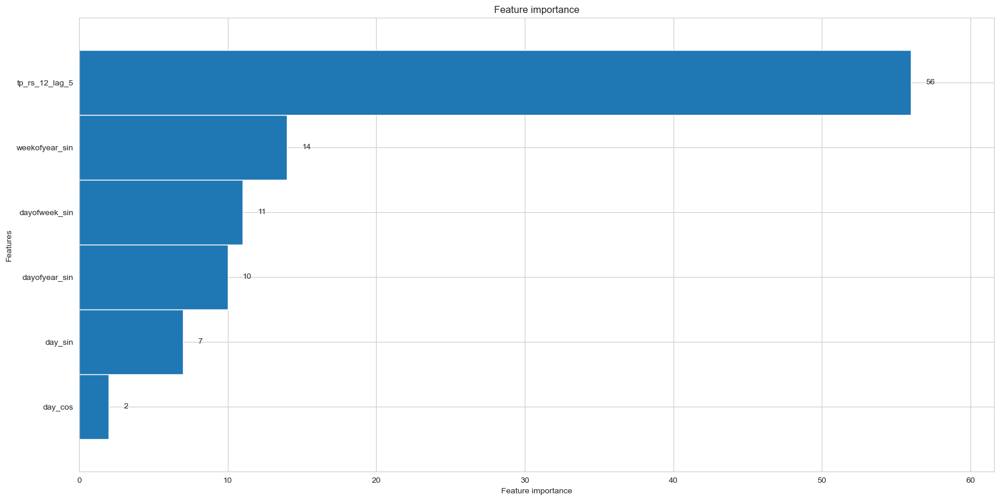

In [89]:
lgb.plot_importance(lgb_model, height = 1, figsize=(20,10))

XGBoost with lag of rolling sum 

In [90]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_rslag_o):
    x_train, x_test = x_rslag_o.iloc[train_index], x_rslag_o.iloc[test_index]
    y_train, y_test = y_rslag_o.iloc[train_index], y_rslag_o.iloc[test_index]

    xgb_model = xgb.XGBRegressor()  # Pass the best_params as **kwargs
    xgb_model.fit(
        x_train, y_train,
        eval_set=[(x_train, y_train), (x_test, y_test)],
        early_stopping_rounds=30,
        verbose=False
    )

    p_train = xgb_model.predict(x_train).reshape(-1, 1)
    p_test = xgb_model.predict(x_test).reshape(-1, 1)

    p_train_orig = reverse_transform(p_train.reshape(-1, 1), scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

Train RMSE: 7.6511297215971545
Test RMSE: 37.78420844860131
Train MAPE: 0.02295706430925655
Test MAPE: 0.10704833237359161
[35.87148725289598, 76.22482830932944, 1.2563097835785215]


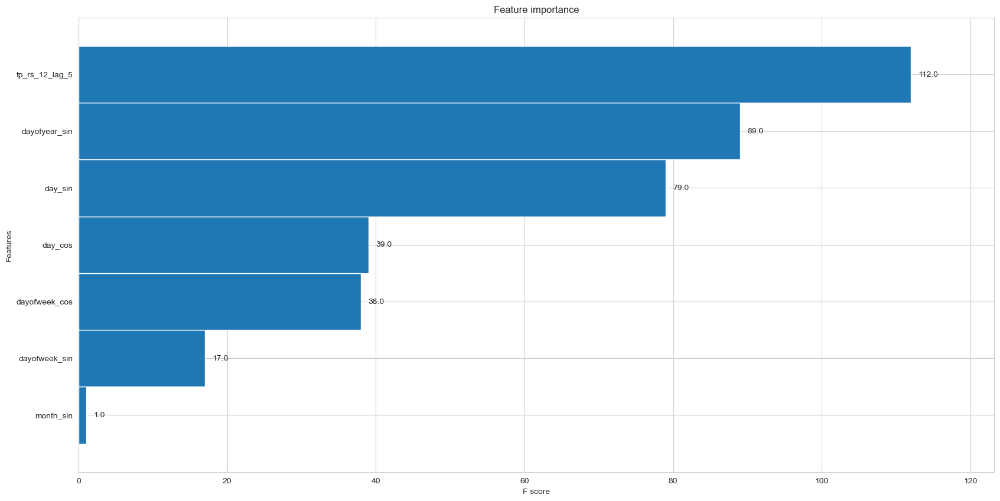

In [91]:
fig, ax = plt.subplots(figsize=(20, 10))
xgb.plot_importance(xgb_model, height=1, ax=ax)
plt.show()

Ensemble with lag of rolling sum

In [92]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_rslag_o):
    x_train, x_test = x_rslag_o.iloc[train_index], x_rslag_o.iloc[test_index]
    y_train, y_test = y_rslag_o.iloc[train_index], y_rslag_o.iloc[test_index]

    # MLR
    y_pred_mlr_train = mlr_reg.predict(x_train).reshape(-1, 1)
    y_pred_mlr_test = mlr_reg.predict(x_test).reshape(-1, 1)

    # RFR
    rfr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_rfr_train = rfr.predict(x_train).reshape(-1, 1)
    y_pred_rfr_test = rfr.predict(x_test).reshape(-1, 1)

    # SVR
    svr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_svr_train = svr.predict(x_train).reshape(-1, 1)
    y_pred_svr_test = svr.predict(x_test).reshape(-1, 1)

    # K-NNR
    knn.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_knn_train = knn.predict(x_train).reshape(-1, 1)
    y_pred_knn_test = knn.predict(x_test).reshape(-1, 1)

    # GPR
    gpr.fit(x_train, y_train.values.flatten())
    y_pred_gpr_train = gpr.predict(x_train).reshape(-1, 1)
    y_pred_gpr_test = gpr.predict(x_test).reshape(-1, 1)

    # Lightgbm
    lgb_model.fit(x_train, y_train)
    y_pred_lgb_train = lgb_model.predict(x_train).reshape(-1, 1)
    y_pred_lgb_test = lgb_model.predict(x_test).reshape(-1, 1)

    # XGBoost
    xgb_model.fit(x_train, y_train)
    y_pred_xgb_train = xgb_model.predict(x_train).reshape(-1, 1)
    y_pred_xgb_test = xgb_model.predict(x_test).reshape(-1, 1)

    # ensemble
    y_pred_train_ensemble = (y_pred_mlr_train + y_pred_rfr_train + y_pred_svr_train + y_pred_knn_train + 
                             y_pred_gpr_train + y_pred_lgb_train + y_pred_xgb_train)/7
    
    y_pred_test_ensemble = (y_pred_mlr_test + y_pred_rfr_test + y_pred_svr_test + y_pred_knn_test +
                            y_pred_gpr_test + y_pred_lgb_test + y_pred_xgb_test)/7
    
    
    pred_train_orig = reverse_transform(y_pred_train_ensemble.reshape(-1, 1), scaler_kw, qt_kw)
    pred_test_orig = reverse_transform(y_pred_test_ensemble.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, pred_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, pred_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, pred_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, pred_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000113 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 112
[LightGBM] [Info] Number of data points in the train set: 48, number of used features: 9
[LightGBM] [Info] Start training from score 0.489999
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

Plotting

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000127 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 112
[LightGBM] [Info] Number of data points in the train set: 48, number of used features: 9
[LightGBM] [Info] Start training from score 0.489999
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, b

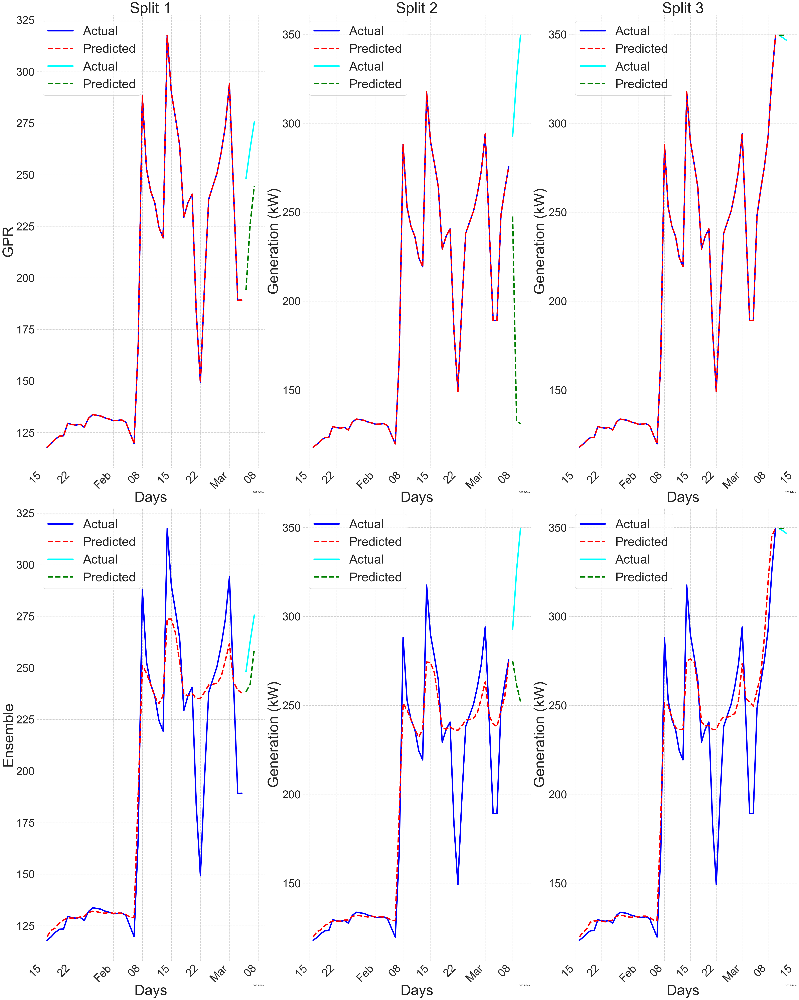

In [93]:
# Initialize the 9x5 grid of subplots
fig, axs = plt.subplots(2, 3, figsize=(40, 50))
models = ['GPR', 'Ensemble']

# Improve x-axis date formatting
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

tsp = TimeSeriesSplit(n_splits=3, test_size=3)

for fold_idx, (train_index, test_index) in enumerate(tsp.split(x_rslag_o)):

    x_train, x_test = x_rslag_o.iloc[train_index], x_rslag_o.iloc[test_index]
    y_train, y_test = y_rslag_o.iloc[train_index], y_rslag_o.iloc[test_index]

    # MLR
    y_pred_mlr_train = mlr_reg.predict(x_train).reshape(-1, 1)
    y_pred_mlr_test = mlr_reg.predict(x_test).reshape(-1, 1)

    # RFR
    rfr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_rfr_train = rfr.predict(x_train).reshape(-1, 1)
    y_pred_rfr_test = rfr.predict(x_test).reshape(-1, 1)

    # SVR
    svr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_svr_train = svr.predict(x_train).reshape(-1, 1)
    y_pred_svr_test = svr.predict(x_test).reshape(-1, 1)

    # K-NNR
    knn.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_knn_train = knn.predict(x_train).reshape(-1, 1)
    y_pred_knn_test = knn.predict(x_test).reshape(-1, 1)

    # GPR
    gpr.fit(x_train, y_train.values.flatten())
    y_pred_gpr_train = gpr.predict(x_train).reshape(-1, 1)
    y_pred_gpr_test = gpr.predict(x_test).reshape(-1, 1)

    # Lightgbm
    lgb_model.fit(x_train, y_train)
    y_pred_lgb_train = lgb_model.predict(x_train).reshape(-1, 1)
    y_pred_lgb_test = lgb_model.predict(x_test).reshape(-1, 1)

    # XGBoost
    xgb_model.fit(x_train, y_train)
    y_pred_xgb_train = xgb_model.predict(x_train).reshape(-1, 1)
    y_pred_xgb_test = xgb_model.predict(x_test).reshape(-1, 1)


    # ensemble
    y_pred_train_ensemble = (y_pred_mlr_train + y_pred_rfr_train + y_pred_svr_train + y_pred_knn_train + 
                             y_pred_gpr_train + y_pred_lgb_train + y_pred_xgb_train)/7
            
    y_pred_test_ensemble = (y_pred_mlr_test + y_pred_rfr_test + y_pred_svr_test + y_pred_knn_test +
                            y_pred_gpr_test + y_pred_lgb_test + y_pred_xgb_test)/7

    # Collect all model predictions for the current fold into a list
    all_preds_train = [y_pred_gpr_train, y_pred_train_ensemble]

    all_preds_test = [y_pred_gpr_test, y_pred_test_ensemble]

    # Loop over each model's prediction and plot on the respective row
    for model_idx, (pred_train, pred_test) in enumerate(zip(all_preds_train, all_preds_test)):
        pred_train_orig = reverse_transform(pred_train.reshape(-1, 1), scaler_kw, qt_kw)
        pred_test_orig = reverse_transform(pred_test.reshape(-1, 1), scaler_kw, qt_kw)

        y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
        y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

        # Plotting
        ax = axs[model_idx, fold_idx]
        ax.plot(x_train.index, y_train_orig, linewidth='5',color='blue', label='Actual')
        ax.plot(x_train.index, pred_train_orig, color='red',linewidth='5', linestyle='--', label='Predicted')
        ax.plot(x_test.index, y_test_orig, linewidth='5', color='cyan', label='Actual')
        ax.plot(x_test.index, pred_test_orig, color='green',linewidth='5', linestyle='--', label='Predicted')

        # Setting the date formatter and locator
        ax.xaxis.set_major_locator(locator)
        ax.xaxis.set_major_formatter(formatter)

        # Add xlabel and ylabel
        ax.set_xlabel('Days', fontsize=52)
        ax.set_ylabel('Generation (kW)', fontsize=52)

        # Only set the title for the top row and legend for the last row
        if fold_idx == 0:
            ax.set_ylabel(models[model_idx])
        if model_idx == 0:
            ax.set_title(f'Split {fold_idx + 1}')

        ax.legend()

# Adjustments for aesthetics
for ax in axs.ravel():
    # Adjust font sizes
    ax.tick_params(axis='both', which='major', labelsize=40)  # Adjust as needed
    ax.set_xlabel(ax.get_xlabel(), fontsize=52)
    ax.set_ylabel(ax.get_ylabel(), fontsize=52)
    ax.set_title(ax.get_title(), fontsize=54)
    
    # Rotate x-axis labels for clarity
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right")

    # Adjust legend fontsize
    ax.legend(fontsize=45)
    
    # Display grid
    ax.grid(True, which='both', linestyle='--', linewidth=1, alpha=1)

# Layout adjustments
plt.tight_layout()
plt.show()

# Current, lag, rolling sum, and lag of rolling sum

MLR with current, lag, rolling sum, and lag of rolling sum

In [94]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_score = []
test_mape_score = []

for train_index, test_index in tsp.split(x_lag_rs_rslag):
    x_train, x_test = x_lag_rs_rslag.iloc[train_index], x_lag_rs_rslag.iloc[test_index]
    y_train, y_test = y_lag_rs_rslag.iloc[train_index], y_lag_rs_rslag.iloc[test_index]

    mlr_reg = LinearRegression().fit(x_train, y_train)

    y_pred_train_transformed = mlr_reg.predict(x_train)
    y_pred_test_transformed = mlr_reg.predict(x_test)

    # Inverse transforming the predicted values
    y_pred_train = reverse_transform(y_pred_train_transformed.reshape(-1, 1), scaler_kw, qt_kw)
    y_pred_test = reverse_transform(y_pred_test_transformed.reshape(-1, 1), scaler_kw, qt_kw)

    # Inverse transforming the true y values
    y_train_original = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_original = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    # Calculating RMSE and MAPE
    RMSE_train = mean_squared_error(y_train_original, y_pred_train, squared=False)
    RMSE_test = mean_squared_error(y_test_original, y_pred_test, squared=False)
    MAPE_train = mean_absolute_percentage_error(y_train_original, y_pred_train)
    MAPE_test = mean_absolute_percentage_error(y_test_original, y_pred_test)

    train_rmse_scores.append(RMSE_train)
    test_rmse_scores.append(RMSE_test)

    train_mape_score.append(MAPE_train)
    test_mape_score.append(MAPE_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_score), np.mean(test_mape_score)))
print(test_rmse_scores)

Train RMSE: 30.192663515885673
Test RMSE: 33.75185882108365
Train MAPE: 0.0888612063651245
Test MAPE: 0.10500947942637938
[55.31526562421947, 44.17631460376658, 1.7639962352648946]


RFR with current, lag, rolling sum and lag of rolling sum

In [95]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_lag_rs_rslag):
    x_train, x_test = x_lag_rs_rslag.iloc[train_index], x_lag_rs_rslag.iloc[test_index]
    y_train, y_test = y_lag_rs_rslag.iloc[train_index], y_lag_rs_rslag.iloc[test_index]

    rfr = RandomForestRegressor(random_state=42)
    rfr.fit(x_train, y_train.values.reshape(-1, 1).ravel())

    p_train = rfr.predict(x_train).reshape(-1, 1)
    p_test = rfr.predict(x_test).reshape(-1, 1)

    p_train_orig = reverse_transform(p_train, scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test, scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

Train RMSE: 14.691819209336503
Test RMSE: 37.87625849823539
Train MAPE: 0.03950785581574232
Test MAPE: 0.11792419438299295
[27.82992853026922, 83.97521947959874, 1.823627484838194]


SVR with current, lag, rolling sum and lag of rolling sum 

In [96]:
# Initialize SVR model
svr = SVR()

tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_lag_rs_rslag):
    x_train, x_test = x_lag_rs_rslag.iloc[train_index], x_lag_rs_rslag.iloc[test_index]
    y_train, y_test = y_lag_rs_rslag.iloc[train_index], y_lag_rs_rslag.iloc[test_index]

    svr.fit(x_train, y_train.values.reshape(-1, 1).ravel())

    # Fit the best estimator on the entire training data and predict on training data
    p_train = svr.predict(x_train).reshape(-1, 1)
    p_test = svr.predict(x_test).reshape(-1, 1)

    p_train_orig = reverse_transform(p_train, scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test, scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

Train RMSE: 35.69481474692265
Test RMSE: 58.918790179469646
Train MAPE: 0.1134857455738582
Test MAPE: 0.17667755352852435
[25.864277390163394, 84.36428412121934, 66.52780902702621]


KNN-R with current, lag, rolling sum and lag of rolling sum 

In [97]:
# Instantiate the grid
knn = KNeighborsRegressor()

tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_lag_rs_rslag):
    x_train, x_test = x_lag_rs_rslag.iloc[train_index], x_lag_rs_rslag.iloc[test_index]
    y_train, y_test = y_lag_rs_rslag.iloc[train_index], y_lag_rs_rslag.iloc[test_index]

    knn.fit(x_train, y_train.values.reshape(-1, 1).ravel())

    # Fit the best estimator on the entire training data and predict on training data
    p_train = knn.predict(x_train)
    p_test = knn.predict(x_test)

    p_train_orig = reverse_transform(p_train.reshape(-1, 1), scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

Train RMSE: 26.079189719029472
Test RMSE: 40.66501099557454
Train MAPE: 0.07006789919441199
Test MAPE: 0.11515103373390677
[20.47529810335167, 80.09526649044469, 21.424468392927263]


GPR with current, lag, rolling sum, and lag of rolling sum 

In [98]:
# Initialize GaussianProcessRegressor
gpr = GaussianProcessRegressor()

tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_lag_rs_rslag):
    x_train, x_test = x_lag_rs_rslag.iloc[train_index], x_lag_rs_rslag.iloc[test_index]
    y_train, y_test = y_lag_rs_rslag.iloc[train_index], y_lag_rs_rslag.iloc[test_index]

    gpr.fit(x_train, y_train.values.flatten())

    # Fit the best estimator on the entire training data and predict on training data
    p_train = gpr.predict(x_train)
    p_test = gpr.predict(x_test)

    p_train_orig = reverse_transform(p_train.reshape(-1, 1), scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)


print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

Train RMSE: 1.0310741634177411e-07
Test RMSE: 79.07245748975892
Train MAPE: 2.0770886031907816e-10
Test MAPE: 0.236531514860611
[68.70851202345726, 166.8538046486512, 1.6550557971682844]


LightGBM with current, lag, rolling sum and lag of rolling sum 

In [99]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_lag_rs_rslag):
    x_train, x_test = x_lag_rs_rslag.iloc[train_index], x_lag_rs_rslag.iloc[test_index]
    y_train, y_test = y_lag_rs_rslag.iloc[train_index], y_lag_rs_rslag.iloc[test_index]

    lgb_model = LGBMRegressor()
    # fit the model on training data and make predictions for testing set
    lgb_model.fit(x_train, y_train, eval_set=[(x_train, y_train), (x_test, y_test)])

    p_train = lgb_model.predict(x_train).reshape(-1, 1)
    p_test = lgb_model.predict(x_test).reshape(-1, 1)

    p_train_orig = reverse_transform(p_train.reshape(-1, 1), scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print(test_rmse_scores)
print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000114 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 163
[LightGBM] [Info] Number of data points in the train set: 48, number of used features: 12
[LightGBM] [Info] Start training from score 0.489999
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

XGBoost with current, lag, rolling sum, and lag of rolling sum 

In [100]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_lag_rs_rslag):
    x_train, x_test = x_lag_rs_rslag.iloc[train_index], x_lag_rs_rslag.iloc[test_index]
    y_train, y_test = y_lag_rs_rslag.iloc[train_index], y_lag_rs_rslag.iloc[test_index]

    xgb_model = xgb.XGBRegressor()  # Pass the best_params as **kwargs
    xgb_model.fit(
        x_train, y_train,
        eval_set=[(x_train, y_train), (x_test, y_test)],
        early_stopping_rounds=30,
        verbose=False
    )

    p_train = xgb_model.predict(x_train).reshape(-1, 1)
    p_test = xgb_model.predict(x_test).reshape(-1, 1)

    p_train_orig = reverse_transform(p_train.reshape(-1, 1), scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, p_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, p_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, p_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, p_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

Train RMSE: 17.33683249846715
Test RMSE: 67.690420283846
Train MAPE: 0.06957042476129456
Test MAPE: 0.21557324681220144
[30.30908900857663, 171.50586205938282, 1.2563097835785215]


Ensemble with current, lag, rolling sum and lag of rolling sum 

In [101]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_scores = []
test_mape_scores = []

for train_index, test_index in tsp.split(x_lag_rs_rslag):
    x_train, x_test = x_lag_rs_rslag.iloc[train_index], x_lag_rs_rslag.iloc[test_index]
    y_train, y_test = y_lag_rs_rslag.iloc[train_index], y_lag_rs_rslag.iloc[test_index]


    # MLR
    y_pred_mlr_train = mlr_reg.predict(x_train).reshape(-1, 1)
    y_pred_mlr_test = mlr_reg.predict(x_test).reshape(-1, 1)

    # RFR
    rfr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_rfr_train = rfr.predict(x_train).reshape(-1, 1)
    y_pred_rfr_test = rfr.predict(x_test).reshape(-1, 1)

    # SVR
    svr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_svr_train = svr.predict(x_train).reshape(-1, 1)
    y_pred_svr_test = svr.predict(x_test).reshape(-1, 1)

    # K-NNR
    knn.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_knn_train = knn.predict(x_train).reshape(-1, 1)
    y_pred_knn_test = knn.predict(x_test).reshape(-1, 1)

    # GPR
    gpr.fit(x_train, y_train.values.flatten())
    y_pred_gpr_train = gpr.predict(x_train).reshape(-1, 1)
    y_pred_gpr_test = gpr.predict(x_test).reshape(-1, 1)

    # Lightgbm
    lgb_model.fit(x_train, y_train)
    y_pred_lgb_train = lgb_model.predict(x_train).reshape(-1, 1)
    y_pred_lgb_test = lgb_model.predict(x_test).reshape(-1, 1)

    # XGBoost
    xgb_model.fit(x_train, y_train)
    y_pred_xgb_train = xgb_model.predict(x_train).reshape(-1, 1)
    y_pred_xgb_test = xgb_model.predict(x_test).reshape(-1, 1)

    # ensemble
    y_pred_train_ensemble = (y_pred_mlr_train + y_pred_rfr_train + y_pred_svr_train + y_pred_knn_train + 
                             y_pred_gpr_train + y_pred_lgb_train + y_pred_xgb_train)/7
    
    y_pred_test_ensemble = (y_pred_mlr_test + y_pred_rfr_test + y_pred_svr_test + y_pred_knn_test +
                            y_pred_gpr_test + y_pred_lgb_test + y_pred_xgb_test)/7
    
    
    pred_train_orig = reverse_transform(y_pred_train_ensemble.reshape(-1, 1), scaler_kw, qt_kw)
    pred_test_orig = reverse_transform(y_pred_test_ensemble.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train = mean_squared_error(y_train_orig, pred_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, pred_test_orig, squared=False)

    mape_train = mean_absolute_percentage_error(y_train_orig, pred_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, pred_test_orig)

    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print(test_rmse_scores)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000365 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 163
[LightGBM] [Info] Number of data points in the train set: 48, number of used features: 12
[LightGBM] [Info] Start training from score 0.489999
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

Plotting

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000143 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 163
[LightGBM] [Info] Number of data points in the train set: 48, number of used features: 12
[LightGBM] [Info] Start training from score 0.489999
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

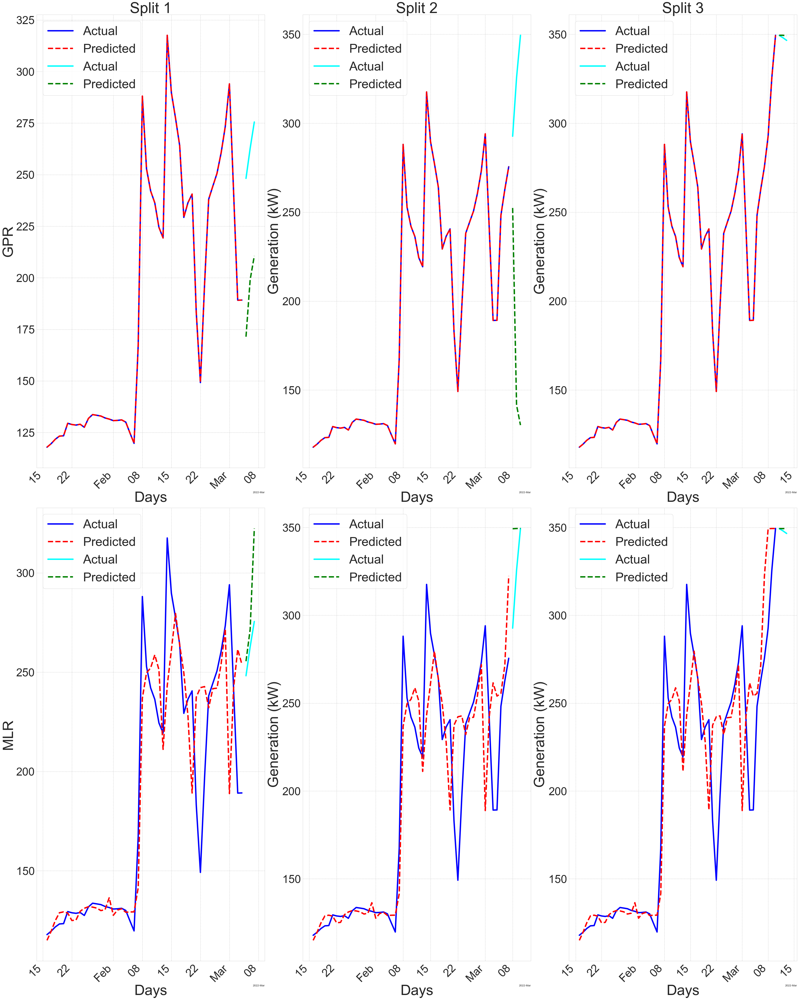

In [102]:
# Initialize the 9x5 grid of subplots
fig, axs = plt.subplots(2, 3, figsize=(40, 50))
models = ['GPR', 'MLR']

# Improve x-axis date formatting
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

tsp = TimeSeriesSplit(n_splits=3, test_size=3)

for fold_idx, (train_index, test_index) in enumerate(tsp.split(x_lag_rs_rslag)):

    x_train, x_test = x_lag_rs_rslag.iloc[train_index], x_lag_rs_rslag.iloc[test_index]
    y_train, y_test = y_lag_rs_rslag.iloc[train_index], y_lag_rs_rslag.iloc[test_index]

    # MLR
    y_pred_mlr_train = mlr_reg.predict(x_train).reshape(-1, 1)
    y_pred_mlr_test = mlr_reg.predict(x_test).reshape(-1, 1)

    # RFR
    rfr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_rfr_train = rfr.predict(x_train).reshape(-1, 1)
    y_pred_rfr_test = rfr.predict(x_test).reshape(-1, 1)

    # SVR
    svr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_svr_train = svr.predict(x_train).reshape(-1, 1)
    y_pred_svr_test = svr.predict(x_test).reshape(-1, 1)

    # K-NNR
    knn.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_knn_train = knn.predict(x_train).reshape(-1, 1)
    y_pred_knn_test = knn.predict(x_test).reshape(-1, 1)

    # GPR
    gpr.fit(x_train, y_train.values.flatten())
    y_pred_gpr_train = gpr.predict(x_train).reshape(-1, 1)
    y_pred_gpr_test = gpr.predict(x_test).reshape(-1, 1)

    # Lightgbm
    lgb_model.fit(x_train, y_train)
    y_pred_lgb_train = lgb_model.predict(x_train).reshape(-1, 1)
    y_pred_lgb_test = lgb_model.predict(x_test).reshape(-1, 1)

    # XGBoost
    xgb_model.fit(x_train, y_train)
    y_pred_xgb_train = xgb_model.predict(x_train).reshape(-1, 1)
    y_pred_xgb_test = xgb_model.predict(x_test).reshape(-1, 1)

    # ensemble
    y_pred_train_ensemble = (y_pred_mlr_train + y_pred_rfr_train + y_pred_svr_train + y_pred_knn_train + 
                             y_pred_gpr_train + y_pred_lgb_train + y_pred_xgb_train)/7
            
    y_pred_test_ensemble = (y_pred_mlr_test + y_pred_rfr_test + y_pred_svr_test + y_pred_knn_test +
                            y_pred_gpr_test + y_pred_lgb_test + y_pred_xgb_test)/7

    # Collect all model predictions for the current fold into a list
    all_preds_train = [y_pred_gpr_train, y_pred_mlr_train]

    all_preds_test = [y_pred_gpr_test, y_pred_mlr_test]

    # Loop over each model's prediction and plot on the respective row
    for model_idx, (pred_train, pred_test) in enumerate(zip(all_preds_train, all_preds_test)):
        pred_train_orig = reverse_transform(pred_train.reshape(-1, 1), scaler_kw, qt_kw)
        pred_test_orig = reverse_transform(pred_test.reshape(-1, 1), scaler_kw, qt_kw)

        y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
        y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

        # Plotting
        ax = axs[model_idx, fold_idx]
        ax.plot(x_train.index, y_train_orig, linewidth='5',color='blue', label='Actual')
        ax.plot(x_train.index, pred_train_orig, color='red',linewidth='5', linestyle='--', label='Predicted')
        ax.plot(x_test.index, y_test_orig, linewidth='5', color='cyan', label='Actual')
        ax.plot(x_test.index, pred_test_orig, color='green',linewidth='5', linestyle='--', label='Predicted')

        # Setting the date formatter and locator
        ax.xaxis.set_major_locator(locator)
        ax.xaxis.set_major_formatter(formatter)

        # Add xlabel and ylabel
        ax.set_xlabel('Days', fontsize=52)
        ax.set_ylabel('Generation (kW)', fontsize=52)

        # Only set the title for the top row and legend for the last row
        if fold_idx == 0:
            ax.set_ylabel(models[model_idx])
        if model_idx == 0:
            ax.set_title(f'Split {fold_idx + 1}')

        ax.legend()

# Adjustments for aesthetics
for ax in axs.ravel():
    # Adjust font sizes
    ax.tick_params(axis='both', which='major', labelsize=40)  # Adjust as needed
    ax.set_xlabel(ax.get_xlabel(), fontsize=52)
    ax.set_ylabel(ax.get_ylabel(), fontsize=52)
    ax.set_title(ax.get_title(), fontsize=54)
    
    # Rotate x-axis labels for clarity
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right")

    # Adjust legend fontsize
    ax.legend(fontsize=45)
    
    # Display grid
    ax.grid(True, which='both', linestyle='--', linewidth=1, alpha=1)

# Layout adjustments
plt.tight_layout()
plt.show()

# Hyperparameter Tuning

MLR with Hyperparameter Tuning

In [103]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []

train_mape_score = []
test_mape_score = []

for train_index, test_index in tsp.split(x_rs_o):
    x_train, x_test = x_rs_o.iloc[train_index], x_rs_o.iloc[test_index]
    y_train, y_test = y_rs_o.iloc[train_index], y_rs_o.iloc[test_index]

    mlr_reg = LinearRegression().fit(x_train, y_train)

    y_pred_train_transformed = mlr_reg.predict(x_train)
    y_pred_test_transformed = mlr_reg.predict(x_test)

    # Inverse transforming the predicted values
    y_pred_train = reverse_transform(y_pred_train_transformed.reshape(-1, 1), scaler_kw, qt_kw)
    y_pred_test = reverse_transform(y_pred_test_transformed.reshape(-1, 1), scaler_kw, qt_kw)

    # Inverse transforming the true y values
    y_train_original = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_original = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    # Calculating RMSE and MAPE
    RMSE_train = mean_squared_error(y_train_original, y_pred_train, squared=False)
    RMSE_test = mean_squared_error(y_test_original, y_pred_test, squared=False)
    MAPE_train = mean_absolute_percentage_error(y_train_original, y_pred_train)
    MAPE_test = mean_absolute_percentage_error(y_test_original, y_pred_test)

    train_rmse_scores.append(RMSE_train)
    test_rmse_scores.append(RMSE_test)

    train_mape_score.append(MAPE_train)
    test_mape_score.append(MAPE_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_score), np.mean(test_mape_score)))
print(test_rmse_scores)

Train RMSE: 28.3296127713821
Test RMSE: 18.16788032168288
Train MAPE: 0.0848250980326099
Test MAPE: 0.058666210332331374
[18.98464739034849, 34.10314237750975, 1.415851197190397]


RFR with Hyperparameter Tuning

In [104]:
from sklearn.model_selection import TimeSeriesSplit, ParameterGrid

# Grid for RFR
rfr_grid = {
    'n_estimators': [50, 100, 200, 300, 500],
    'max_features': ['sqrt', None, 0.5],
    'max_depth' : [4,6,8,10],
    'criterion' :['squared_error', 'absolute_error']
}
rfr_paramGrid = ParameterGrid(rfr_grid)

tsp = TimeSeriesSplit(n_splits=3)
best_params = None
best_rmse = float('inf')

for train_index, val_index in tsp.split(x_rs_o):
    x_train, x_val = x_rs_o.iloc[train_index], x_rs_o.iloc[val_index]
    y_train, y_val = y_rs_o.iloc[train_index], y_rs_o.iloc[val_index]

    for g in rfr_paramGrid:
        rfr = RandomForestRegressor(**g)
        rfr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
        p_val = rfr.predict(x_val).reshape(-1, 1)
        p_val_orig = reverse_transform(p_val, scaler_kw, qt_kw)
        y_val_orig = reverse_transform(y_val.values.reshape(-1, 1), scaler_kw, qt_kw)
        score_val = mean_squared_error(y_val_orig, p_val_orig, squared=False)

        if score_val < best_rmse:
            best_rmse = score_val
            best_params = g

tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []
train_rmse_scores_tuned = []
test_rmse_scores_tuned = []

train_mape_scores = []
test_mape_scores = []
train_mape_scores_tuned = []
test_mape_scores_tuned = []

# Loop over the splits
for train_index, test_index in tsp.split(x_rs_o):
    x_train, x_test = x_rs_o.iloc[train_index], x_rs_o.iloc[test_index]
    y_train, y_test = y_rs_o.iloc[train_index], y_rs_o.iloc[test_index]

    rfr_tuned = RandomForestRegressor(**best_params, random_state=42)
    rfr = RandomForestRegressor(random_state=42)
    rfr_tuned.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    rfr.fit(x_train, y_train.values.reshape(-1, 1).ravel())

    p_train_tuned = rfr_tuned.predict(x_train).reshape(-1, 1)
    p_test_tuned = rfr_tuned.predict(x_test).reshape(-1, 1)
    p_train = rfr.predict(x_train).reshape(-1, 1)
    p_test = rfr.predict(x_test).reshape(-1, 1)

    p_train_orig_tuned = reverse_transform(p_train_tuned, scaler_kw, qt_kw)
    p_test_orig_tuned = reverse_transform(p_test_tuned, scaler_kw, qt_kw)
    p_train_orig = reverse_transform(p_train, scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test, scaler_kw, qt_kw)
    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    train_rmse_scores.append(mean_squared_error(y_train_orig, p_train_orig, squared=False))
    test_rmse_scores.append(mean_squared_error(y_test_orig, p_test_orig, squared=False))
    train_rmse_scores_tuned.append(mean_squared_error(y_train_orig, p_train_orig_tuned, squared=False))
    test_rmse_scores_tuned.append(mean_squared_error(y_test_orig, p_test_orig_tuned, squared=False))

    train_mape_scores.append(mean_absolute_percentage_error(y_train_orig, p_train_orig))
    test_mape_scores.append(mean_absolute_percentage_error(y_test_orig, p_test_orig))
    train_mape_scores_tuned.append(mean_absolute_percentage_error(y_train_orig, p_train_orig_tuned))
    test_mape_scores_tuned.append(mean_absolute_percentage_error(y_test_orig, p_test_orig_tuned))


print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train RMSE Tuned: {}\nTest RMSE Tuned: {}".format(np.mean(train_rmse_scores_tuned), np.mean(test_rmse_scores_tuned)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print("Train MAPE Tuned: {}\nTest MAPE Tuned: {}".format(np.mean(train_mape_scores_tuned), np.mean(test_mape_scores_tuned)))

Train RMSE: 12.001624533602048
Test RMSE: 39.12268989214309
Train RMSE Tuned: 21.158663247268077
Test RMSE Tuned: 33.24963788073012
Train MAPE: 0.03239707735520277
Test MAPE: 0.1167545639700302
Train MAPE Tuned: 0.057109358534259545
Test MAPE Tuned: 0.09703638358957872


SVR with Hyperparameter Tuning

In [105]:
# Initialize SVR model
svr = SVR()

# Define a wider parameter space
param_distributions = {
    'kernel': ['rbf', 'linear', 'poly', 'sigmoid'], 
    'C': uniform(loc=500, scale=3000),
    'epsilon': uniform(loc=0.01, scale=0.3),
    'gamma': ['scale', 'auto'] + list(uniform(loc=0.001, scale=0.05).rvs(size=10))
}

# Set up the TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=3)

# Set up the RandomizedSearchCV
random_search = RandomizedSearchCV(svr, param_distributions=param_distributions, 
                                   n_iter=1000, scoring='neg_root_mean_squared_error', 
                                   n_jobs=-1, cv=tscv, random_state=42)

# Fit the RandomizedSearchCV to the data
random_search.fit(x_rs_o, y_rs_o.values.flatten())

# Print the best parameters and the corresponding RMSE
print('Best Hyperparameters: ', random_search.best_params_)
print('Best Validation RMSE: ', -1*random_search.best_score_)

# Fit the best estimator on the entire training data and predict on training data
best_svr = random_search.best_estimator_

tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []
train_rmse_scores_tuned = []
test_rmse_scores_tuned = []

train_mape_scores = []
test_mape_scores = []
train_mape_scores_tuned = []
test_mape_scores_tuned = []

# Loop over the splits
for train_index, test_index in tsp.split(x_rs_o):
    x_train, x_test = x_rs_o.iloc[train_index], x_rs_o.iloc[test_index]
    y_train, y_test = y_rs_o.iloc[train_index], y_rs_o.iloc[test_index]

    best_svr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    svr.fit(x_train, y_train.values.reshape(-1, 1).ravel())

    p_train_tuned = best_svr.predict(x_train).reshape(-1, 1)
    p_test_tuned = best_svr.predict(x_test).reshape(-1, 1)
    p_train = svr.predict(x_train).reshape(-1, 1)
    p_test = svr.predict(x_test).reshape(-1, 1)

    p_train_orig_tuned = reverse_transform(p_train_tuned, scaler_kw, qt_kw)
    p_test_orig_tuned = reverse_transform(p_test_tuned, scaler_kw, qt_kw)
    p_train_orig = reverse_transform(p_train, scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test, scaler_kw, qt_kw)
    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    train_rmse_scores.append(mean_squared_error(y_train_orig, p_train_orig, squared=False))
    test_rmse_scores.append(mean_squared_error(y_test_orig, p_test_orig, squared=False))
    train_rmse_scores_tuned.append(mean_squared_error(y_train_orig, p_train_orig_tuned, squared=False))
    test_rmse_scores_tuned.append(mean_squared_error(y_test_orig, p_test_orig_tuned, squared=False))

    train_mape_scores.append(mean_absolute_percentage_error(y_train_orig, p_train_orig))
    test_mape_scores.append(mean_absolute_percentage_error(y_test_orig, p_test_orig))
    train_mape_scores_tuned.append(mean_absolute_percentage_error(y_train_orig, p_train_orig_tuned))
    test_mape_scores_tuned.append(mean_absolute_percentage_error(y_test_orig, p_test_orig_tuned))

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train RMSE Tuned: {}\nTest RMSE Tuned: {}".format(np.mean(train_rmse_scores_tuned), np.mean(test_rmse_scores_tuned)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print("Train MAPE Tuned: {}\nTest MAPE Tuned: {}".format(np.mean(train_mape_scores_tuned), np.mean(test_mape_scores_tuned)))

Best Hyperparameters:  {'C': 2816.037428929971, 'epsilon': 0.018150226367667943, 'gamma': 0.0021907048021494674, 'kernel': 'sigmoid'}
Best Validation RMSE:  0.07393684413472464
Train RMSE: 44.919317084851365
Test RMSE: 35.534508217234766
Train RMSE Tuned: 30.83416991960407
Test RMSE Tuned: 33.33369979313039
Train MAPE: 0.13668525859756378
Test MAPE: 0.09579120597760186
Train MAPE Tuned: 0.08595494488998152
Test MAPE Tuned: 0.09296540302578842


KNN-R with Hyperparameter Tuning

In [106]:
# Define the parameter values that should be searched
k_range = list(range(1, 30))

# Create a parameter grid: map the parameter names to the values that should be searched
param_grid = dict(n_neighbors=k_range)

# Instantiate the grid
knn = KNeighborsRegressor()

# For time series cross-validation, use TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=3)
grid = GridSearchCV(knn, param_grid, cv=tscv, scoring='neg_root_mean_squared_error')

# Fit the grid with data
grid.fit(x_rs_o, y_rs_o.values.flatten())

# View the best parameters
print("Best parameters: ", grid.best_params_)

best_knn = KNeighborsRegressor(**grid.best_params_)

tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []
train_rmse_scores_tuned = []
test_rmse_scores_tuned = []

train_mape_scores = []
test_mape_scores = []
train_mape_scores_tuned = []
test_mape_scores_tuned = []

# Loop over the splits
for train_index, test_index in tsp.split(x_rs_o):
    x_train, x_test = x_rs_o.iloc[train_index], x_rs_o.iloc[test_index]
    y_train, y_test = y_rs_o.iloc[train_index], y_rs_o.iloc[test_index]

    best_knn.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    knn.fit(x_train, y_train.values.reshape(-1, 1).ravel())

    p_train_tuned = best_knn.predict(x_train).reshape(-1, 1)
    p_test_tuned = best_knn.predict(x_test).reshape(-1, 1)
    p_train = knn.predict(x_train).reshape(-1, 1)
    p_test = knn.predict(x_test).reshape(-1, 1)

    p_train_orig_tuned = reverse_transform(p_train_tuned, scaler_kw, qt_kw)
    p_test_orig_tuned = reverse_transform(p_test_tuned, scaler_kw, qt_kw)
    p_train_orig = reverse_transform(p_train, scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test, scaler_kw, qt_kw)
    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    train_rmse_scores.append(mean_squared_error(y_train_orig, p_train_orig, squared=False))
    test_rmse_scores.append(mean_squared_error(y_test_orig, p_test_orig, squared=False))
    train_rmse_scores_tuned.append(mean_squared_error(y_train_orig, p_train_orig_tuned, squared=False))
    test_rmse_scores_tuned.append(mean_squared_error(y_test_orig, p_test_orig_tuned, squared=False))

    train_mape_scores.append(mean_absolute_percentage_error(y_train_orig, p_train_orig))
    test_mape_scores.append(mean_absolute_percentage_error(y_test_orig, p_test_orig))
    train_mape_scores_tuned.append(mean_absolute_percentage_error(y_train_orig, p_train_orig_tuned))
    test_mape_scores_tuned.append(mean_absolute_percentage_error(y_test_orig, p_test_orig_tuned))

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train RMSE Tuned: {}\nTest RMSE Tuned: {}".format(np.mean(train_rmse_scores_tuned), np.mean(test_rmse_scores_tuned)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print("Train MAPE Tuned: {}\nTest MAPE Tuned: {}".format(np.mean(train_mape_scores_tuned), np.mean(test_mape_scores_tuned)))

Best parameters:  {'n_neighbors': 6}
Train RMSE: 28.153892758602854
Test RMSE: 40.745929903036284
Train RMSE Tuned: 32.67835184691683
Test RMSE Tuned: 43.58744745672141
Train MAPE: 0.07675196179484822
Test MAPE: 0.11442049070114786
Train MAPE Tuned: 0.09394362234754162
Test MAPE Tuned: 0.11882087647383978


GPR with Hyperparameter Tuning

In [107]:
# Define the parameter space
param_distributions = {
    'kernel': [RBF(), Matern(), DotProduct(), WhiteKernel()],
    'alpha': uniform(loc=0, scale=2),
    'n_restarts_optimizer': range(0, 10)
}

# Initialize GaussianProcessRegressor
gpr = GaussianProcessRegressor()

tscv = TimeSeriesSplit(n_splits=3)
# Set up the RandomizedSearchCV
random_search_gpr = RandomizedSearchCV(gpr, param_distributions=param_distributions, 
                                       n_iter=300, scoring='neg_root_mean_squared_error', 
                                       n_jobs=-1, cv=tscv, random_state=1)

# Fit the RandomizedSearchCV to the data
random_search_gpr.fit(x_rs_o, y_rs_o.values.flatten())

# Print the best parameters and the corresponding RMSE
print('Best Hyperparameters: ', random_search_gpr.best_params_)
print('Best RMSE: ', -1*random_search_gpr.best_score_ )  # RMSE is the square root of MSE

best_gpr = random_search_gpr.best_estimator_

tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []
train_rmse_scores_tuned = []
test_rmse_scores_tuned = []

train_mape_scores = []
test_mape_scores = []
train_mape_scores_tuned = []
test_mape_scores_tuned = []

# Loop over the splits
for fold_idx, (train_index, test_index) in enumerate(tsp.split(x_rs_o)):
    x_train, x_test = x_rs_o.iloc[train_index], x_rs_o.iloc[test_index]
    y_train, y_test = y_rs_o.iloc[train_index], y_rs_o.iloc[test_index]

    best_gpr.fit(x_train, y_train.values.flatten())
    gpr.fit(x_train, y_train.values.flatten())

    p_train_tuned = best_gpr.predict(x_train).reshape(-1, 1)
    p_test_tuned = best_gpr.predict(x_test).reshape(-1, 1)
    p_train = gpr.predict(x_train).reshape(-1, 1)
    p_test = gpr.predict(x_test).reshape(-1, 1)

    p_train_orig_tuned = reverse_transform(p_train_tuned, scaler_kw, qt_kw)
    p_test_orig_tuned = reverse_transform(p_test_tuned, scaler_kw, qt_kw)
    p_train_orig = reverse_transform(p_train, scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test, scaler_kw, qt_kw)
    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    train_rmse_scores.append(mean_squared_error(y_train_orig, p_train_orig, squared=False))
    test_rmse_scores.append(mean_squared_error(y_test_orig, p_test_orig, squared=False))
    train_rmse_scores_tuned.append(mean_squared_error(y_train_orig, p_train_orig_tuned, squared=False))
    test_rmse_scores_tuned.append(mean_squared_error(y_test_orig, p_test_orig_tuned, squared=False))

    train_mape_scores.append(mean_absolute_percentage_error(y_train_orig, p_train_orig))
    test_mape_scores.append(mean_absolute_percentage_error(y_test_orig, p_test_orig))
    train_mape_scores_tuned.append(mean_absolute_percentage_error(y_train_orig, p_train_orig_tuned))
    test_mape_scores_tuned.append(mean_absolute_percentage_error(y_test_orig, p_test_orig_tuned))

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train RMSE Tuned: {}\nTest RMSE Tuned: {}".format(np.mean(train_rmse_scores_tuned), np.mean(test_rmse_scores_tuned)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print("Train MAPE Tuned: {}\nTest MAPE Tuned: {}".format(np.mean(train_mape_scores_tuned), np.mean(test_mape_scores_tuned)))

Best Hyperparameters:  {'alpha': 0.007587344818685171, 'kernel': Matern(length_scale=1, nu=1.5), 'n_restarts_optimizer': 6}
Best RMSE:  0.10204806509465225
Train RMSE: 1.0932741196058304e-06
Test RMSE: 48.936696542559986
Train RMSE Tuned: 32.82391476452778
Test RMSE Tuned: 18.371722014897852
Train MAPE: 2.1605414853726903e-09
Test MAPE: 0.13480571149094536
Train MAPE Tuned: 0.09071210398540268
Test MAPE Tuned: 0.04526968444226146


LightGBM with Hyperparameter Tuning 

In [108]:
from lightgbm import LGBMRegressor

def objective(trial, X, y):
    param_grid = {
        "objective": "regression",
        "metric": "rmse",
        "boosting_type": "gbdt",
        "learning_rate": trial.suggest_float("learning_rate", 0.001, 0.1),
        "num_leaves": trial.suggest_int("num_leaves", 2, 20),
        "max_depth": trial.suggest_int("max_depth", 2, 4),
        "lambda_l1": trial.suggest_loguniform("lambda_l1", 1e-8, 10.0),
        "lambda_l2": trial.suggest_loguniform("lambda_l2", 1e-8, 10.0),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 5, 30),
        "feature_fraction": trial.suggest_float("feature_fraction", 0.1, 0.9),
        "bagging_fraction": trial.suggest_float("bagging_fraction", 0.1, 0.9),
        "bagging_freq": trial.suggest_int("bagging_freq", 1, 10),
        "min_child_samples": trial.suggest_int("min_child_samples", 5, 20),
    }

    cv = TimeSeriesSplit(n_splits=3)

    rmse_scores = []

    for train_index, valid_index in cv.split(X):
        X_tr, X_val = X.iloc[train_index], X.iloc[valid_index]
        y_tr, y_val = y.iloc[train_index], y.iloc[valid_index]

        lgb_model = LGBMRegressor(**param_grid)
        lgb_model.fit(X_tr, y_tr)

        predictions = lgb_model.predict(X_val)
        rmse = mean_squared_error(y_val, predictions, squared=False)
        rmse_scores.append(rmse)

    return np.mean(rmse_scores)

study = optuna.create_study(direction='minimize')
study.optimize(lambda trial: objective(trial, x_rs_o, y_rs_o), n_trials=100, n_jobs=-1)

# Get the best parameters:
best_params = study.best_params.copy()
print(best_params)

lgb_model_tuned = LGBMRegressor(**best_params)
lgb_model = LGBMRegressor()

tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []
train_rmse_scores_tuned = []
test_rmse_scores_tuned = []

train_mape_scores = []
test_mape_scores = []
train_mape_scores_tuned = []
test_mape_scores_tuned = []

for train_index, test_index in tsp.split(x_rs_o):
    x_train, x_test = x_rs_o.iloc[train_index], x_rs_o.iloc[test_index]
    y_train, y_test = y_rs_o.iloc[train_index], y_rs_o.iloc[test_index]

    lgb_model_tuned.fit(x_train, y_train)
    lgb_model.fit(x_train, y_train)

    p_train_tuned = lgb_model_tuned.predict(x_train).reshape(-1, 1)
    p_test_tuned = lgb_model_tuned.predict(x_test).reshape(-1, 1)
    p_train = lgb_model.predict(x_train).reshape(-1, 1)
    p_test = lgb_model.predict(x_test).reshape(-1, 1)

    p_train_orig_tuned = reverse_transform(p_train_tuned, scaler_kw, qt_kw)
    p_test_orig_tuned = reverse_transform(p_test_tuned, scaler_kw, qt_kw)
    p_train_orig = reverse_transform(p_train, scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test, scaler_kw, qt_kw)
    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    train_rmse_scores.append(mean_squared_error(y_train_orig, p_train_orig, squared=False))
    test_rmse_scores.append(mean_squared_error(y_test_orig, p_test_orig, squared=False))
    train_rmse_scores_tuned.append(mean_squared_error(y_train_orig, p_train_orig_tuned, squared=False))
    test_rmse_scores_tuned.append(mean_squared_error(y_test_orig, p_test_orig_tuned, squared=False))

    train_mape_scores.append(mean_absolute_percentage_error(y_train_orig, p_train_orig))
    test_mape_scores.append(mean_absolute_percentage_error(y_test_orig, p_test_orig))
    train_mape_scores_tuned.append(mean_absolute_percentage_error(y_train_orig, p_train_orig_tuned))
    test_mape_scores_tuned.append(mean_absolute_percentage_error(y_test_orig, p_test_orig_tuned))


print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train RMSE Tuned: {}\nTest RMSE Tuned: {}".format(np.mean(train_rmse_scores_tuned), np.mean(test_rmse_scores_tuned)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print("Train MAPE Tuned: {}\nTest MAPE Tuned: {}".format(np.mean(train_mape_scores_tuned), np.mean(test_mape_scores_tuned)))

[I 2023-09-01 13:46:46,391] A new study created in memory with name: no-name-284bf276-aeb2-40e1-8af2-ac8d6e6efd47
[I 2023-09-01 13:46:48,747] Trial 1 finished with value: 0.14823473145437258 and parameters: {'learning_rate': 0.05544675986585933, 'num_leaves': 17, 'max_depth': 3, 'lambda_l1': 1.221243542372009e-07, 'lambda_l2': 1.9912783797830086e-06, 'min_data_in_leaf': 27, 'feature_fraction': 0.4728301061866136, 'bagging_fraction': 0.21433201171697497, 'bagging_freq': 7, 'min_child_samples': 11}. Best is trial 1 with value: 0.14823473145437258.
[I 2023-09-01 13:46:49,096] Trial 13 finished with value: 0.1304958962924547 and parameters: {'learning_rate': 0.09219895408795341, 'num_leaves': 15, 'max_depth': 3, 'lambda_l1': 3.138052727824882e-08, 'lambda_l2': 0.0023967165362918474, 'min_data_in_leaf': 16, 'feature_fraction': 0.8053181287455143, 'bagging_fraction': 0.8481389311502483, 'bagging_freq': 6, 'min_child_samples': 5}. Best is trial 13 with value: 0.1304958962924547.
[I 2023-09-01

{'learning_rate': 0.09968437924598254, 'num_leaves': 14, 'max_depth': 3, 'lambda_l1': 3.6932217135772515e-05, 'lambda_l2': 9.20341528361117, 'min_data_in_leaf': 5, 'feature_fraction': 0.1605904725017443, 'bagging_fraction': 0.8981254745169349, 'bagging_freq': 4, 'min_child_samples': 15}
[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5
[LightGBM] [Warning] feature_fraction is set=0.1605904725017443, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1605904725017443
[LightGBM] [Warning] lambda_l1 is set=3.6932217135772515e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6932217135772515e-05
[LightGBM] [Warning] lambda_l2 is set=9.20341528361117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.20341528361117
[LightGBM] [Warning] bagging_fraction is set=0.8981254745169349, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8981254745169349
[LightGBM] [Warning]

<Axes: title={'center': 'Feature importance'}, xlabel='Feature importance', ylabel='Features'>

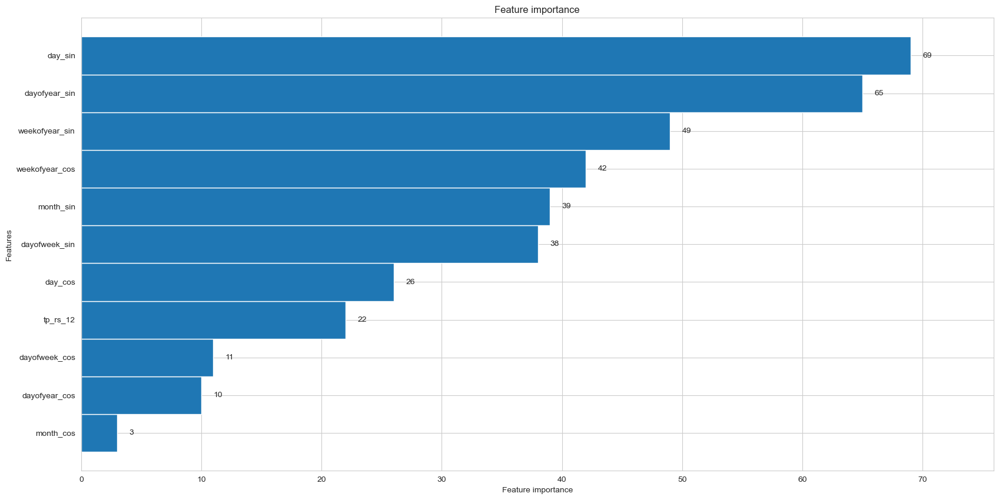

In [109]:
lgb.plot_importance(lgb_model_tuned, height = 1, figsize=(20,10))

XGBoost with Hyperparameter Tuning 

In [110]:
def objective(trial, X, y):
    param_grid = {
        "objective": "reg:squarederror",  # Objective for XGBoost
        "eval_metric": "rmse",  # Evaluation metric for XGBoost
        "verbosity": 0,
        "booster": "gbtree",  # Boosting type for XGBoost
        "learning_rate": trial.suggest_float("learning_rate", 0.001, 0.2),
        "max_depth": trial.suggest_int("max_depth", 2, 20),
        "min_child_weight": trial.suggest_int("min_child_weight", 2, 100),
        "subsample": trial.suggest_float("subsample", 0.5, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
    }

    cv = TimeSeriesSplit(n_splits=3)

    rmse_scores = []

    for train_index, valid_index in cv.split(X):
        X_tr, X_val = X.iloc[train_index], X.iloc[valid_index]
        y_tr, y_val = y.iloc[train_index], y.iloc[valid_index]

        xgb_model = xgb.XGBRegressor(**param_grid)  # Pass the param_grid as **kwargs

        xgb_model.fit(
            X_tr, y_tr,
            eval_set=[(X_tr, y_tr), (X_val, y_val)],
            early_stopping_rounds=30,
            verbose=False
        )

        predictions = xgb_model.predict(X_val)
        rmse = mean_squared_error(y_val, predictions, squared=False)
        rmse_scores.append(rmse)

    return np.mean(rmse_scores)

study = optuna.create_study(direction='minimize')
study.optimize(lambda trial: objective(trial, x_rs_o, y_rs_o), n_trials=100)

# Get the best parameters:
best_params = study.best_params.copy()
print(best_params)

xgb_model_tuned = xgb.XGBRegressor(**best_params)  # Pass the best_params as **kwargs
xgb_model = xgb.XGBRegressor()

tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []
train_rmse_scores_tuned = []
test_rmse_scores_tuned = []

train_mape_scores = []
test_mape_scores = []
train_mape_scores_tuned = []
test_mape_scores_tuned = []

for train_index, test_index in tsp.split(x_rs_o):
    x_train, x_test = x_rs_o.iloc[train_index], x_rs_o.iloc[test_index]
    y_train, y_test = y_rs_o.iloc[train_index], y_rs_o.iloc[test_index]

    xgb_model_tuned.fit(
        x_train, y_train,
        eval_set=[(x_train, y_train), (x_test, y_test)],
        early_stopping_rounds=30,
        verbose=False
    )

    xgb_model.fit(
        x_train, y_train,
        eval_set=[(x_train, y_train), (x_test, y_test)],
        early_stopping_rounds=30,
        verbose=False
    )

    p_train_tuned = xgb_model_tuned.predict(x_train).reshape(-1, 1)
    p_test_tuned = xgb_model_tuned.predict(x_test).reshape(-1, 1)
    p_train = xgb_model.predict(x_train).reshape(-1, 1)
    p_test = xgb_model.predict(x_test).reshape(-1, 1)

    p_train_orig_tuned = reverse_transform(p_train_tuned, scaler_kw, qt_kw)
    p_test_orig_tuned = reverse_transform(p_test_tuned, scaler_kw, qt_kw)
    p_train_orig = reverse_transform(p_train, scaler_kw, qt_kw)
    p_test_orig = reverse_transform(p_test, scaler_kw, qt_kw)
    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    train_rmse_scores.append(mean_squared_error(y_train_orig, p_train_orig, squared=False))
    test_rmse_scores.append(mean_squared_error(y_test_orig, p_test_orig, squared=False))
    train_rmse_scores_tuned.append(mean_squared_error(y_train_orig, p_train_orig_tuned, squared=False))
    test_rmse_scores_tuned.append(mean_squared_error(y_test_orig, p_test_orig_tuned, squared=False))

    train_mape_scores.append(mean_absolute_percentage_error(y_train_orig, p_train_orig))
    test_mape_scores.append(mean_absolute_percentage_error(y_test_orig, p_test_orig))
    train_mape_scores_tuned.append(mean_absolute_percentage_error(y_train_orig, p_train_orig_tuned))
    test_mape_scores_tuned.append(mean_absolute_percentage_error(y_test_orig, p_test_orig_tuned))

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train RMSE Tuned: {}\nTest RMSE Tuned: {}".format(np.mean(train_rmse_scores_tuned), np.mean(test_rmse_scores_tuned)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print("Train MAPE Tuned: {}\nTest MAPE Tuned: {}".format(np.mean(train_mape_scores_tuned), np.mean(test_mape_scores_tuned)))

[I 2023-09-01 13:47:10,531] A new study created in memory with name: no-name-7fa1d11b-74bb-4881-a8ca-9e3a2cf7e748
[I 2023-09-01 13:47:10,655] Trial 0 finished with value: 0.09586631089950826 and parameters: {'learning_rate': 0.14880741752319257, 'max_depth': 18, 'min_child_weight': 81, 'subsample': 0.6221161946459486, 'colsample_bytree': 0.6498699385081261}. Best is trial 0 with value: 0.09586631089950826.
[I 2023-09-01 13:47:10,801] Trial 1 finished with value: 0.09319521029695761 and parameters: {'learning_rate': 0.15392551850628386, 'max_depth': 11, 'min_child_weight': 7, 'subsample': 0.9841483226162107, 'colsample_bytree': 0.8429316490102725}. Best is trial 1 with value: 0.09319521029695761.
[I 2023-09-01 13:47:10,920] Trial 2 finished with value: 0.09390641717559307 and parameters: {'learning_rate': 0.12562514621605064, 'max_depth': 10, 'min_child_weight': 6, 'subsample': 0.8080207970605471, 'colsample_bytree': 0.8474577039007458}. Best is trial 1 with value: 0.09319521029695761.


{'learning_rate': 0.025997003599105173, 'max_depth': 6, 'min_child_weight': 5, 'subsample': 0.9869498447913956, 'colsample_bytree': 0.8028340361001811}
Train RMSE: 7.3894853658284765
Test RMSE: 39.30145788044372
Train RMSE Tuned: 15.278200539782333
Test RMSE Tuned: 42.80507580341177
Train MAPE: 0.024414640864886206
Test MAPE: 0.1222627503430768
Train MAPE Tuned: 0.04012409895797998
Test MAPE Tuned: 0.12810675860511156


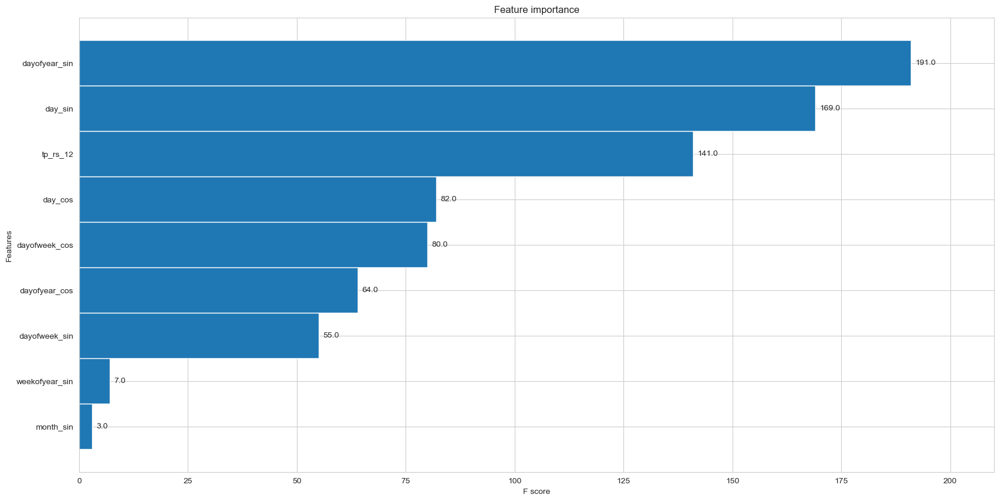

In [111]:
fig, ax = plt.subplots(figsize=(20, 10))
xgb.plot_importance(xgb_model_tuned, height=1, ax=ax)
plt.show()

Ensemble with Hyperparameter Tuning

In [112]:
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

train_rmse_scores = []
test_rmse_scores = []
train_rmse_scores_tuned = []
test_rmse_scores_tuned = []

train_mape_scores = []
test_mape_scores = []
train_mape_scores_tuned = []
test_mape_scores_tuned = []


for train_index, test_index in tsp.split(x_rs_o):
    x_train, x_test = x_rs_o.iloc[train_index], x_rs_o.iloc[test_index]
    y_train, y_test = y_rs_o.iloc[train_index], y_rs_o.iloc[test_index]

    # MLR
    y_pred_mlr_train = mlr_reg.predict(x_train).reshape(-1, 1)
    y_pred_mlr_test = mlr_reg.predict(x_test).reshape(-1, 1)

    # RFR
    rfr_tuned.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    rfr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_rfr_train_tuned = rfr_tuned.predict(x_train).reshape(-1, 1)
    y_pred_rfr_test_tuned = rfr_tuned.predict(x_test).reshape(-1, 1)
    y_pred_rfr_train = rfr.predict(x_train).reshape(-1, 1)
    y_pred_rfr_test = rfr.predict(x_test).reshape(-1, 1)

    # SVR
    best_svr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    svr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_svr_train_tuned = best_svr.predict(x_train).reshape(-1, 1)
    y_pred_svr_test_tuned = best_svr.predict(x_test).reshape(-1, 1)    
    y_pred_svr_train = svr.predict(x_train).reshape(-1, 1)
    y_pred_svr_test = svr.predict(x_test).reshape(-1, 1)

    # K-NNR
    best_knn.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    knn.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_knn_train_tuned = best_knn.predict(x_train).reshape(-1, 1)
    y_pred_knn_test_tuned = best_knn.predict(x_test).reshape(-1, 1)    
    y_pred_knn_train = knn.predict(x_train).reshape(-1, 1)
    y_pred_knn_test = knn.predict(x_test).reshape(-1, 1)

    # GPR
    best_gpr.fit(x_train, y_train.values.flatten())
    gpr.fit(x_train, y_train.values.flatten())
    y_pred_gpr_train_tuned = best_gpr.predict(x_train).reshape(-1, 1)
    y_pred_gpr_test_tuned = best_gpr.predict(x_test).reshape(-1, 1)    
    y_pred_gpr_train = gpr.predict(x_train).reshape(-1, 1)
    y_pred_gpr_test = gpr.predict(x_test).reshape(-1, 1)

    # Lightgbm
    lgb_model_tuned.fit(x_train, y_train)
    lgb_model.fit(x_train, y_train)
    y_pred_lgb_train_tuned = lgb_model_tuned.predict(x_train).reshape(-1, 1)
    y_pred_lgb_test_tuned = lgb_model_tuned.predict(x_test).reshape(-1, 1)
    y_pred_lgb_train = lgb_model.predict(x_train).reshape(-1, 1)
    y_pred_lgb_test = lgb_model.predict(x_test).reshape(-1, 1)

    # XGBoost
    xgb_model_tuned.fit(x_train, y_train, eval_set=[(x_train, y_train), (x_test, y_test)], early_stopping_rounds=30, verbose=False)
    xgb_model.fit(x_train, y_train, eval_set=[(x_train, y_train), (x_test, y_test)], early_stopping_rounds=30, verbose=False)
    y_pred_xgb_train_tuned = xgb_model_tuned.predict(x_train).reshape(-1, 1)
    y_pred_xgb_test_tuned = xgb_model_tuned.predict(x_test).reshape(-1, 1)    
    y_pred_xgb_train = xgb_model.predict(x_train).reshape(-1, 1)
    y_pred_xgb_test = xgb_model.predict(x_test).reshape(-1, 1)

    # ensemble
    y_pred_train_ensemble_tuned = (y_pred_mlr_train + y_pred_rfr_train + y_pred_svr_train_tuned + y_pred_knn_train_tuned + 
                             y_pred_gpr_train_tuned + y_pred_lgb_train_tuned + y_pred_xgb_train_tuned)/7
    
    y_pred_test_ensemble_tuned = (y_pred_mlr_test + y_pred_rfr_test_tuned + y_pred_svr_test_tuned + y_pred_knn_test_tuned +
                            y_pred_gpr_test_tuned + y_pred_lgb_test_tuned + y_pred_xgb_test_tuned)/7

    y_pred_train_ensemble = (y_pred_mlr_train + y_pred_rfr_train + y_pred_svr_train + y_pred_knn_train + 
                             y_pred_gpr_train + y_pred_lgb_train + y_pred_xgb_train)/7
    
    y_pred_test_ensemble = (y_pred_mlr_test + y_pred_rfr_test + y_pred_svr_test + y_pred_knn_test +
                            y_pred_gpr_test + y_pred_lgb_test + y_pred_xgb_test)/7
    
    pred_train_orig_tuned = reverse_transform(y_pred_train_ensemble_tuned.reshape(-1, 1), scaler_kw, qt_kw)
    pred_test_orig_tuned = reverse_transform(y_pred_test_ensemble_tuned.reshape(-1, 1), scaler_kw, qt_kw)    

    pred_train_orig = reverse_transform(y_pred_train_ensemble.reshape(-1, 1), scaler_kw, qt_kw)
    pred_test_orig = reverse_transform(y_pred_test_ensemble.reshape(-1, 1), scaler_kw, qt_kw)

    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    rmse_train_tuned = mean_squared_error(y_train_orig, pred_train_orig_tuned, squared=False)
    rmse_test_tuned = mean_squared_error(y_test_orig, pred_test_orig_tuned, squared=False)
    rmse_train = mean_squared_error(y_train_orig, pred_train_orig, squared=False)
    rmse_test = mean_squared_error(y_test_orig, pred_test_orig, squared=False)

    mape_train_tuned = mean_absolute_percentage_error(y_train_orig, pred_train_orig_tuned)
    mape_test_tuned = mean_absolute_percentage_error(y_test_orig, pred_test_orig_tuned)
    mape_train = mean_absolute_percentage_error(y_train_orig, pred_train_orig)
    mape_test = mean_absolute_percentage_error(y_test_orig, pred_test_orig)

    train_rmse_scores_tuned.append(rmse_train_tuned)
    test_rmse_scores_tuned.append(rmse_test_tuned)
    train_rmse_scores.append(rmse_train)
    test_rmse_scores.append(rmse_test)

    train_mape_scores_tuned.append(mape_train_tuned)
    test_mape_scores_tuned.append(mape_test_tuned)
    train_mape_scores.append(mape_train)
    test_mape_scores.append(mape_test)

print("Train RMSE: {}\nTest RMSE: {}".format(np.mean(train_rmse_scores), np.mean(test_rmse_scores)))
print("Train RMSE Tuned: {}\nTest RMSE Tuned: {}".format(np.mean(train_rmse_scores_tuned), np.mean(test_rmse_scores_tuned)))
print("Train MAPE: {}\nTest MAPE: {}".format(np.mean(train_mape_scores), np.mean(test_mape_scores)))
print("Train MAPE Tuned: {}\nTest MAPE Tuned: {}".format(np.mean(train_mape_scores_tuned), np.mean(test_mape_scores_tuned)))

[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5
[LightGBM] [Warning] feature_fraction is set=0.1605904725017443, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1605904725017443
[LightGBM] [Warning] lambda_l1 is set=3.6932217135772515e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6932217135772515e-05
[LightGBM] [Warning] lambda_l2 is set=9.20341528361117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.20341528361117
[LightGBM] [Warning] bagging_fraction is set=0.8981254745169349, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8981254745169349
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5
[LightGBM] [Warning] feature_fraction is set=0.1605904725017443, colsample_bytre

Plotting

[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5
[LightGBM] [Warning] feature_fraction is set=0.1605904725017443, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.1605904725017443
[LightGBM] [Warning] lambda_l1 is set=3.6932217135772515e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6932217135772515e-05
[LightGBM] [Warning] lambda_l2 is set=9.20341528361117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.20341528361117
[LightGBM] [Warning] bagging_fraction is set=0.8981254745169349, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8981254745169349
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] min_data_in_leaf is set=5, min_child_samples=15 will be ignored. Current value: min_data_in_leaf=5
[LightGBM] [Warning] feature_fraction is set=0.1605904725017443, colsample_bytre

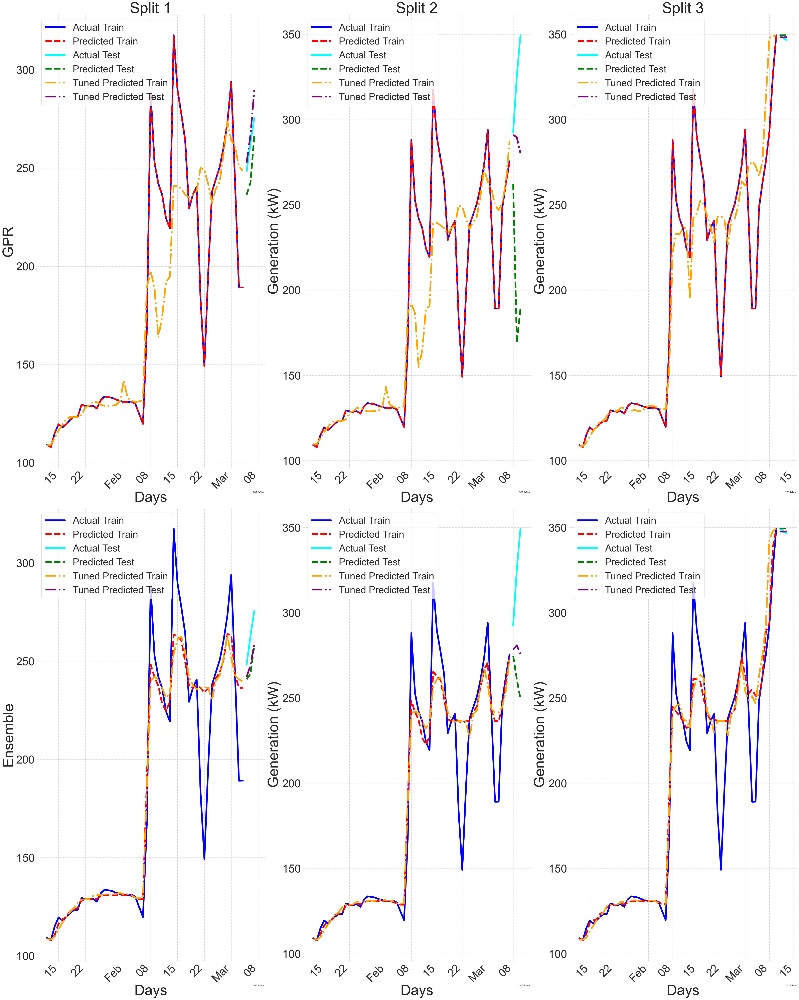

In [113]:
# Initialize the 9x5 grid of subplots
fig, axs = plt.subplots(2, 3, figsize=(40, 50))
models = ['GPR', 'Ensemble']

# Improve x-axis date formatting
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

tsp = TimeSeriesSplit(n_splits=3, test_size=3)

for fold_idx, (train_index, test_index) in enumerate(tsp.split(x_rs_o)):

    x_train, x_test = x_rs_o.iloc[train_index], x_rs_o.iloc[test_index]
    y_train, y_test = y_rs_o.iloc[train_index], y_rs_o.iloc[test_index]

    # MLR
    y_pred_mlr_train = mlr_reg.predict(x_train).reshape(-1, 1)
    y_pred_mlr_test = mlr_reg.predict(x_test).reshape(-1, 1)

    # RFR
    rfr_tuned.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    rfr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_rfr_train_tuned = rfr_tuned.predict(x_train).reshape(-1, 1)
    y_pred_rfr_test_tuned = rfr_tuned.predict(x_test).reshape(-1, 1)
    y_pred_rfr_train = rfr.predict(x_train).reshape(-1, 1)
    y_pred_rfr_test = rfr.predict(x_test).reshape(-1, 1)

    # SVR
    best_svr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    svr.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_svr_train_tuned = best_svr.predict(x_train).reshape(-1, 1)
    y_pred_svr_test_tuned = best_svr.predict(x_test).reshape(-1, 1)    
    y_pred_svr_train = svr.predict(x_train).reshape(-1, 1)
    y_pred_svr_test = svr.predict(x_test).reshape(-1, 1)

    # K-NNR
    best_knn.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    knn.fit(x_train, y_train.values.reshape(-1, 1).ravel())
    y_pred_knn_train_tuned = best_knn.predict(x_train).reshape(-1, 1)
    y_pred_knn_test_tuned = best_knn.predict(x_test).reshape(-1, 1)    
    y_pred_knn_train = knn.predict(x_train).reshape(-1, 1)
    y_pred_knn_test = knn.predict(x_test).reshape(-1, 1)

    # GPR
    best_gpr.fit(x_train, y_train.values.flatten())
    gpr.fit(x_train, y_train.values.flatten())
    y_pred_gpr_train_tuned = best_gpr.predict(x_train).reshape(-1, 1)
    y_pred_gpr_test_tuned = best_gpr.predict(x_test).reshape(-1, 1)    
    y_pred_gpr_train = gpr.predict(x_train).reshape(-1, 1)
    y_pred_gpr_test = gpr.predict(x_test).reshape(-1, 1)

    # Lightgbm
    lgb_model_tuned.fit(x_train, y_train)
    lgb_model.fit(x_train, y_train)
    y_pred_lgb_train_tuned = lgb_model_tuned.predict(x_train).reshape(-1, 1)
    y_pred_lgb_test_tuned = lgb_model_tuned.predict(x_test).reshape(-1, 1)
    y_pred_lgb_train = lgb_model.predict(x_train).reshape(-1, 1)
    y_pred_lgb_test = lgb_model.predict(x_test).reshape(-1, 1)

    # XGBoost
    xgb_model_tuned.fit(x_train, y_train, eval_set=[(x_train, y_train), (x_test, y_test)], early_stopping_rounds=30, verbose=False)
    xgb_model.fit(x_train, y_train, eval_set=[(x_train, y_train), (x_test, y_test)], early_stopping_rounds=30, verbose=False)
    y_pred_xgb_train_tuned = xgb_model_tuned.predict(x_train).reshape(-1, 1)
    y_pred_xgb_test_tuned = xgb_model_tuned.predict(x_test).reshape(-1, 1)    
    y_pred_xgb_train = xgb_model.predict(x_train).reshape(-1, 1)
    y_pred_xgb_test = xgb_model.predict(x_test).reshape(-1, 1)


    # ensemble
    y_pred_train_ensemble_tuned = (y_pred_mlr_train + y_pred_rfr_train + y_pred_svr_train_tuned + y_pred_knn_train_tuned + 
                             y_pred_gpr_train_tuned + y_pred_lgb_train_tuned + y_pred_xgb_train_tuned)/7
    
    y_pred_test_ensemble_tuned = (y_pred_mlr_test + y_pred_rfr_test_tuned + y_pred_svr_test_tuned + y_pred_knn_test_tuned +
                            y_pred_gpr_test_tuned + y_pred_lgb_test_tuned + y_pred_xgb_test_tuned)/7

    y_pred_train_ensemble = (y_pred_mlr_train + y_pred_rfr_train + y_pred_svr_train + y_pred_knn_train + 
                             y_pred_gpr_train + y_pred_lgb_train + y_pred_xgb_train)/7
    
    y_pred_test_ensemble = (y_pred_mlr_test + y_pred_rfr_test + y_pred_svr_test + y_pred_knn_test +
                            y_pred_gpr_test + y_pred_lgb_test + y_pred_xgb_test)/7
    
    # Collect all model predictions for the current fold into a list
    all_preds_train_tuned = [y_pred_gpr_train_tuned, y_pred_train_ensemble_tuned]

    all_preds_test_tuned = [y_pred_gpr_test_tuned, y_pred_test_ensemble_tuned]    

    # Collect all model predictions for the current fold into a list
    all_preds_train = [y_pred_gpr_train, y_pred_train_ensemble]

    all_preds_test = [y_pred_gpr_test, y_pred_test_ensemble]

    # Loop over each model's prediction and plot on the respective row
    for model_idx, (pred_train_tuned, pred_test_tuned, pred_train, pred_test) in enumerate(zip(all_preds_train_tuned, all_preds_test_tuned, all_preds_train, all_preds_test)):

        pred_train_orig_tuned = reverse_transform(pred_train_tuned.reshape(-1, 1), scaler_kw, qt_kw)
        pred_test_orig_tuned = reverse_transform(pred_test_tuned.reshape(-1, 1), scaler_kw, qt_kw)

        pred_train_orig = reverse_transform(pred_train.reshape(-1, 1), scaler_kw, qt_kw)
        pred_test_orig = reverse_transform(pred_test.reshape(-1, 1), scaler_kw, qt_kw)

        y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
        y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

        # Plotting
        ax = axs[model_idx, fold_idx]
        ax.plot(x_train.index, y_train_orig, linewidth='6',color='blue', label='Actual Train')
        ax.plot(x_train.index, pred_train_orig, color='red',linewidth='6', linestyle='--', label='Predicted Train')
        ax.plot(x_test.index, y_test_orig, linewidth='6', color='cyan', label='Actual Test')
        ax.plot(x_test.index, pred_test_orig, color='green',linewidth='6', linestyle='--', label='Predicted Test')

        # Tuned Model Predictions
        ax.plot(x_train.index, pred_train_orig_tuned, color='orange', linewidth='6', linestyle='-.', label='Tuned Predicted Train')
        ax.plot(x_test.index, pred_test_orig_tuned, color='purple', linewidth='6', linestyle='-.', label='Tuned Predicted Test')


        # Setting the date formatter and locator
        ax.xaxis.set_major_locator(locator)
        ax.xaxis.set_major_formatter(formatter)

        # Add xlabel and ylabel
        ax.set_xlabel('Days', fontsize=52)
        ax.set_ylabel('Generation (kW)', fontsize=52)

        # Only set the title for the top row and legend for the last row
        if fold_idx == 0:
            ax.set_ylabel(models[model_idx])
        if model_idx == 0:
            ax.set_title(f'Split {fold_idx + 1}')

        ax.legend()

# Adjustments for aesthetics
for ax in axs.ravel():
    # Adjust font sizes
    ax.tick_params(axis='both', which='major', labelsize=40)  # Adjust as needed
    ax.set_xlabel(ax.get_xlabel(), fontsize=52)
    ax.set_ylabel(ax.get_ylabel(), fontsize=52)
    ax.set_title(ax.get_title(), fontsize=54)
    
    # Rotate x-axis labels for clarity
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right")

    ax.legend(fontsize=35)
    
    # Display grid
    ax.grid(True, which='both', linestyle='--', linewidth=1, alpha=1)

# Layout adjustments
plt.tight_layout()
plt.show()

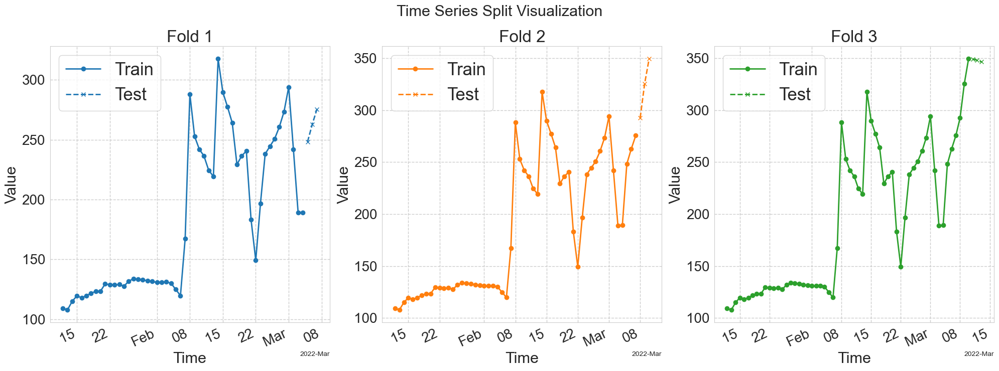

In [114]:
# Initialize the 1x3 grid of subplots
fig, axs = plt.subplots(1, 3, figsize=(20, 7))

# Aesthetics
colors = ['#1f77b4', '#ff7f0e', '#2ca02c']  # Example colors

# Improve x-axis date formatting
locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)

# Initialize TimeSeriesSplit
tsp = TimeSeriesSplit(n_splits=3, test_size=3)

for fold_idx, (train_index, test_index) in enumerate(tsp.split(y_rs_o)):
    
    y_train, y_test = y_rs_o.iloc[train_index], y_rs_o.iloc[test_index]
    y_train_orig = reverse_transform(y_train.values.reshape(-1, 1), scaler_kw, qt_kw)
    y_test_orig = reverse_transform(y_test.values.reshape(-1, 1), scaler_kw, qt_kw)

    # Plotting
    ax = axs[fold_idx]
    ax.plot(y_train.index, y_train_orig, linewidth=2, color=colors[fold_idx], label='Train', marker='o')
    ax.plot(y_test.index, y_test_orig, linewidth=2, color=colors[fold_idx], linestyle='--', label='Test', marker='x')
    ax.set_title(f"Fold {fold_idx + 1}")
    ax.legend()
    ax.grid(True, linestyle='--', linewidth=0.5)
    ax.xaxis.set_major_locator(locator)
    ax.xaxis.set_major_formatter(formatter)
    ax.set_xlabel("Time")
    ax.set_ylabel("Value")

 # Adjustments for aesthetics
for ax in axs.ravel():
    # Adjust font sizes
    ax.tick_params(axis='both', which='major', labelsize=20)  # Adjust as needed
    ax.set_xlabel(ax.get_xlabel(), fontsize=22)
    ax.set_ylabel(ax.get_ylabel(), fontsize=22)
    ax.set_title(ax.get_title(), fontsize=24)
    
    # Rotate x-axis labels for clarity
    plt.setp(ax.get_xticklabels(), rotation=25, ha="right")

    ax.legend(fontsize=25)
    
    # Display grid
    ax.grid(True, which='both', linestyle='--', linewidth=1, alpha=1)   

# Layout adjustments
plt.tight_layout()
plt.suptitle('Time Series Split Visualization', fontsize=22, y=1.05)
plt.show()